<a href="https://colab.research.google.com/github/Kafleavinash/Machinelearning_soil/blob/main/5_31__SHAPY_ALL__latest_train_test_gridsearchcvml.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers
import shap
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Filter_combined_CSV_files.csv to Filter_combined_CSV_files.csv


In [ ]:
import pandas as pd

# Load CSV
df = pd.read_csv('/content/Filter_combined_CSV_files.csv')

# Check structure
df.head()
df.describe()
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 769 entries, 0 to 768
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SAMPLEDATE                754 non-null    object 
 1   lati                      705 non-null    float64
 2   long                      705 non-null    float64
 3   OM                        769 non-null    float64
 4   Relative_Elev             769 non-null    float64
 5   Slope                     769 non-null    float64
 6   Aspect                    768 non-null    float64
 7   Profile_curva             769 non-null    float64
 8   Tang_curva                769 non-null    float64
 9   Senti_BI_1                769 non-null    float64
 10  Senti_BI_2                769 non-null    float64
 11  Planet_BI_1               766 non-null    float64
 12  Planet_BI_2               766 non-null    float64
 13  Polaris_SC                769 non-null    float64
 14  gNASGO_SC 

In [ ]:
# Drop the dependent variable from the dataset to get the features (X)
X = df.drop(columns=["OM"])  # <-- replace with actual column name if different

# Select the dependent variable (y)
y = df["OM"]


In [ ]:
print("Independent Variables (X):")
print(X.head())

print("\nDependent Variable (y):")
print(y.head())


Independent Variables (X):
   SAMPLEDATE    lati    long  Relative_Elev     Slope      Aspect  \
0  2022-06-08  44.384 -94.121       6.350006  0.226563  288.504852   
1  2022-06-08  44.383 -94.121       5.299988  1.450022  237.093048   
2  2022-06-08  44.382 -94.121       4.569977  1.114162  224.984100   
3  2022-06-08  44.381 -94.121       3.049988  0.143161   90.087471   
4  2022-06-08  44.376 -94.121       4.639984  2.481674   33.235489   

   Profile_curva  Tang_curva  Senti_BI_1   Senti_BI_2  ...  n_Polaris  \
0      -0.031094   -0.042257  933.025207  2037.278795  ...   1.272823   
1      -0.080120   -0.019543  930.634888  2043.143683  ...   1.272783   
2      -0.061876   -0.037807  946.033813  2024.733288  ...   1.310815   
3      -0.032168   -0.077811  909.583008  2079.700539  ...   1.282627   
4       0.026937    0.043010  942.244690  1937.962848  ...   1.268121   

   Theta_r_Polaris  Theta_s_Polaris     MRRTF  Valley_Depth  \
0         0.095672         0.507608  3.947627     

In [ ]:
df_m = df

In [ ]:
df_m.head()

,SAMPLEDATE,lati,long,OM,Relative_Elev,Slope,Aspect,Profile_curva,Tang_curva,Senti_BI_1,...,n_Polaris,Theta_r_Polaris,Theta_s_Polaris,MRRTF,Valley_Depth,Terrain_Ruggedness_Index,Slope_Height,Convergence_Index,Convexity,Mid_Slope_Position
0,2022-06-08,44.384,-94.121,4.79,6.350006,0.226563,288.504852,-0.031094,-0.042257,933.025207,...,1.272823,0.095672,0.507608,3.947627,0.082918,0.084871,0.288607,-83.609917,47.368896,0.553635
1,2022-06-08,44.383,-94.121,6.39,5.299988,1.450022,237.093048,-0.080120,-0.019543,930.634888,...,1.272783,0.093282,0.547380,0.116676,0.350111,0.169100,0.155899,-13.922724,48.102909,0.383810
2,2022-06-08,44.382,-94.121,5.19,4.569977,1.114162,224.984100,-0.061876,-0.037807,946.033813,...,1.310815,0.078316,0.501798,0.089571,0.201378,0.181121,0.495283,-19.467302,51.340260,0.421876
3,2022-06-08,44.381,-94.121,4.10,3.049988,0.143161,90.087471,-0.032168,-0.077811,909.583008,...,1.282627,0.088348,0.564284,0.008647,0.188092,0.129995,0.401767,-71.930679,46.769714,0.362247
4,2022-06-08,44.376,-94.121,5.89,4.639984,2.481674,33.235489,0.026937,0.043010,942.244690,...,1.268121,0.102729,0.496735,3.636065,0.093054,0.123691,0.289381,52.043789,51.582481,0.513358


In [ ]:
df_m.shape

(769, 39)

In [ ]:
df_m.columns

Index(['SAMPLEDATE', 'lati', 'long', 'OM', 'Relative_Elev', 'Slope', 'Aspect',
       'Profile_curva', 'Tang_curva', 'Senti_BI_1', 'Senti_BI_2',
       'Planet_BI_1', 'Planet_BI_2', 'Polaris_SC', 'gNASGO_SC', 'MRVBF', 'TWI',
       'Clay_polaris', 'SAND_Polaris', 'SILT_Polaris', 'BD_Polaris',
       'PH_Polaris', 'pctearthmc', 'ncci3all', 'aws_5_20s', 'Alpha_Polaris',
       'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris',
       'Theta_r_Polaris', 'Theta_s_Polaris', 'MRRTF', 'Valley_Depth',
       'Terrain_Ruggedness_Index', 'Slope_Height', 'Convergence_Index',
       'Convexity', 'Mid_Slope_Position'],
      dtype='object')

In [ ]:
# Basic descriptive statistics
print(df['OM'].describe())


count    769.000000
mean       6.397659
std        3.097877
min        0.500000
25%        4.400000
50%        5.760000
75%        7.820000
max       12.970000
Name: OM, dtype: float64


In [ ]:
# More detailed summary
print("Variance:", df['OM'].var())
print("Skewness:", df['OM'].skew())
print("Kurtosis:", df['OM'].kurt())


Variance: 9.59684060772918
Skewness: 0.5654152999718535
Kurtosis: -0.29285929189232895


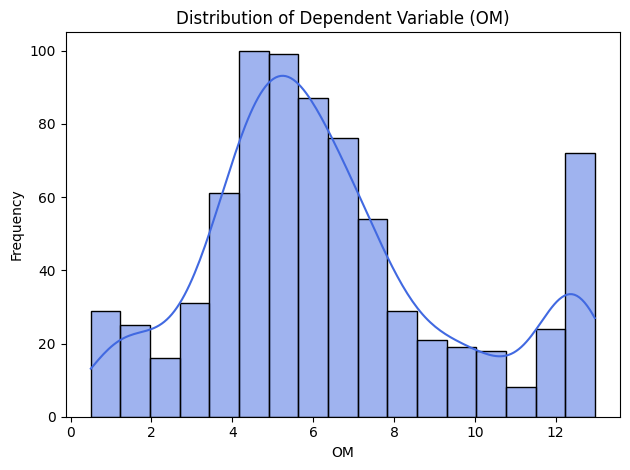

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df['OM'], kde=True, color='royalblue')
plt.title('Distribution of Dependent Variable (OM)')
plt.xlabel('OM')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [ ]:
from scipy.stats import shapiro

stat, p = shapiro(df['OM'])
print(f'Statistic={stat:.3f}, p-value={p:.3f}')
if p > 0.05:
    print("Likely Gaussian (normal distribution)")
else:
    print("Not normally distributed")


Statistic=0.940, p-value=0.000
Not normally distributed


RANDOM FOREST

Model: RandomForestRegressor
Setup: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}
Average Metrics Across 10-Fold CV:
MBE=0.0168, MAE=1.2884, RMSE=1.8680, R²=0.6256


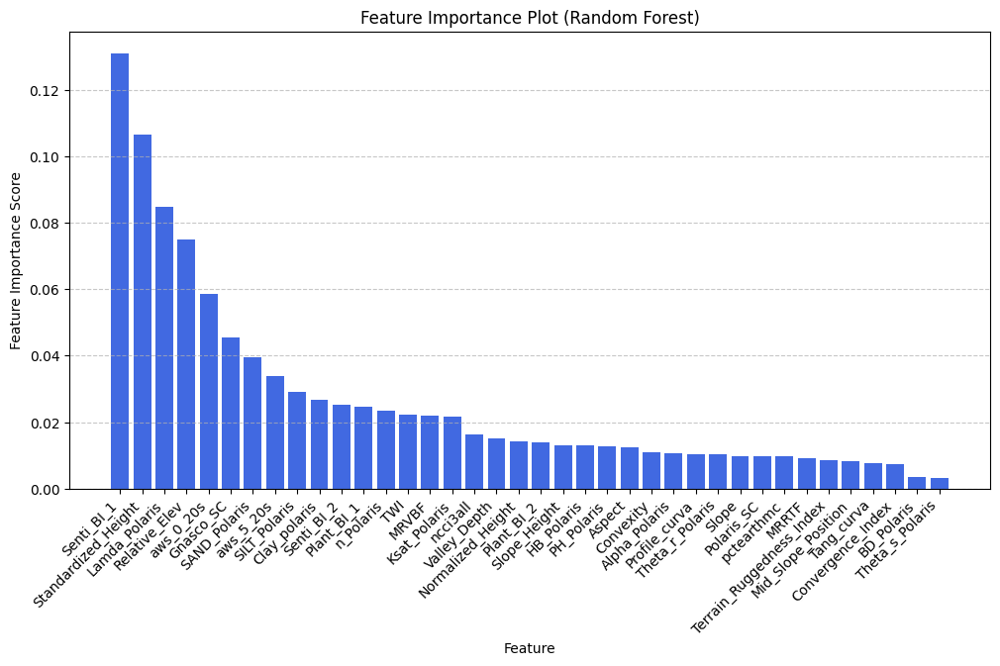

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # Import matplotlib.pyplot
from sklearn.model_selection import KFold, GridSearchCV  # Import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'rootznaws'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Handle missing values in y
# Remove rows with NaN in 'OM' column:

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X) #

# Define the hyperparameter grid


# Initialize model
rf = RandomForestRegressor(random_state=42)

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Fit the GridSearchCV object to your data to find the best hyperparameters
# This line is added to perform the grid search before accessing best_params_
#.fit(X_scaled, y)

# Get the best hyperparameters and model
#best_params = grid_search.best_params_
#(f"Best Hyperparameters: {best_params}")
#best_rf_model = grid_search.best_estimator_

# ... (Rest of your code using best_rf_model for evaluation) ...

# ... (Perform cross-validation using best_rf_model) ...

# ... (Calculate and print average metrics) ...

# ... (Create DataFrame and plot feature importance using best_rf_model) ...

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]



    # Train model
    rf.fit(X_train, y_train)

    # Predictions
    y_pred = rf.predict(X_test)

    # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: RandomForestRegressor")
print(f"Setup: {rf.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_rf = pd.DataFrame({
    'Actual OM': y_test.values,
    'Predicted OM': y_pred
})


# Extract feature importances
feature_importances = rf.feature_importances_
feature_names = X.columns  # Get the feature names

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Random Forest)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

RFE_RANDOM FOREST

Selected Top 90% Features (16 out of 32):
['Relative_Elev', 'Senti_BI_1', 'gNASGO_SC', 'MRVBF', 'TWI', 'Clay_polaris', 'SAND_Polaris', 'SILT_Polaris', 'ncci3all', 'aws_5_20s', 'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris', 'MRRTF', 'Valley_Depth']
Model: RandomForestRegressor
Setup: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}
Average Metrics Across 10-Fold CV (with 90% selected features):
MBE=0.0228, MAE=1.4027, RMSE=2.0426, R²=0.5564


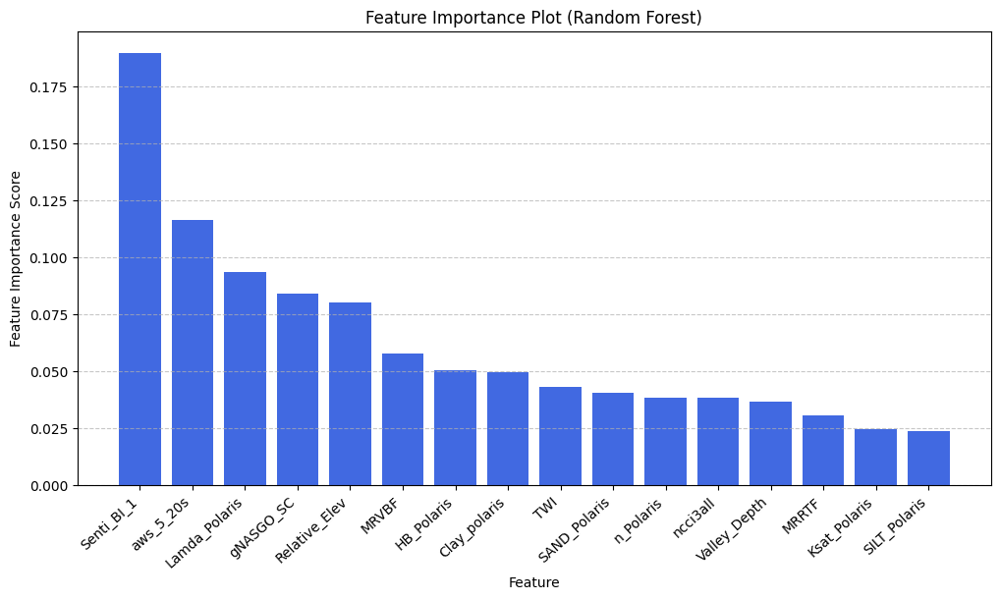

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2','Planet_BI_1', 'Planet_BI_2'
                       ])  # Features
y = df_m['OM']  # Target variable



# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Remove rows with NaN in 'OM' column:
X = X[y.notna()]  # Keep rows in X where y is not NaN
y = y.dropna()  # Remove NaN values from y

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize model
rf = RandomForestRegressor(random_state=42)

# Set the number of features to select (90% of total features)
num_features_to_select = int(0.50 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=rf, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []


# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    rf.fit(X_train, y_train)

    # Predictions
    y_pred = rf.predict(X_test)

     # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: RandomForestRegressor")
print(f"Setup: {rf.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_rf_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances for the selected features
feature_importances = rf.feature_importances_

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': selected_features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Random Forest)")
plt.xticks(rotation=42, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
fold_importances = []  # To store feature importances from each fold


In [ ]:
# Train model
rf.fit(X_train, y_train)

# Predictions
y_pred = rf.predict(X_test)

# Extend predictions
all_y_test.extend(y_test)
all_y_pred.extend(y_pred)

# Compute metrics...


In [ ]:
# Train model
rf.fit(X_train, y_train)

# Store feature importances from this fold
fold_importances.append(rf.feature_importances_)

# Predictions
y_pred = rf.predict(X_test)

# Extend predictions
all_y_test.extend(y_test)
all_y_pred.extend(y_pred)

# Compute metrics
mbe = np.mean(y_pred - y_test)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

# Store metrics
mbe_list.append(mbe)
mae_list.append(mae)
rmse_list.append(rmse)
r2_list.append(r2)


In [ ]:
# Average feature importances across all folds
avg_importances = np.mean(fold_importances, axis=0)

# Normalize: make the sum = 1
normalized_importances = avg_importances / np.sum(avg_importances)

# Create DataFrame with normalized importances
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)


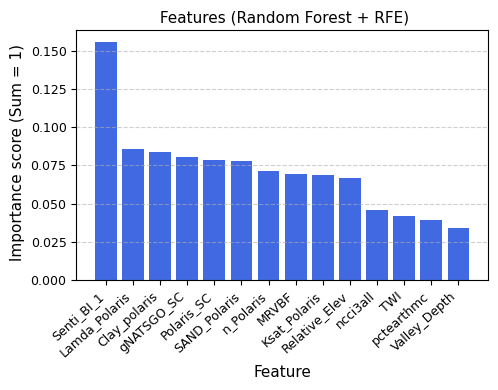

In [ ]:
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel(" Importance score (Sum = 1)", fontsize=11)
plt.xlabel("Feature", fontsize=11)
plt.title(" Features (Random Forest + RFE)", fontsize=11)
plt.xticks(rotation=42, ha="right", fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


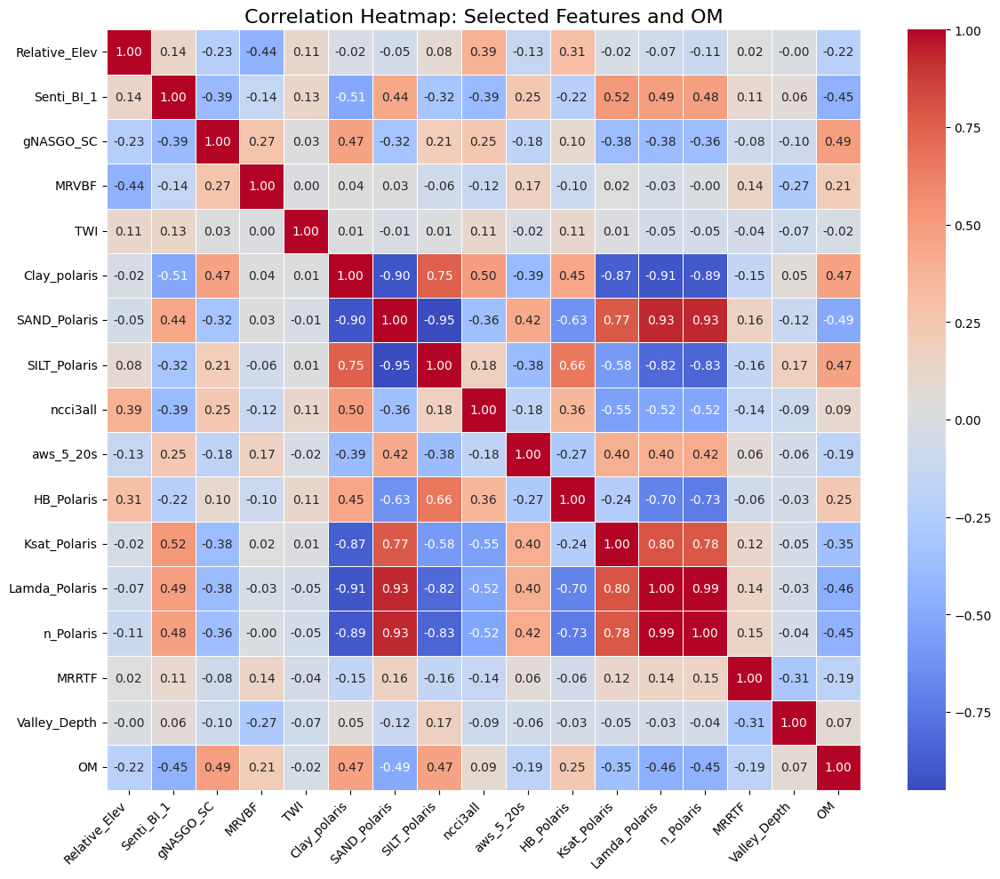

In [ ]:
# Step: Add 'OM' to the list of selected features if not already included
features_with_target = selected_features.tolist() + ['OM']

# Step: Create a DataFrame using only the selected features + target from the original dataset
df_selected_corr = df_m[features_with_target].dropna()

# Step: Compute Correlation Matrix
correlation_matrix = df_selected_corr.corr()

# Step: Plot Correlation Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap: Selected Features and OM", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


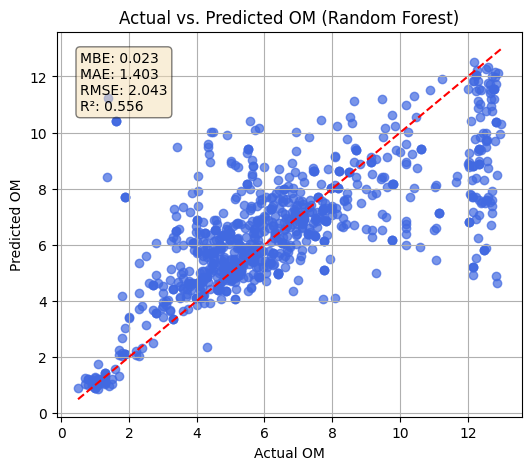

In [ ]:
# Create scatter plot
plt.figure(figsize=(6, 5))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Random Forest)")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.3f}',
    f'MAE: {avg_mae:.3f}',
    f'RMSE: {avg_rmse:.3f}',
    f'R²: {avg_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

In [ ]:
r2_scores_vs_features = []

# Loop over different percentages of features
for pct in range(10, 101, 10):  # From 10% to 100% in steps of 10
    num_feats = int(pct / 100 * X.shape[1])
    rfe = RFE(estimator=rf, n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_index, test_index in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_index], X_rfe[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        rf.fit(X_train, y_train)
        y_pred = rf.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2_temp = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2_temp))


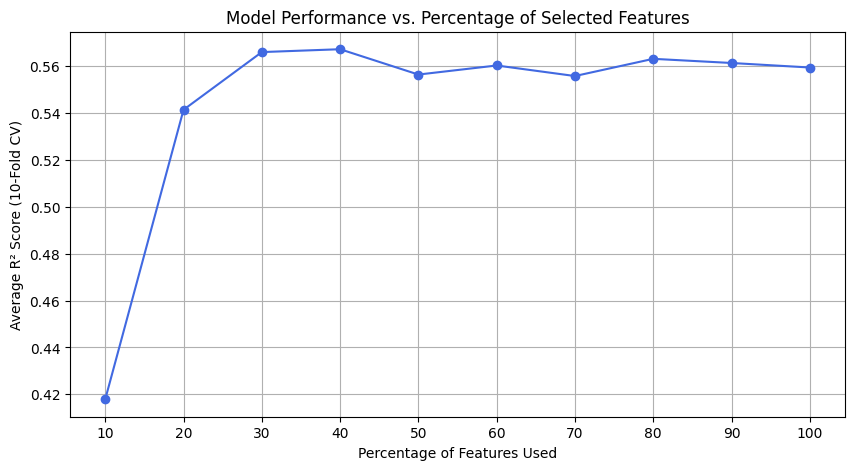

In [ ]:
# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot R² vs. Feature % graph
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='royalblue')
plt.title("Model Performance vs. Percentage of Selected Features")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.show()


Gridsearch_CV_Randomforest


Selected Features (11):
['Relative_Elev', 'Senti_BI_1', 'Polaris_SC', 'gNASGO_SC', 'MRVBF', 'TWI', 'Clay_polaris', 'SAND_Polaris', 'ncci3all', 'Lamda_Polaris', 'n_Polaris']
Fitting 10 folds for each of 48 candidates, totalling 480 fits

✅ Best Hyperparameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

📊 Average Metrics on 10-Fold Training Set:
MBE = -0.0053, MAE = 1.0633, RMSE = 1.4721, R² = 0.5787

📊 Evaluation on Unseen 20% Test Set:
MBE = 0.0006, MAE = 1.0037, RMSE = 1.4556, R² = 0.5874


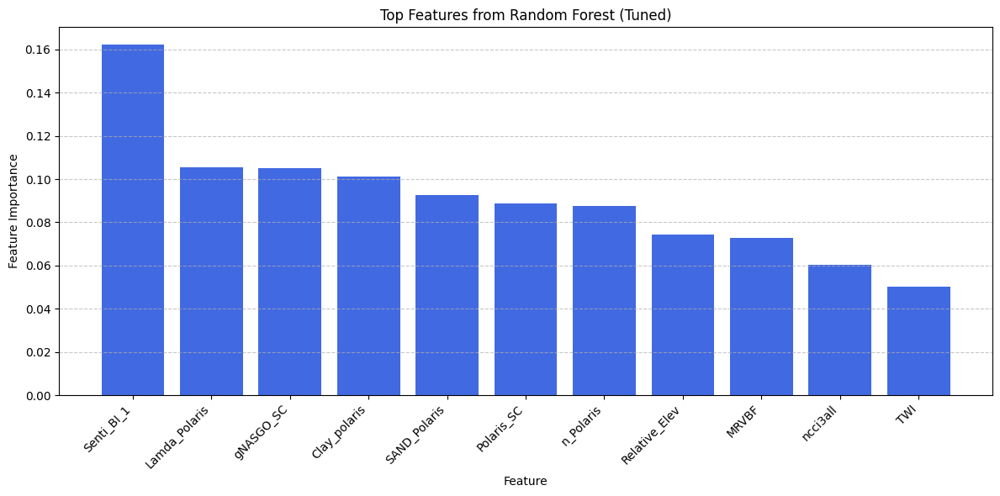

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Filter data: Remove rows where OM > 12
df_filtered = df_m[df_m['OM'] <= 12]

# Define features and target
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']

# Remove NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Split into 80% train and 20% unseen test
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# Feature Selection with RFE
rf_base = RandomForestRegressor(random_state=42)
num_features_to_select = int(0.35 * X.shape[1])
rfe = RFE(estimator=rf_base, n_features_to_select=num_features_to_select)
X_train_rfe = rfe.fit_transform(X_train_scaled, y_train_full)
X_test_rfe = X_test_scaled[:, rfe.support_]
selected_features = X.columns[rfe.support_]

print(f"\nSelected Features ({len(selected_features)}):")
print(selected_features.tolist())

# Grid Search with Cross-Validation (5-fold)
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_rfe, y_train_full)
best_rf = grid_search.best_estimator_
print("\n✅ Best Hyperparameters:", grid_search.best_params_)

# ---- Evaluate on Train folds ----
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_mbe_list, train_mae_list, train_rmse_list, train_r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_rf.fit(X_train_cv, y_train_cv)
    y_val_pred = best_rf.predict(X_val_cv)

    train_mbe_list.append(np.mean(y_val_pred - y_val_cv))
    train_mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    train_rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    train_r2_list.append(r2_score(y_val_cv, y_val_pred))

print("\n📊 Average Metrics on 10-Fold Training Set:")
print(f"MBE = {np.mean(train_mbe_list):.4f}, MAE = {np.mean(train_mae_list):.4f}, "
      f"RMSE = {np.mean(train_rmse_list):.4f}, R² = {np.mean(train_r2_list):.4f}")

# ---- Evaluate on Unseen Test Set ----
y_test_pred = best_rf.predict(X_test_rfe)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("\n📊 Evaluation on Unseen 20% Test Set:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# ---- Feature Importance ----
importances = best_rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# ---- Plot Feature Importance ----
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance")
plt.xlabel("Feature")
plt.title("Top Features from Random Forest (Tuned)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


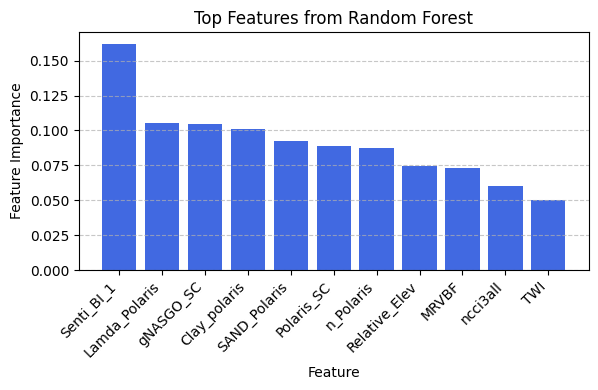

In [ ]:
# ---- Plot Feature Importance ----
plt.figure(figsize=(6, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance")
plt.xlabel("Feature")
plt.title("Top Features from Random Forest")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

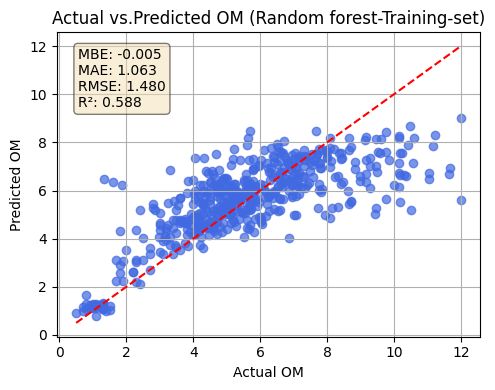

In [ ]:
# === Collect predictions and actual values from 10-fold CV ===
train_actual = []
train_predicted = []

kf = KFold(n_splits=10, shuffle=True, random_state=42)
for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_rf.fit(X_train_cv, y_train_cv)
    y_val_pred = best_rf.predict(X_val_cv)

    train_actual.extend(y_val_cv)
    train_predicted.extend(y_val_pred)

# === Compute metrics ===
train_actual = np.array(train_actual)
train_predicted = np.array(train_predicted)
train_mbe = np.mean(train_predicted - train_actual)
train_mae = mean_absolute_error(train_actual, train_predicted)
train_rmse = np.sqrt(mean_squared_error(train_actual, train_predicted))
train_r2 = r2_score(train_actual, train_predicted)

# === Plot: Actual vs Predicted for Training Set ===
plt.figure(figsize=(5, 4))
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)],
         [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs.Predicted OM (Random forest-Training-set)")
plt.grid(True)

# Metrics text
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


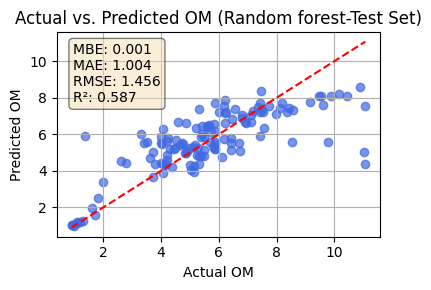

In [ ]:
# === Compute metrics on test set ===
test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Plot: Actual vs Predicted for Test Set ===
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_test_pred, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)],
         [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Random forest-Test Set)")
plt.grid(True)

# Metrics text
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


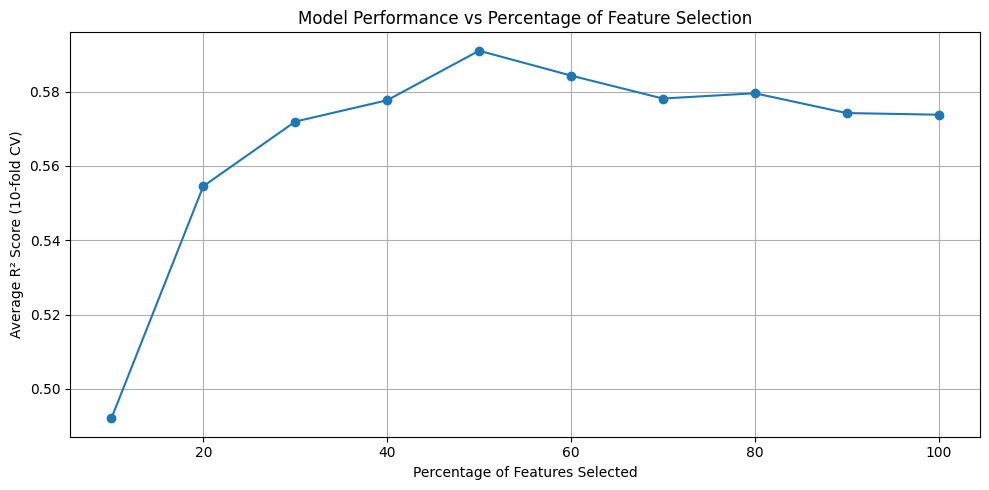

In [ ]:
from sklearn.base import clone

percentages = list(range(10, 101, 10))  # 10% to 100%
r2_scores = []

for pct in percentages:
    num_features = max(1, int(pct / 100.0 * X.shape[1]))

    # RFE with the current percentage of features
    rf_clone = clone(rf_base)
    rfe = RFE(estimator=rf_clone, n_features_to_select=num_features)
    X_rfe = rfe.fit_transform(X_train_scaled, y_train_full)

    # Cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    r2_list = []

    for train_idx, val_idx in kf.split(X_rfe):
        X_train_cv, X_val_cv = X_rfe[train_idx], X_rfe[val_idx]
        y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

        rf_clone.fit(X_train_cv, y_train_cv)
        y_val_pred = rf_clone.predict(X_val_cv)
        r2 = r2_score(y_val_cv, y_val_pred)
        r2_list.append(r2)

    avg_r2 = np.mean(r2_list)
    r2_scores.append(avg_r2)

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(percentages, r2_scores, marker='o')
plt.title("Model Performance vs Percentage of Feature Selection")
plt.xlabel("Percentage of Features Selected")
plt.ylabel("Average R² Score (10-fold CV)")
plt.grid(True)
plt.tight_layout()
plt.show()


WITHout above 12, RANDOM FOREST for Planet_BI1


Selected Features (11):
['Relative_Elev', 'Planet_BI_1', 'Polaris_SC', 'gNASGO_SC', 'MRVBF', 'TWI', 'Clay_polaris', 'SAND_Polaris', 'PH_Polaris', 'Ksat_Polaris', 'Lamda_Polaris']
Fitting 10 folds for each of 48 candidates, totalling 480 fits

✅ Best Hyperparameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

📊 Average Metrics on 10-Fold Training Set:
MBE = 0.0134, MAE = 1.1010, RMSE = 1.5062, R² = 0.5761

📊 Evaluation on Unseen 20% Test Set:
MBE = 0.0884, MAE = 0.9886, RMSE = 1.4466, R² = 0.5261


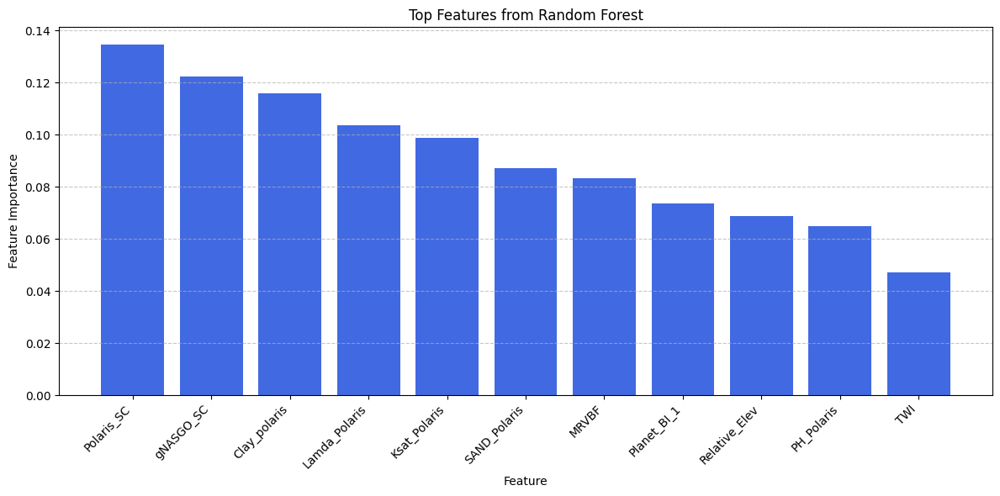

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Filter data: Remove rows where OM > 12
df_filtered = df_m[df_m['OM'] <= 12]

# Define features and target
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']

# Remove NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Split into 80% train and 20% unseen test
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# Feature Selection with RFE
rf_base = RandomForestRegressor(random_state=42)
num_features_to_select = int(0.35 * X.shape[1])
rfe = RFE(estimator=rf_base, n_features_to_select=num_features_to_select)
X_train_rfe = rfe.fit_transform(X_train_scaled, y_train_full)
X_test_rfe = X_test_scaled[:, rfe.support_]
selected_features = X.columns[rfe.support_]

print(f"\nSelected Features ({len(selected_features)}):")
print(selected_features.tolist())

# Grid Search with Cross-Validation (5-fold)
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_rfe, y_train_full)
best_rf = grid_search.best_estimator_
print("\n✅ Best Hyperparameters:", grid_search.best_params_)

# ---- Evaluate on Train folds ----
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_mbe_list, train_mae_list, train_rmse_list, train_r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_rf.fit(X_train_cv, y_train_cv)
    y_val_pred = best_rf.predict(X_val_cv)

    train_mbe_list.append(np.mean(y_val_pred - y_val_cv))
    train_mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    train_rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    train_r2_list.append(r2_score(y_val_cv, y_val_pred))

print("\n📊 Average Metrics on 10-Fold Training Set:")
print(f"MBE = {np.mean(train_mbe_list):.4f}, MAE = {np.mean(train_mae_list):.4f}, "
      f"RMSE = {np.mean(train_rmse_list):.4f}, R² = {np.mean(train_r2_list):.4f}")

# ---- Evaluate on Unseen Test Set ----
y_test_pred = best_rf.predict(X_test_rfe)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("\n📊 Evaluation on Unseen 20% Test Set:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# ---- Feature Importance ----
importances = best_rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# ---- Plot Feature Importance ----
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance")
plt.xlabel("Feature")
plt.title("Top Features from Random Forest")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


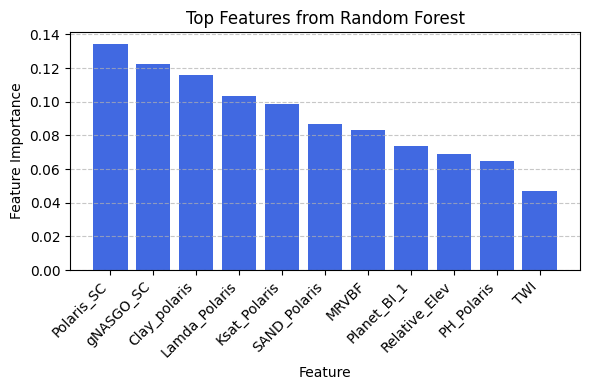

In [ ]:
# ---- Plot Feature Importance ----
plt.figure(figsize=(6, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance")
plt.xlabel("Feature")
plt.title("Top Features from Random Forest")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

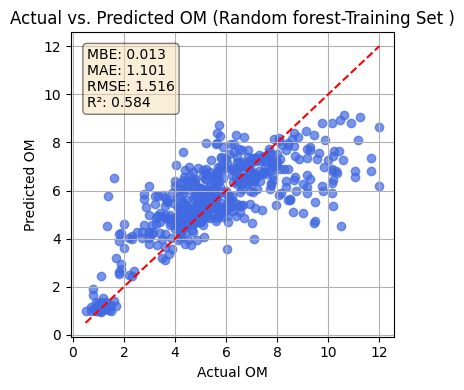

In [ ]:
# === Collect predictions for training (10-fold CV) ===
train_actual = []
train_predicted = []

kf = KFold(n_splits=10, shuffle=True, random_state=42)
for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_rf.fit(X_train_cv, y_train_cv)
    y_val_pred = best_rf.predict(X_val_cv)

    train_actual.extend(y_val_cv)
    train_predicted.extend(y_val_pred)

# === Compute training metrics ===
train_actual = np.array(train_actual)
train_predicted = np.array(train_predicted)
train_mbe = np.mean(train_predicted - train_actual)
train_mae = mean_absolute_error(train_actual, train_predicted)
train_rmse = np.sqrt(mean_squared_error(train_actual, train_predicted))
train_r2 = r2_score(train_actual, train_predicted)

# === Scatter Plot: Training Set ===
plt.figure(figsize=(4, 4))
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)], [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Random forest-Training Set )")
plt.grid(True)

textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


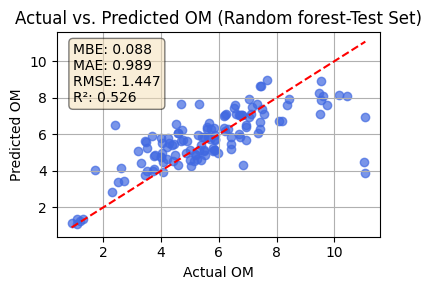

In [ ]:
# === Scatter Plot: Test Set ===
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_test_pred, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Random forest-Test Set)")
plt.grid(True)

textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


Nofilter OM>12 RFE Random forest

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Load full dataset without filtering OM > 12 ===
X = df_m.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_m['OM']

# === Remove NaNs ===
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Train-test split (80/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Standardize features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === RFE Feature Selection (30%) ===
rf_base = RandomForestRegressor(random_state=42)
num_features_to_select = int(0.35 * X.shape[1])
rfe = RFE(estimator=rf_base, n_features_to_select=num_features_to_select)
X_train_rfe = rfe.fit_transform(X_train_scaled, y_train_full)
X_test_rfe = X_test_scaled[:, rfe.support_]
selected_features = X.columns[rfe.support_]

print(f"\n✅ Selected Features ({len(selected_features)}):")
print(selected_features.tolist())

# === GridSearchCV (10-Fold) ===
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)
grid_search.fit(X_train_rfe, y_train_full)
best_rf = grid_search.best_estimator_
print("\n🎯 Best Hyperparameters:")
print(grid_search.best_params_)

# === 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_mbe_list, train_mae_list, train_rmse_list, train_r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_rf.fit(X_train_cv, y_train_cv)
    y_val_pred = best_rf.predict(X_val_cv)

    train_mbe_list.append(np.mean(y_val_pred - y_val_cv))
    train_mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    train_rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    train_r2_list.append(r2_score(y_val_cv, y_val_pred))

print("\n📊 Average Metrics on 10-Fold Training Set:")
print(f"MBE = {np.mean(train_mbe_list):.4f}, MAE = {np.mean(train_mae_list):.4f}, "
      f"RMSE = {np.mean(train_rmse_list):.4f}, R² = {np.mean(train_r2_list):.4f}")

# === Final Evaluation on 20% Unseen Test Set ===
y_test_pred = best_rf.predict(X_test_rfe)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("\n📊 Evaluation on Unseen 20% Test Set:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# === Feature Importance ===
importances = best_rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# === Plot Feature Importance ===
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance")
plt.xlabel("Feature")
plt.title("Top Features from Random Forest (Tuned, All Data Included)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



✅ Selected Features (11):
['Relative_Elev', 'Senti_BI_1', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'SILT_Polaris', 'aws_5_20s', 'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris']
Fitting 10 folds for each of 48 candidates, totalling 480 fits


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-25-3674245328>", line 56, in <cell line: 0>
    grid_search.fit(X_train_rfe, y_train_full)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 1024, in fit
    self._run_search(evaluate_candidates)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 1571, in _run_search
    evaluate_candidates(ParameterGrid(self.param_grid))
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 970, in evaluate_candidates
    out = parallel(
          ^^^^^^^^^
  File "/usr/local/lib/python3.11

TypeError: object of type 'NoneType' has no len()

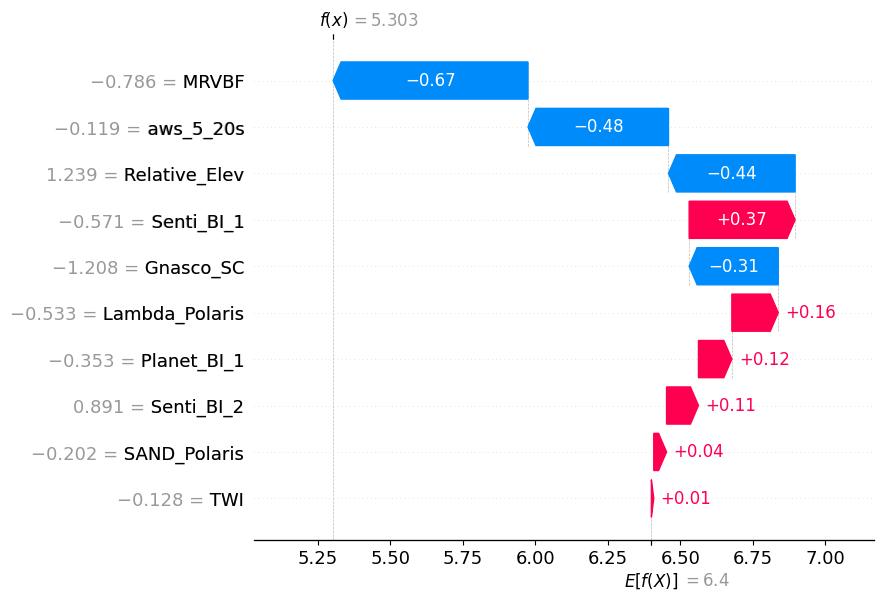

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

# Step 1: Standardize X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Fit Random Forest to full data
rf = RandomForestRegressor( random_state=42)
rf.fit(X_scaled, y)

# Step 3: Select top 40% features using feature importances
importances = rf.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.3)
top_indices = np.argsort(importances)[-n_select:]
selected_features = X.columns[top_indices]
X_selected = X[selected_features]
X_selected_scaled = X_scaled[:, top_indices]

# Step 4: Train model again on selected features
rf.fit(X_selected_scaled, y)

# Step 5: Create SHAP explainer and calculate values
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_selected_scaled)

# Step 6: Prepare DataFrame for SHAP with feature names
X_df_selected = pd.DataFrame(X_selected_scaled, columns=selected_features)

# Step 7: Choose a sample to explain (e.g., first row)
sample_index = 0
shap_values_sample = shap_values[sample_index]

# Optional: Sort features by importance for better plot clarity
feature_order = selected_features[np.argsort(importances[top_indices])[::-1]].tolist()
shap_series = pd.Series(shap_values_sample, index=selected_features)
shap_values_sorted = shap_series.loc[feature_order].values
data_values_sorted = X_df_selected.iloc[sample_index].loc[feature_order].values

# Step 8: Create SHAP explanation
explanation = shap.Explanation(
    values=shap_values_sorted,
    base_values=explainer.expected_value,
    data=data_values_sorted,
    feature_names=feature_order
)

# Step 9: Waterfall Plot
plt.figure(figsize=(8, 4))
shap.plots.waterfall(explanation, max_display=len(feature_order))
plt.tight_layout()
plt.savefig("shap_waterfall_rf_top_40_percent.png", dpi=300, bbox_inches='tight')
plt.show()


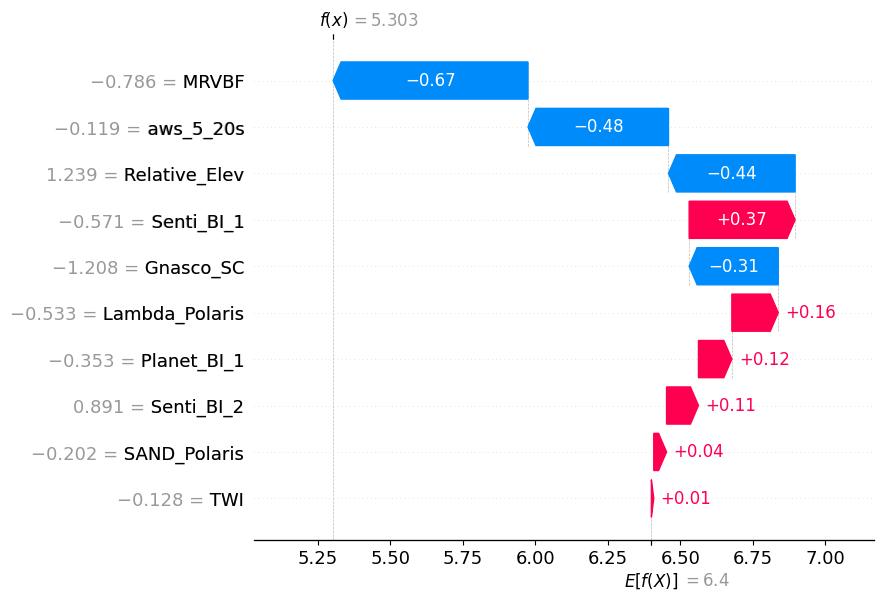

<Figure size 640x480 with 0 Axes>

In [ ]:
# Step 9: Waterfall Plot
plt.figure(figsize=(3, 4))
shap.plots.waterfall(explanation, max_display=len(feature_order))
plt.tight_layout()
plt.savefig("shap_waterfall_rf_top_40_percent.png", dpi=1000, bbox_inches='tight')
plt.show()

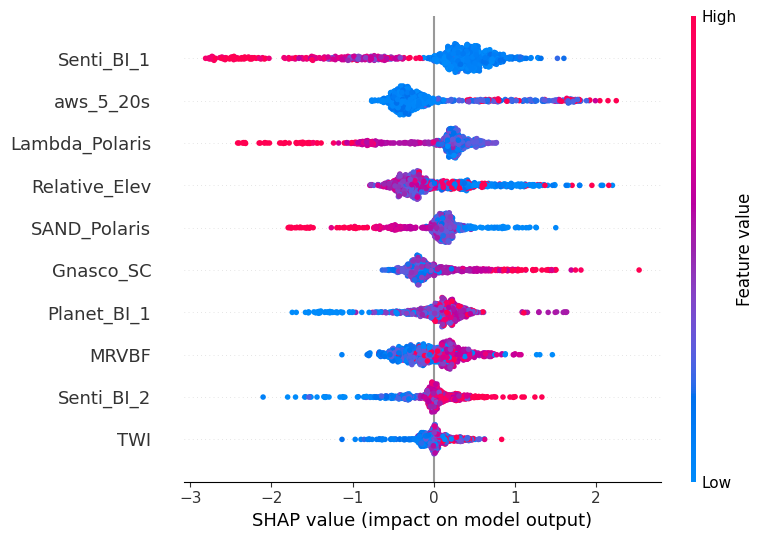

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

# Step 0: Train RF model if not already trained
rf = RandomForestRegressor( random_state=42)
rf.fit(X_scaled, y)

# Step 1: Get top 30% features by importance
importances = rf.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.3)
top_indices = np.argsort(importances)[-n_select:]
selected_features_importance = X.columns[top_indices]

# Step 2: Create scaled DataFrame with top 30% features
X_df_selected = pd.DataFrame(X_scaled[:, top_indices], columns=selected_features_importance)

# Step 3: Refit RF model on selected features
rf.fit(X_df_selected, y)

# Step 4: SHAP Explainer and SHAP values
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_df_selected)

# Step 5: SHAP summary plot (dot)
plt.figure(figsize=(8, 7))
shap.summary_plot(shap_values, X_df_selected, plot_type="dot", show=False)
plt.tight_layout()
plt.savefig("shap_summary_rf_importance_top_30percent.png", dpi=300, bbox_inches='tight')
plt.show()


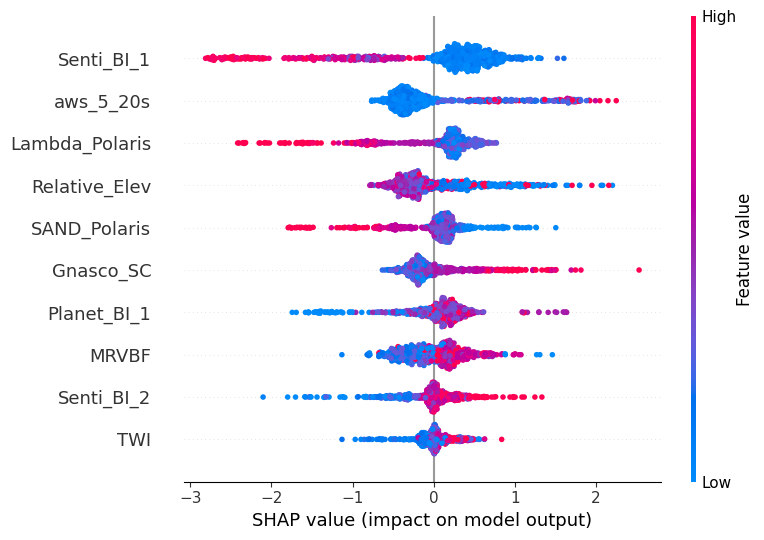

In [ ]:
# Step 5: SHAP summary plot (dot)
plt.figure(figsize=(3, 2))
shap.summary_plot(shap_values, X_df_selected, plot_type="dot", show=False)
plt.tight_layout()
plt.savefig("shap_summary_rf_importance_top_30percent.png", dpi=1000, bbox_inches='tight')
plt.show()

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

# Step 1: Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Fit the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_scaled, y)

# Step 3: Select top 40% features based on feature importances
importances = rf.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.4)
top_indices = np.argsort(importances)[-n_select:]
selected_features = X.columns[top_indices]
X_selected_scaled = X_scaled[:, top_indices]

# Step 4: Prepare DataFrame for SHAP
X_df_selected = pd.DataFrame(X_selected_scaled, columns=selected_features)

# Step 5: SHAP summary plot
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_selected_scaled)

# Plot the summary (beeswarm)
plt.figure(figsize=(10, 7))
shap.summary_plot(shap_values, X_df_selected, plot_type="dot", show=False)
plt.tight_layout()
plt.savefig("shap_summary_plot_top_40_percent.png", dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
from sklearn.feature_selection import SelectFromModel
import numpy as np

# Example: RandomForestRegressor already fitted as rf

# Get feature importances and sort them
importances = rf.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.4)  # 40% of total features

# Get indices of top 40% features
top_indices = np.argsort(importances)[-n_select:]

# Select feature names
selected_features = X.columns[top_indices]

# Reduce X and X_scaled to selected features
X_selected = X[selected_features]
X_selected_scaled = X_scaled[:, top_indices]


In [ ]:
from sklearn.ensemble import RandomForestRegressor  # or ExtraTreesRegressor
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

# Assuming X and y are already defined
# Standardize full feature set
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the model to get feature importances
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_scaled, y)

# Step 1: Select top 40% features based on feature importance
importances = rf.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.4)  # Select top 40%

# Get indices of top 40% features
top_indices = np.argsort(importances)[-n_select:]

# Select feature names
selected_features = X.columns[top_indices]

# Step 2: Reduce to selected features
X_selected = X[selected_features]  # For unscaled operations
X_selected_scaled = X_scaled[:, top_indices]  # For scaled model input

# Optional: Print selected features
print(f"Selected Top 40% Features ({len(selected_features)}):")
print(selected_features.tolist())


Selected Top 40% Features (15):
['Senti_BI_2', 'HB_Polaris', 'n_Polaris', 'Clay_polaris', 'aws_5_20s', 'TWI', 'MRVBF', 'Plant_BI_1', 'SAND_Polaris', 'Gnasco_SC', 'aws_0_20s', 'Relative_Elev', 'Lamda_Polaris', 'Standardized_Height', 'Senti_BI_1']


In [ ]:
# Summary plot
shap.summary_plot(shap_values, X_df)


NameError: name 'shap' is not defined

In [ ]:
import shap
import matplotlib.pyplot as plt


In [ ]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_scaled)
X_df = pd.DataFrame(X_scaled, columns=X.columns)  # For display


In [ ]:
# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Random Forest - All Folds)")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.4f}',
    f'MAE: {avg_mae:.4f}',
    f'RMSE: {avg_rmse:.4f}',
    f'R²: {avg_r2:.4f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

NameError: name 'all_y_test' is not defined

<Figure size 800x600 with 0 Axes>

Train tezt _CV random forest

EXTRA TREE

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

Model: ExtraTreesRegressor
Setup: {'bootstrap': False, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}
Average Metrics Across 10-Fold CV:
MBE=0.0275, MAE=1.2486, RMSE=1.8256, R²=0.6276


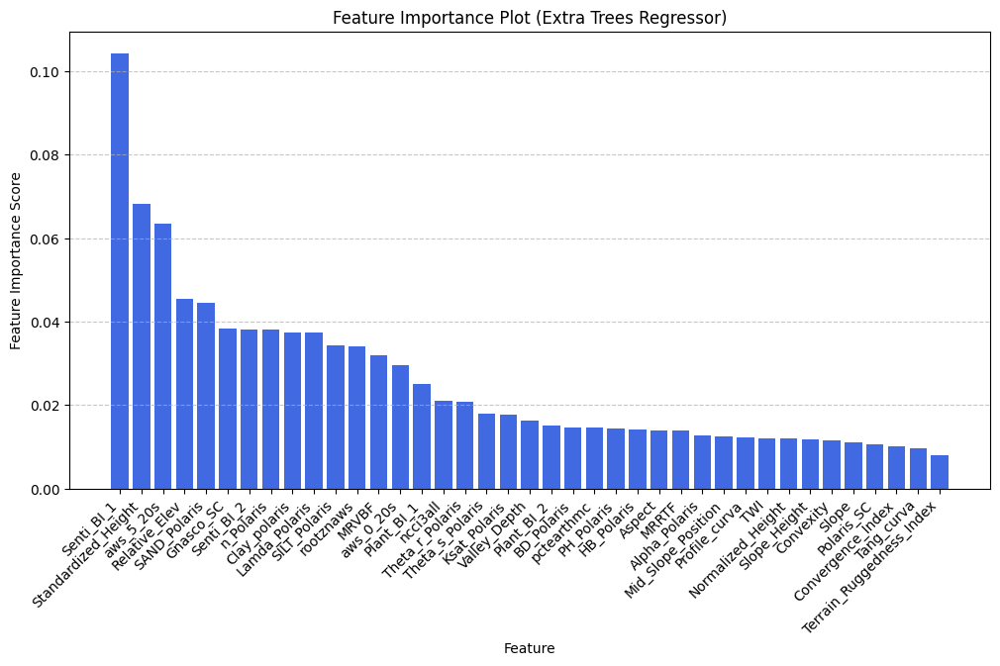

In [ ]:
# Initialize Extra Trees Regressor
et = ExtraTreesRegressor(n_estimators=100, random_state=42)

# Initialize K-Fold CV
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Metrics storage
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []
all_y_test = []
all_y_pred = []

# Cross-validation loop
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    et.fit(X_train, y_train)
    y_pred = et.predict(X_test)

    all_y_test.extend(y_test)
    all_y_pred.extend(y_pred)

    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Average metrics
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

print(f"Model: ExtraTreesRegressor")
print(f"Setup: {et.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Last fold's result
df_et = pd.DataFrame({
    'Actual OM': y_test.values,
    'Predicted OM': y_pred
})

# Feature Importance Plot
feature_importances = et.feature_importances_
feature_names = X.columns

feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Extra Trees Regressor)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

RFE Extra tress

Selected Top 40% Features (14 out of 32):
['Relative_Elev', 'Senti_BI_1', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'SAND_Polaris', 'SILT_Polaris', 'pctearthmc', 'ncci3all', 'aws_5_20s', 'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris']
Model: ExtraTreesRegressor
Setup: {'bootstrap': False, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}
Average Metrics Across 10-Fold CV (with 40% selected features):
MBE=0.0126, MAE=1.3463, RMSE=1.9890, R²=0.5814


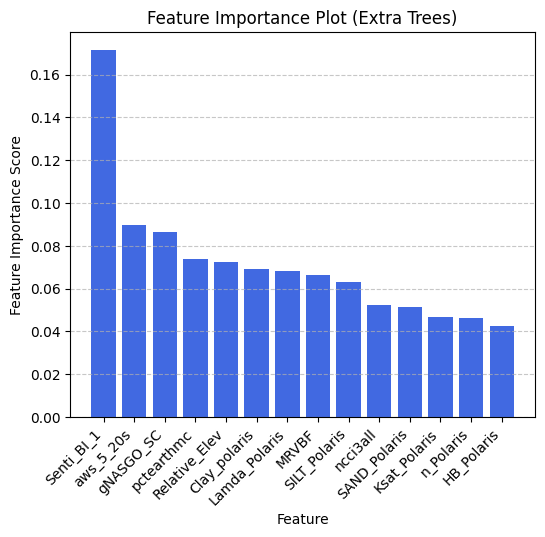

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2', 'Planet_BI_1','Planet_BI_2',

                       ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize Extra Trees model
et = ExtraTreesRegressor(n_estimators=100, random_state=42)

# Set number of features to select (40% of total)
num_features_to_select = int(0.45 * X.shape[1])

# Perform Recursive Feature Elimination (RFE)
rfe = RFE(estimator=et, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 40% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# K-Fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []
all_y_test = []
all_y_pred = []

# Cross-validation
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    et.fit(X_train, y_train)
    y_pred = et.predict(X_test)

    all_y_test.extend(y_test)
    all_y_pred.extend(y_pred)

    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Average metrics
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print performance
print(f"Model: ExtraTreesRegressor")
print(f"Setup: {et.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 40% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# DataFrame for predictions from the last fold
df_et_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Feature importance for selected features
feature_importances = et.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(6, 5))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Extra Trees)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


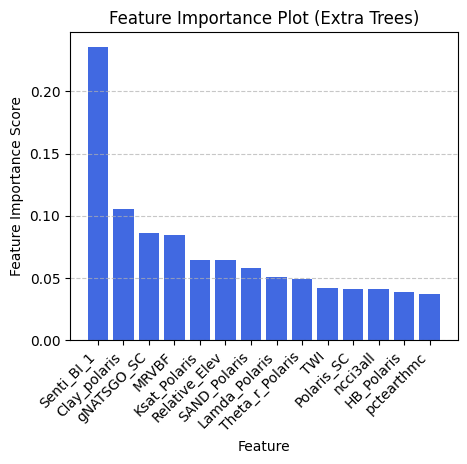

In [ ]:
# Plot Feature Importance
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Extra Trees)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Extra_tree_trainset_GRIDSEACH CV


✅ Selected Top 45% Features (11):
['Relative_Elev', 'Senti_BI_2', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'SAND_Polaris', 'SILT_Polaris', 'pctearthmc', 'aws_5_20s', 'Ksat_Polaris', 'Lamda_Polaris']
Fitting 10 folds for each of 48 candidates, totalling 480 fits

🎯 Best Hyperparameters:
{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

📊 10-Fold CV Metrics on 80% Training Set:
MBE = 0.0231
MAE = 1.4148
RMSE = 1.9948
R² = 0.5628

📊 Evaluation on 20% Unseen Test Set:
MBE = 0.0635
MAE = 1.5057
RMSE = 2.1093
R² = 0.5675


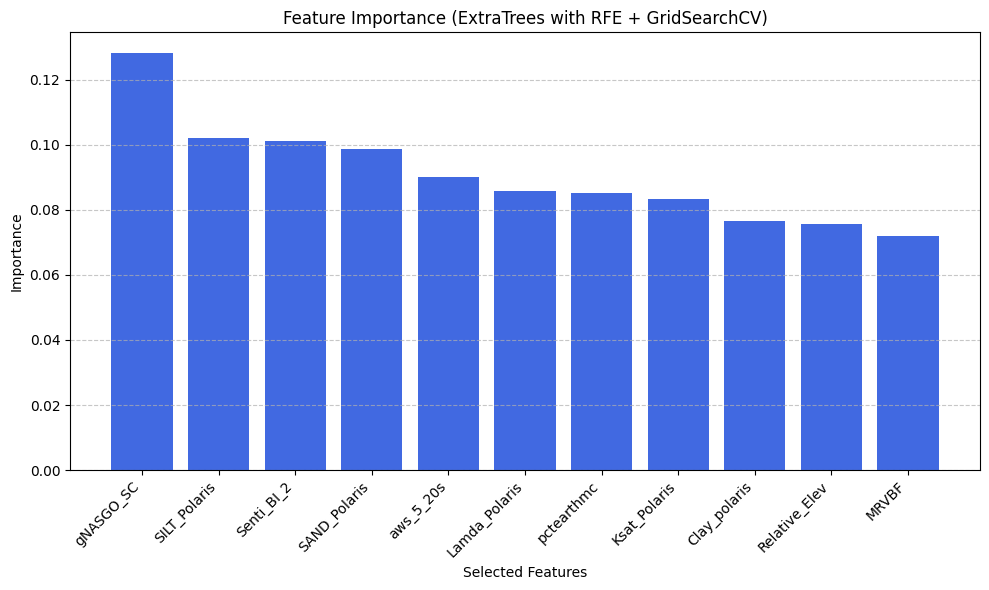

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.base import clone

# === Data Preprocessing ===
X = df_m.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2','Planet_BI_1','Planet_BI_2'])
y = df_m['OM']

X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Train-test split (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Feature Selection (RFE) ===
base_et = ExtraTreesRegressor(random_state=42)
num_features_to_select = int(0.35 * X.shape[1])

rfe = RFE(estimator=base_et, n_features_to_select=num_features_to_select)
X_train_rfe = rfe.fit_transform(X_train_scaled, y_train_full)
X_test_rfe = X_test_scaled[:, rfe.support_]
selected_features = X.columns[rfe.support_]

print(f"\n✅ Selected Top 45% Features ({len(selected_features)}):")
print(selected_features.tolist())

# === Hyperparameter Tuning with GridSearchCV (10-Fold) ===
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=ExtraTreesRegressor(random_state=42),
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)
grid_search.fit(X_train_rfe, y_train_full)
best_et = grid_search.best_estimator_
print("\n🎯 Best Hyperparameters:")
print(grid_search.best_params_)

# === 10-Fold Cross-Validation on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_et)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    mbe_list.append(np.mean(y_val_pred - y_val_cv))
    mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    r2_list.append(r2_score(y_val_cv, y_val_pred))

print("\n📊 10-Fold CV Metrics on 80% Training Set:")
print(f"MBE = {np.mean(mbe_list):.4f}")
print(f"MAE = {np.mean(mae_list):.4f}")
print(f"RMSE = {np.mean(rmse_list):.4f}")
print(f"R² = {np.mean(r2_list):.4f}")

# === Evaluation on Unseen 20% Test Set ===
best_et.fit(X_train_rfe, y_train_full)
y_test_pred = best_et.predict(X_test_rfe)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("\n📊 Evaluation on 20% Unseen Test Set:")
print(f"MBE = {test_mbe:.4f}")
print(f"MAE = {test_mae:.4f}")
print(f"RMSE = {test_rmse:.4f}")
print(f"R² = {test_r2:.4f}")

# === Feature Importance ===
importances = best_et.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# === Plot Feature Importance ===
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.title("Feature Importance (ExtraTrees with RFE + GridSearchCV)")
plt.ylabel("Importance")
plt.xlabel("Selected Features")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



✅ Selected Top 35% Features (11):
['Relative_Elev', 'Senti_BI_1', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'SAND_Polaris', 'BD_Polaris', 'pctearthmc', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris']
Fitting 10 folds for each of 48 candidates, totalling 480 fits

🎯 Best Hyperparameters:
{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}

📊 10-Fold CV Metrics on 80% Training Set:
MBE = -0.0237
MAE = 1.0683
RMSE = 1.4753
R² = 0.5799

📊 Evaluation on 20% Unseen Test Set:
MBE = 0.0760
MAE = 1.0186
RMSE = 1.4183
R² = 0.6083


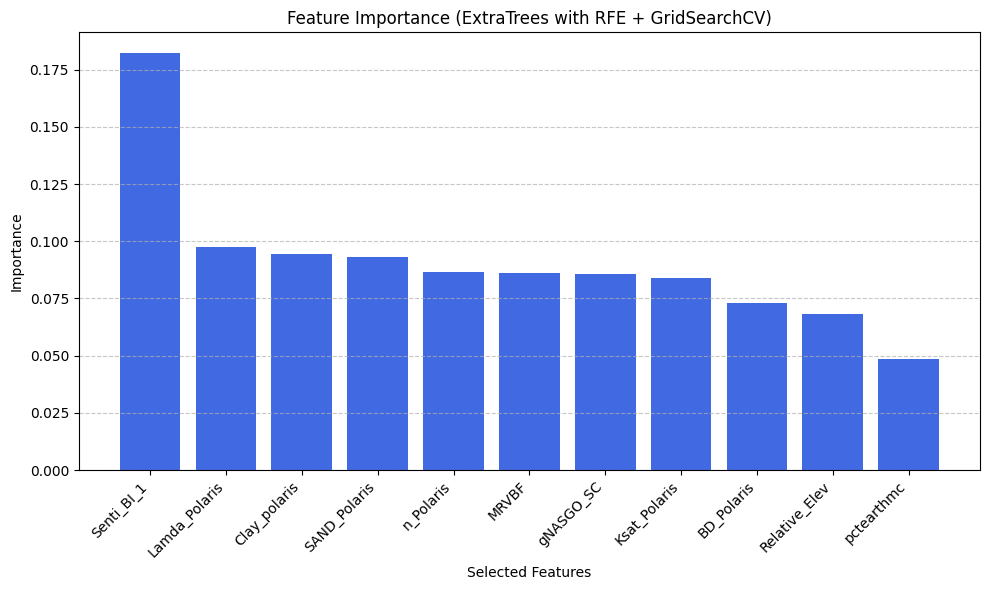

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.base import clone

# === Data Preprocessing ===
df_filtered = df_m[df_m['OM'] <= 12]  # <-- Drop rows with OM > 12
X = df_filtered.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2','Planet_BI_1','Planet_BI_2'])
y = df_filtered['OM']

# Remove NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Train-test split (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Feature Selection (RFE) ===
base_et = ExtraTreesRegressor(random_state=42)
num_features_to_select = int(0.35 * X.shape[1])

rfe = RFE(estimator=base_et, n_features_to_select=num_features_to_select)
X_train_rfe = rfe.fit_transform(X_train_scaled, y_train_full)
X_test_rfe = X_test_scaled[:, rfe.support_]
selected_features = X.columns[rfe.support_]

print(f"\n✅ Selected Top 35% Features ({len(selected_features)}):")
print(selected_features.tolist())

# === Hyperparameter Tuning with GridSearchCV (10-Fold) ===
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=ExtraTreesRegressor(random_state=42),
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)
grid_search.fit(X_train_rfe, y_train_full)
best_et = grid_search.best_estimator_
print("\n🎯 Best Hyperparameters:")
print(grid_search.best_params_)

# === 10-Fold Cross-Validation on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_et)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    mbe_list.append(np.mean(y_val_pred - y_val_cv))
    mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    r2_list.append(r2_score(y_val_cv, y_val_pred))

print("\n📊 10-Fold CV Metrics on 80% Training Set:")
print(f"MBE = {np.mean(mbe_list):.4f}")
print(f"MAE = {np.mean(mae_list):.4f}")
print(f"RMSE = {np.mean(rmse_list):.4f}")
print(f"R² = {np.mean(r2_list):.4f}")

# === Evaluation on Unseen 20% Test Set ===
best_et.fit(X_train_rfe, y_train_full)
y_test_pred = best_et.predict(X_test_rfe)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("\n📊 Evaluation on 20% Unseen Test Set:")
print(f"MBE = {test_mbe:.4f}")
print(f"MAE = {test_mae:.4f}")
print(f"RMSE = {test_rmse:.4f}")
print(f"R² = {test_r2:.4f}")

# === Feature Importance ===
importances = best_et.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# === Plot Feature Importance ===
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.title("Feature Importance (ExtraTrees with RFE + GridSearchCV)")
plt.ylabel("Importance")
plt.xlabel("Selected Features")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


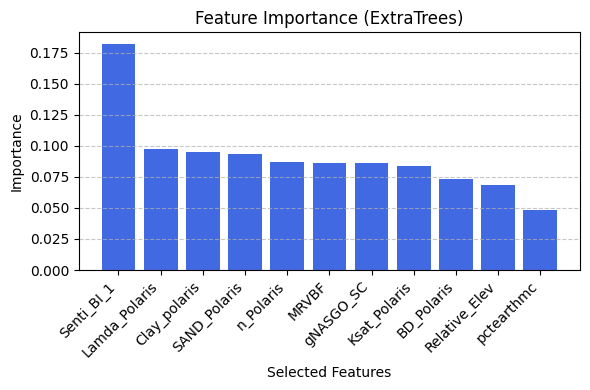

In [ ]:
# === Plot Feature Importance ===
plt.figure(figsize=(6, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.title("Feature Importance (ExtraTrees)")
plt.ylabel("Importance")
plt.xlabel("Selected Features")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# === Generate predictions from 10-fold CV on training set ===
train_actual = []
train_predicted = []

kf = KFold(n_splits=10, shuffle=True, random_state=42)
for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_et)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    train_actual.extend(y_val_cv)
    train_predicted.extend(y_val_pred)

# === Compute training metrics ===
train_actual = np.array(train_actual)
train_predicted = np.array(train_predicted)
train_mbe = np.mean(train_predicted - train_actual)
train_mae = mean_absolute_error(train_actual, train_predicted)
train_rmse = np.sqrt(mean_squared_error(train_actual, train_predicted))
train_r2 = r2_score(train_actual, train_predicted)

# === Plot: Training Set ===
plt.figure(figsize=(4, 4))
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)],
         [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Extra-Tree-Training Set)"fontsize=10)
plt.grid(True)

textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


SyntaxError: invalid syntax. Perhaps you forgot a comma? (<ipython-input-37-2976151677>, line 32)

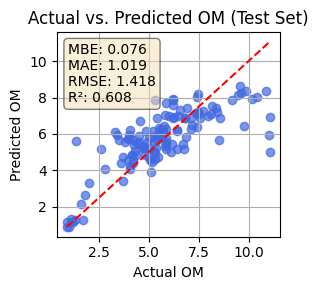

In [ ]:
# === Plot: Test Set ===
plt.figure(figsize=(3, 3))
plt.scatter(y_test, y_test_pred, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)],
         [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)"fontsize=10)
plt.grid(True)

textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()



✅ Selected Top 35% Features (11):
['Relative_Elev', 'Planet_BI_1', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'SILT_Polaris', 'BD_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris', 'Theta_s_Polaris']
Fitting 10 folds for each of 48 candidates, totalling 480 fits

🎯 Best Hyperparameters:
{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

📊 10-Fold CV Metrics on 80% Training Set:
MBE = -0.0167
MAE = 1.1241
RMSE = 1.5556
R² = 0.5495

📊 Evaluation on 20% Unseen Test Set:
MBE = 0.1159
MAE = 1.0536
RMSE = 1.4689
R² = 0.5114


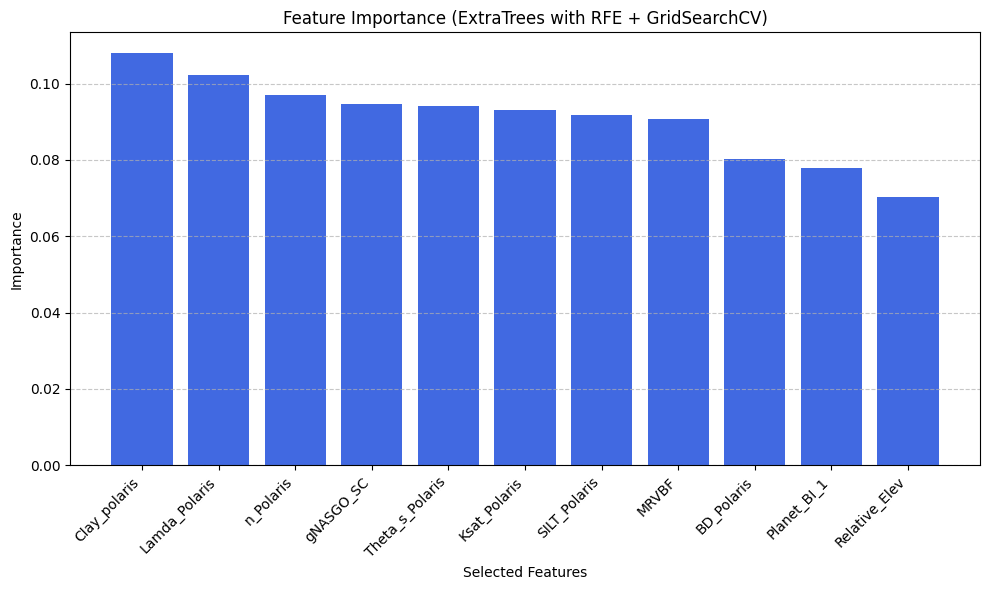

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.base import clone

# === Data Preprocessing ===
df_filtered = df_m[df_m['OM'] <= 12]  # <-- Drop rows with OM > 12
X = df_filtered.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2','Senti_BI_1','Planet_BI_2'])
y = df_filtered['OM']

# Remove NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Train-test split (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Feature Selection (RFE) ===
base_et = ExtraTreesRegressor(random_state=42)
num_features_to_select = int(0.35 * X.shape[1])

rfe = RFE(estimator=base_et, n_features_to_select=num_features_to_select)
X_train_rfe = rfe.fit_transform(X_train_scaled, y_train_full)
X_test_rfe = X_test_scaled[:, rfe.support_]
selected_features = X.columns[rfe.support_]

print(f"\n✅ Selected Top 35% Features ({len(selected_features)}):")
print(selected_features.tolist())

# === Hyperparameter Tuning with GridSearchCV (10-Fold) ===
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

grid_search = GridSearchCV(
    estimator=ExtraTreesRegressor(random_state=42),
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)
grid_search.fit(X_train_rfe, y_train_full)
best_et = grid_search.best_estimator_
print("\n🎯 Best Hyperparameters:")
print(grid_search.best_params_)

# === 10-Fold Cross-Validation on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_et)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    mbe_list.append(np.mean(y_val_pred - y_val_cv))
    mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    r2_list.append(r2_score(y_val_cv, y_val_pred))

print("\n📊 10-Fold CV Metrics on 80% Training Set:")
print(f"MBE = {np.mean(mbe_list):.4f}")
print(f"MAE = {np.mean(mae_list):.4f}")
print(f"RMSE = {np.mean(rmse_list):.4f}")
print(f"R² = {np.mean(r2_list):.4f}")

# === Evaluation on Unseen 20% Test Set ===
best_et.fit(X_train_rfe, y_train_full)
y_test_pred = best_et.predict(X_test_rfe)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("\n📊 Evaluation on 20% Unseen Test Set:")
print(f"MBE = {test_mbe:.4f}")
print(f"MAE = {test_mae:.4f}")
print(f"RMSE = {test_rmse:.4f}")
print(f"R² = {test_r2:.4f}")

# === Feature Importance ===
importances = best_et.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# === Plot Feature Importance ===
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.title("Feature Importance (ExtraTrees with RFE + GridSearchCV)")
plt.ylabel("Importance")
plt.xlabel("Selected Features")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


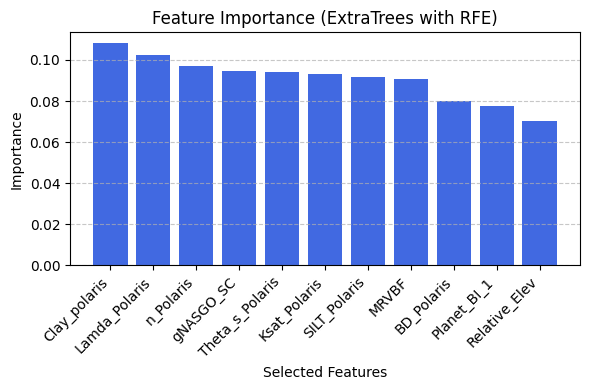

In [ ]:
# === Plot Feature Importance ===
plt.figure(figsize=(6, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.title("Feature Importance (ExtraTrees with RFE)")
plt.ylabel("Importance")
plt.xlabel("Selected Features")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

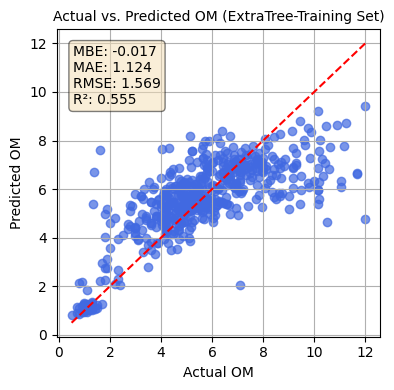

In [ ]:
# === Generate predictions from 10-fold CV on training set ===
train_actual = []
train_predicted = []

kf = KFold(n_splits=10, shuffle=True, random_state=42)
for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_et)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    train_actual.extend(y_val_cv)
    train_predicted.extend(y_val_pred)

# === Compute training metrics ===
train_actual = np.array(train_actual)
train_predicted = np.array(train_predicted)
train_mbe = np.mean(train_predicted - train_actual)
train_mae = mean_absolute_error(train_actual, train_predicted)
train_rmse = np.sqrt(mean_squared_error(train_actual, train_predicted))
train_r2 = r2_score(train_actual, train_predicted)

# === Plot: Training Set ===
plt.figure(figsize=(4, 4))
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)],
         [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (ExtraTree-Training Set)", fontsize=10)
plt.grid(True)

textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

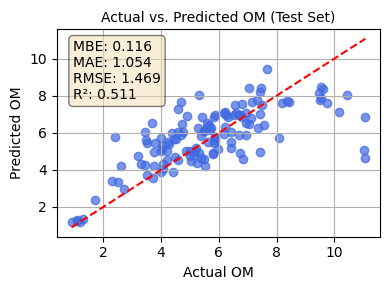

In [ ]:
# === Plot: Test Set ===
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_test_pred, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)],
         [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)",fontsize=10)
plt.grid(True)

textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

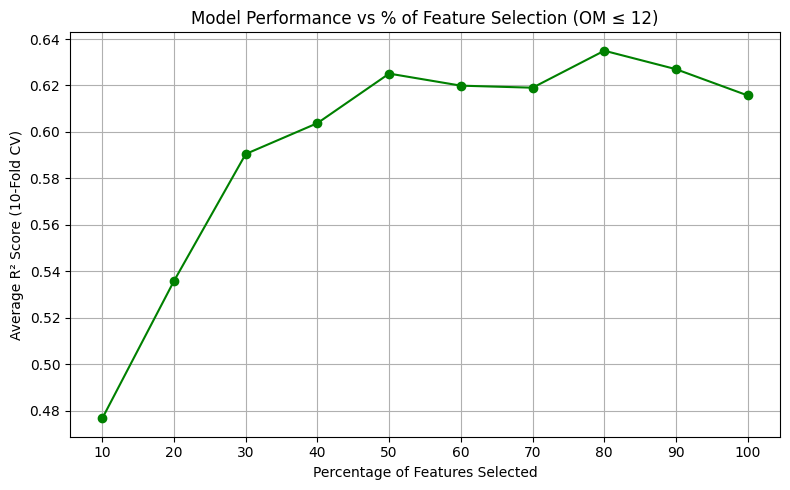

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

# === Filter data: OM <= 12 ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2','Planet_BI_1','Planet_BI_2'])
y = df_filtered['OM']

# Remove NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Standardize features ===
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# === Loop over percentages and compute R² ===
percentages = list(range(10, 101, 10))
r2_scores = []

for pct in percentages:
    num_features = max(1, int((pct / 100) * X.shape[1]))

    rfe = RFE(estimator=ExtraTreesRegressor(random_state=42), n_features_to_select=num_features)
    X_rfe = rfe.fit_transform(X_scaled, y)

    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    r2_fold = []

    for train_idx, val_idx in kf.split(X_rfe):
        X_train_cv, X_val_cv = X_rfe[train_idx], X_rfe[val_idx]
        y_train_cv, y_val_cv = y.iloc[train_idx], y.iloc[val_idx]

        model = ExtraTreesRegressor(random_state=42)
        model.fit(X_train_cv, y_train_cv)
        y_pred = model.predict(X_val_cv)

        r2_fold.append(r2_score(y_val_cv, y_pred))

    r2_scores.append(np.mean(r2_fold))

# === Plot R² vs % Feature Selection ===
plt.figure(figsize=(8, 5))
plt.plot(percentages, r2_scores, marker='o', linestyle='-', color='green')
plt.title("Model Performance vs % of Feature Selection (OM ≤ 12)")
plt.xlabel("Percentage of Features Selected")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(percentages)
plt.tight_layout()
plt.show()


In [ ]:
fold_importances = []  # To store feature importances from each fold


In [ ]:
et.fit(X_train, y_train)
y_pred = et.predict(X_test)
et.fit(X_train, y_train)
y_pred = et.predict(X_test)

# Store feature importances for this fold
fold_importances.append(et.feature_importances_)


In [ ]:
# Average feature importances across all folds
avg_importances = np.mean(fold_importances, axis=0)

# Normalize so that the sum is 1
normalized_importances = avg_importances / np.sum(avg_importances)

# Create DataFrame for plotting
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)


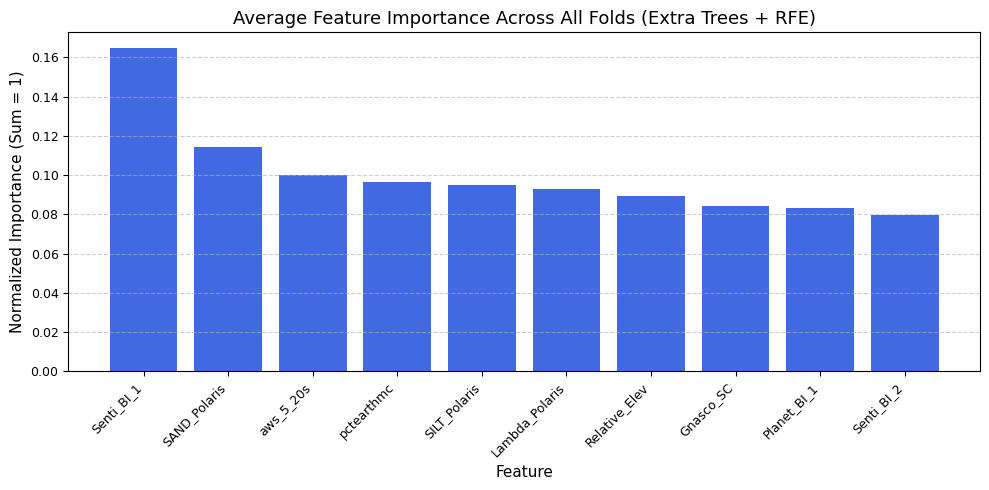

In [ ]:
plt.figure(figsize=(10, 5))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Normalized Importance (Sum = 1)", fontsize=11)
plt.xlabel("Feature", fontsize=11)
plt.title("Average Feature Importance Across All Folds (Extra Trees + RFE)", fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


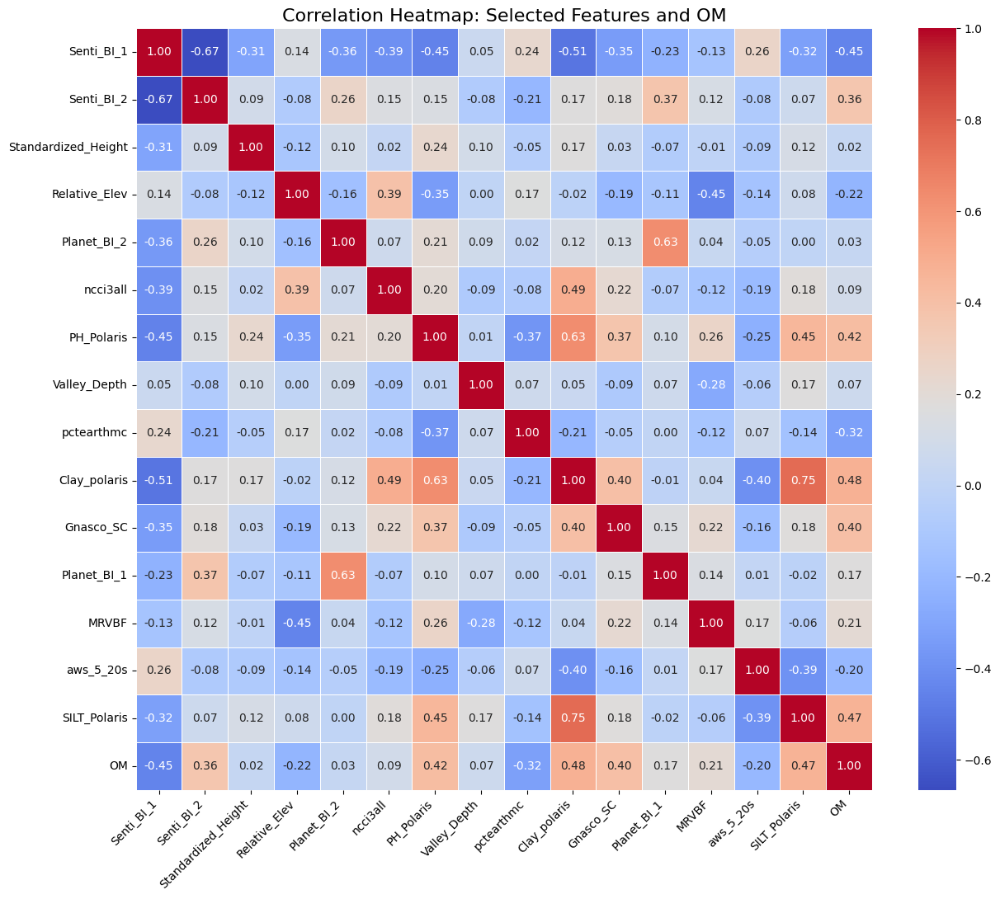

In [ ]:
# ⬇️ Step 3: Define selected columns including the target 'OM'
selected_columns = [
    'Senti_BI_1','Senti_BI_2', 'Standardized_Height', 'Relative_Elev','Planet_BI_2','ncci3all', 'PH_Polaris','Valley_Depth',
       'pctearthmc', 'Clay_polaris', 'Gnasco_SC','Planet_BI_1',
    'MRVBF', 'aws_5_20s','SILT_Polaris','OM'  # ⬅️ Added OM
]

# ⬇️ Step 4: Filter DataFrame
df_selected = df[selected_columns].dropna()

# ⬇️ Step 5: Compute Correlation Matrix
correlation_matrix = df_selected.corr()

# ⬇️ Step 6: Plot Heatmap
plt.figure(figsize=(13, 11))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap: Selected Features and OM", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

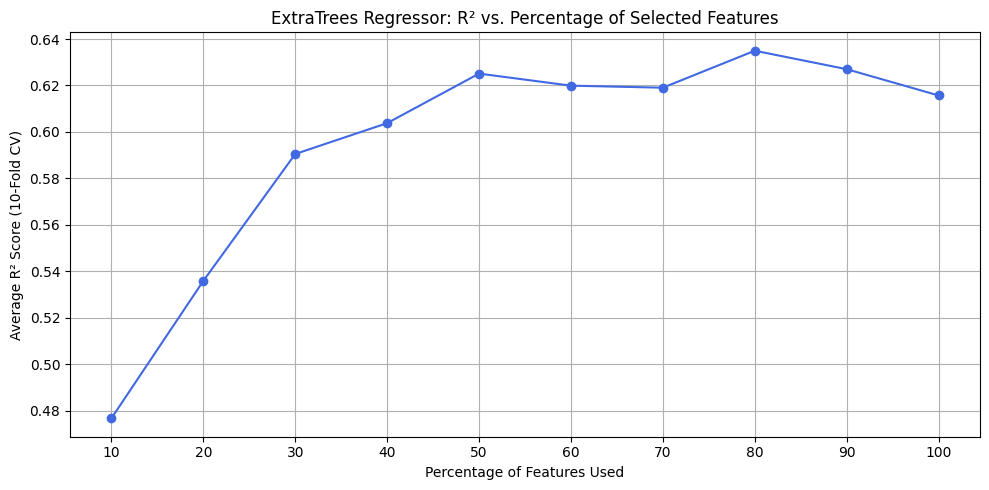

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Initialize model and KFold (reuse from earlier)
et = ExtraTreesRegressor(n_estimators=100, random_state=42)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

r2_scores_vs_features = []

# Loop over feature percentages
for pct in range(10, 101, 10):  # 10% to 100%
    num_feats = int(pct / 100 * X.shape[1])

    rfe = RFE(estimator=et, n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_index, test_index in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_index], X_rfe[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        et.fit(X_train, y_train)
        y_pred = et.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2_temp = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2_temp))

# Create DataFrame for plotting
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='royalblue')
plt.title("ExtraTrees Regressor: R² vs. Percentage of Selected Features")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.xticks(range(10, 110, 10))
plt.grid(True)
plt.tight_layout()
plt.show()


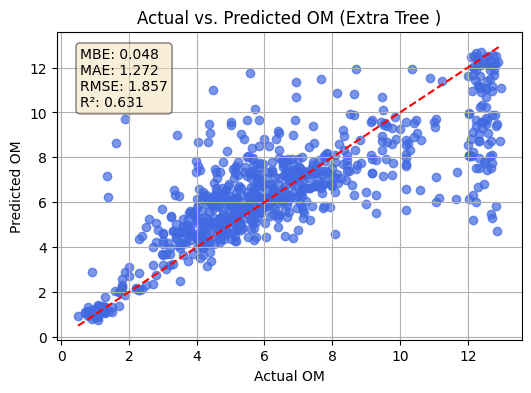

In [ ]:
# Create scatter plot
plt.figure(figsize=(6, 4))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Extra Tree )")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.3f}',
    f'MAE: {avg_mae:.3f}',
    f'RMSE: {avg_rmse:.3f}',
    f'R²: {avg_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

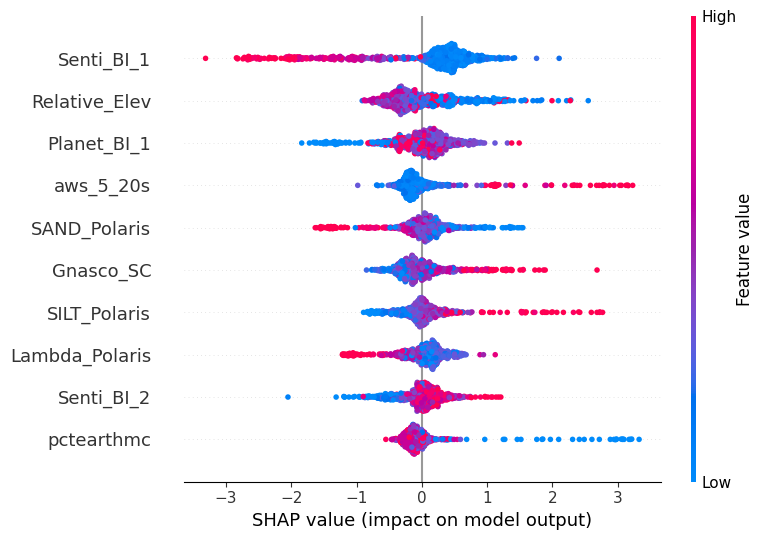

In [ ]:
import shap

# Step 1: Fit ExtraTrees model on selected features (optional, refit for SHAP clarity)
et.fit(X_selected, y)

# Step 2: Create SHAP explainer
explainer = shap.TreeExplainer(et)

# Step 3: Calculate SHAP values
shap_values = explainer.shap_values(X_selected)

# Step 4: Create DataFrame for SHAP with selected feature names
X_selected_df = pd.DataFrame(X_selected, columns=selected_features)

# Step 5: SHAP Summary (Beeswarm) Plot
plt.figure(figsize=(8, 5))
shap.summary_plot(shap_values, X_selected_df, plot_type="dot", show=True)


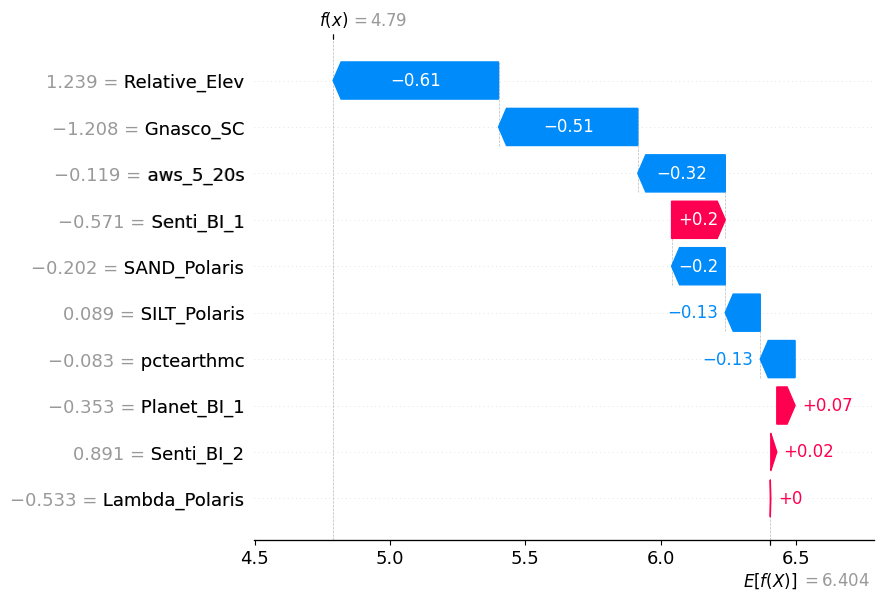

<Figure size 640x480 with 0 Axes>

In [ ]:
# Step 6: Choose a sample index to explain (e.g., first sample)
sample_index = 0

# Get SHAP values and data for the selected sample
shap_values_sample = shap_values[sample_index]
data_values_sample = X_selected_df.iloc[sample_index].values

# Optional: Sort features by impact for clearer waterfall
sorted_idx = np.argsort(np.abs(shap_values_sample))[::-1]
top_features = selected_features[sorted_idx]
shap_values_sorted = shap_values_sample[sorted_idx]
data_values_sorted = data_values_sample[sorted_idx]

# Create SHAP Explanation object
explanation = shap.Explanation(
    values=shap_values_sorted,
    base_values=explainer.expected_value,
    data=data_values_sorted,
    feature_names=top_features
)

# Step 7: Plot SHAP waterfall
plt.figure(figsize=(7, 4))  # Adjust size as needed
shap.plots.waterfall(explanation, max_display=len(top_features))
plt.tight_layout()
plt.savefig("shap_waterfall_et_rfe.png", dpi=300, bbox_inches='tight')
plt.show()


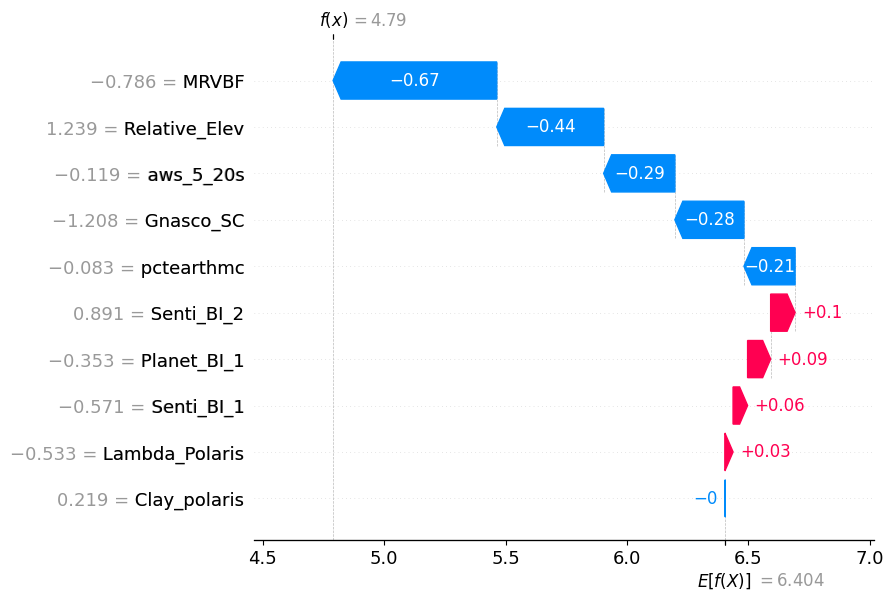

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import ExtraTreesRegressor  # ✅ Updated
from sklearn.preprocessing import StandardScaler

# Step 1: Standardize X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Fit Extra Trees to full data
et = ExtraTreesRegressor(random_state=42)  # ✅ Changed model
et.fit(X_scaled, y)

# Step 3: Select top 30% features using feature importances
importances = et.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.3)
top_indices = np.argsort(importances)[-n_select:]
selected_features = X.columns[top_indices]
X_selected = X[selected_features]
X_selected_scaled = X_scaled[:, top_indices]

# Step 4: Train model again on selected features
et.fit(X_selected_scaled, y)

# Step 5: Create SHAP explainer and calculate values
explainer = shap.TreeExplainer(et)
shap_values = explainer.shap_values(X_selected_scaled)

# Step 6: Prepare DataFrame for SHAP with feature names
X_df_selected = pd.DataFrame(X_selected_scaled, columns=selected_features)

# Step 7: Choose a sample to explain (e.g., first row)
sample_index = 0
shap_values_sample = shap_values[sample_index]

# Optional: Sort features by importance for better plot clarity
feature_order = selected_features[np.argsort(importances[top_indices])[::-1]].tolist()
shap_series = pd.Series(shap_values_sample, index=selected_features)
shap_values_sorted = shap_series.loc[feature_order].values
data_values_sorted = X_df_selected.iloc[sample_index].loc[feature_order].values

# Step 8: Create SHAP explanation
explanation = shap.Explanation(
    values=shap_values_sorted,
    base_values=explainer.expected_value,
    data=data_values_sorted,
    feature_names=feature_order
)

# Step 9: Waterfall Plot
plt.figure(figsize=(6, 3))  # Smaller for thesis
shap.plots.waterfall(explanation, max_display=len(feature_order))
plt.tight_layout()
plt.savefig("shap_waterfall_et_top_30_percent.png", dpi=300, bbox_inches='tight')
plt.show()


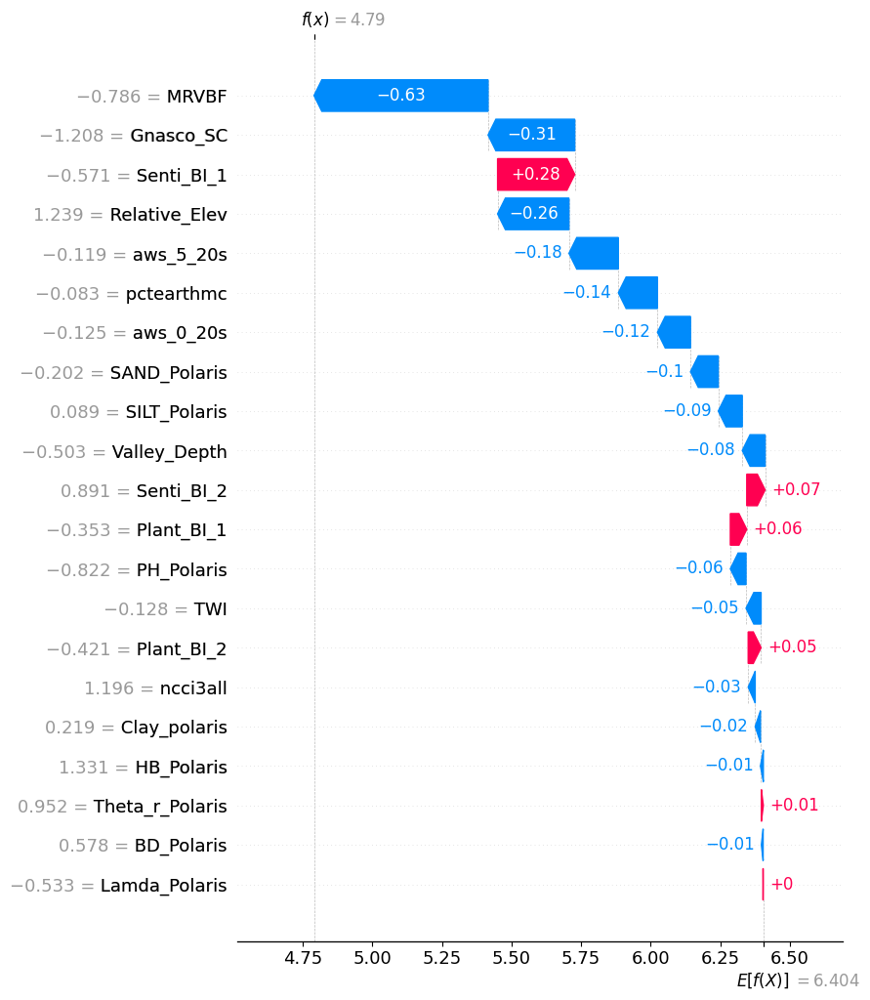

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Restore feature names from selected columns (used in X_scaled)
X_df_selected = pd.DataFrame(X_selected, columns=selected_features)

# Step 2: Refit the model to entire selected data (optional, or use last fold model)
et.fit(X_selected, y)

# Step 3: Create SHAP explainer and compute SHAP values
explainer = shap.TreeExplainer(et)
shap_values = explainer.shap_values(X_selected)

# Step 4: Choose a sample to explain (e.g., first row)
sample_index = 0
shap_values_sample = shap_values[sample_index]

# Step 5: Create explanation object for selected sample
# This step is now less critical as we will recreate a sorted one,
# but keeping it for clarity if needed elsewhere.
explanation = shap.Explanation(
    values=shap_values_sample,
    base_values=explainer.expected_value,
    data=X_df_selected.iloc[sample_index],
    feature_names=selected_features
)

# Step 6: Sort features by importance (from earlier bar plot)
feature_order = feature_importance_df['Feature'].tolist()

# Create a Series from shap_values_sample with correct index for easy sorting
shap_series = pd.Series(shap_values_sample, index=selected_features)

# Get the shap values in the desired feature order
shap_values_sample_sorted = shap_series.loc[feature_order].values # <-- Convert Series values to NumPy array

# Get the data values in the desired feature order
data_values_sorted = X_df_selected.iloc[sample_index].loc[feature_order].values # <-- Convert Series values to NumPy array


# Regenerate explanation in sorted order using NumPy arrays
explanation_sorted = shap.Explanation(
    values=shap_values_sample_sorted, # Pass NumPy array here
    base_values=explainer.expected_value,
    data=data_values_sorted, # Pass NumPy array here
    feature_names=feature_order
)

# Step 7: Plot Waterfall
plt.figure(figsize=(12, 6))
# Pass the corrected explanation object
shap.plots.waterfall(explanation_sorted, max_display=len(feature_order))
plt.tight_layout()
plt.savefig("shap_waterfall_et_rfe_sorted.png", dpi=300, bbox_inches='tight')
plt.show()

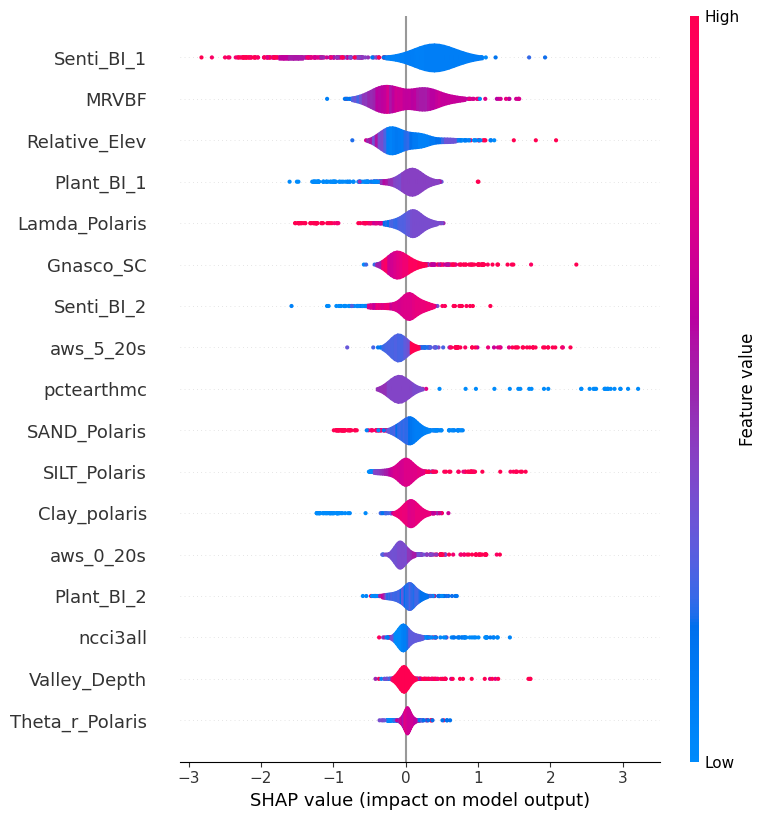

In [ ]:
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.preprocessing import StandardScaler

# Step 0: Fit ExtraTreesRegressor on full scaled data
et = ExtraTreesRegressor(n_estimators=100, random_state=42)
et.fit(X_scaled, y)

# Step 1: Select top 50% features by importance
importances = et.feature_importances_
n_features = X.shape[1]
n_select = int(n_features * 0.5)  # ⬅️ Top 50%
top_indices = np.argsort(importances)[-n_select:]
selected_features_importance = X.columns[top_indices]

# Step 2: Create DataFrame for top 50% features
X_df_selected = pd.DataFrame(X_scaled[:, top_indices], columns=selected_features_importance)

# Step 3: Refit model on selected features
et.fit(X_df_selected, y)

# Step 4: SHAP explainer and SHAP values
explainer = shap.TreeExplainer(et)
shap_values = explainer.shap_values(X_df_selected)

# Step 5: SHAP beeswarm plot (violin)
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values, X_df_selected, plot_type="violin", show=False)
plt.tight_layout()
plt.savefig("shap_beeswarm_et_top_50percent.png", dpi=300, bbox_inches='tight')
plt.show()


Model: KNeighborsRegressor
Setup: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 10, 'p': 2, 'weights': 'uniform'}
Average Metrics Across 10-Fold CV:
MBE=0.0201, MAE=1.5248, RMSE=2.1107, R²=0.5230


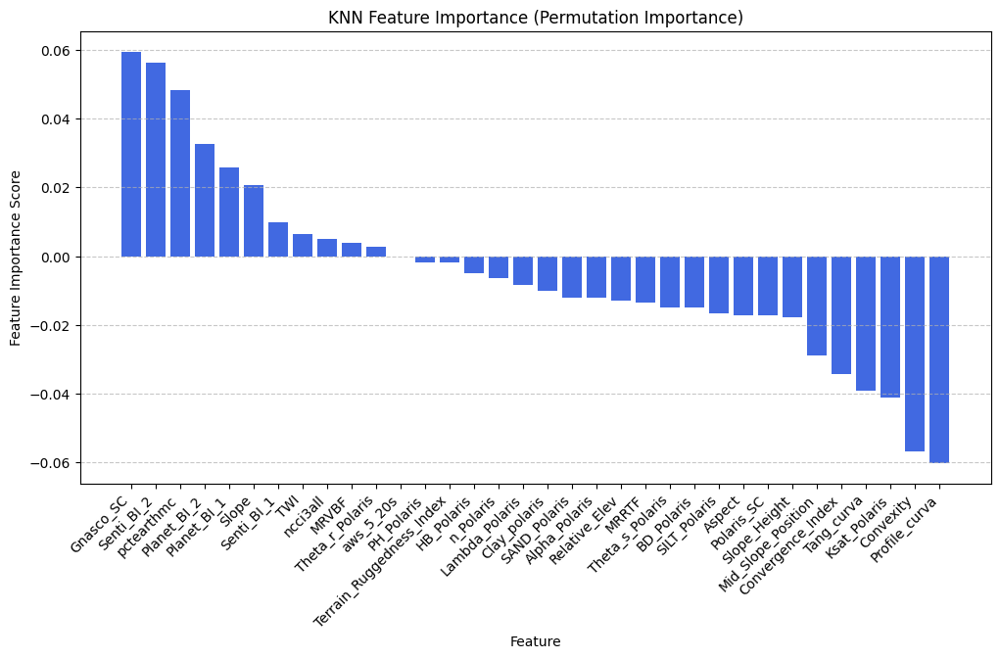

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.inspection import permutation_importance

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'rootznaws', 'Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height',])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

 # Now, remove rows with NaN values from both X and y:
#df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist()) # Make sure all columns in X are included.
#X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','


# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize model
knn = KNeighborsRegressor(n_neighbors=10)

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []


# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    knn.fit(X_train, y_train)

    # Predictions
    y_pred = knn.predict(X_test)

     # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: KNeighborsRegressor")
print(f"Setup: {knn.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_knn = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})


# Compute feature importance using permutation importance
perm_importance = permutation_importance(knn, X_test, y_test, scoring='r2', n_repeats=10, random_state=42)

# Extract importance scores
feature_importance = perm_importance.importances_mean
feature_names = X.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot feature importance with scores on the y-axis
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue')
plt.ylabel('Feature Importance Score')
plt.xlabel('Feature')
plt.title('KNN Feature Importance (Permutation Importance)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

RFE kNN

Selected Top 90% Features (9 out of 32):
['gNASGO_SC', 'MRVBF', 'Aspect', 'Relative_Elev', 'Profile_curva', 'Mid_Slope_Position', 'Convexity', 'Convergence_Index', 'Tang_curva']
Model: KNeighborsRegressor
Setup: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 10, 'p': 2, 'weights': 'distance'}
Average Metrics Across 10-Fold CV (with 90% selected features):
MBE=0.0823, MAE=1.9819, RMSE=2.5982, R²=0.2850


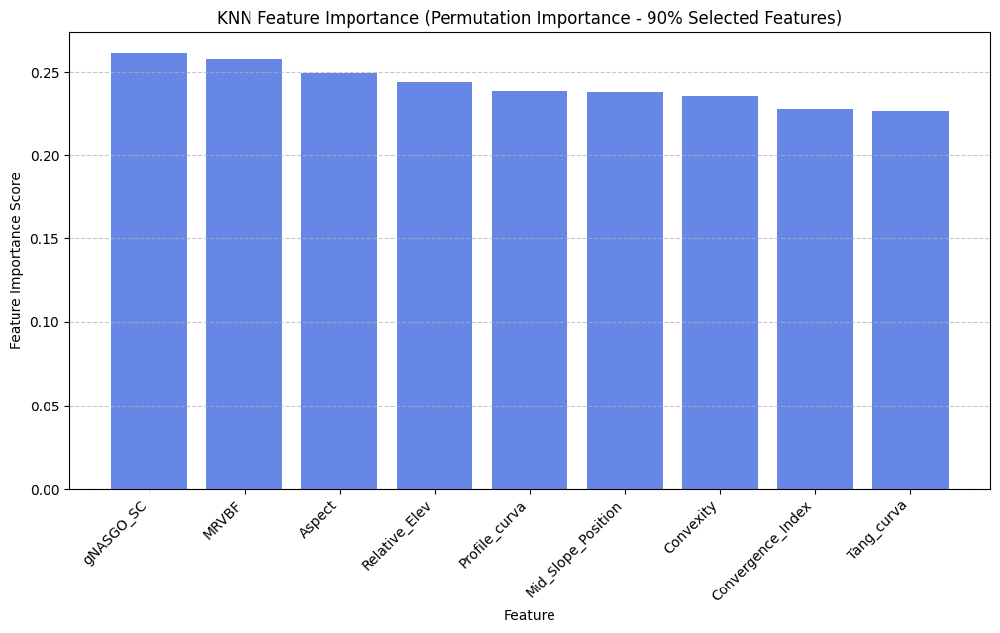

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','lati','long','Senti_BI_2','Planet_BI_1', 'Planet_BI_2'
                       ])  # Features
y = df_m['OM']  # Target variable

# Drop rows with NaN values in X and y
df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist())  # Make sure all columns in X are included.
X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE','lati','long','Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'
                       ])
y = df_cleaned['OM']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize baseline KNN model for feature importance evaluation
knn_baseline = KNeighborsRegressor(n_neighbors=10, weights='distance', metric='minkowski')

# Train KNN model on all features
knn_baseline.fit(X_scaled, y)

# Compute feature importance using permutation importance
perm_importance = permutation_importance(knn_baseline, X_scaled, y, scoring='r2', n_repeats=10, random_state=42)

# Extract importance scores and feature names
feature_importance = perm_importance.importances_mean
feature_names = X.columns

# Sort features by importance
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select top 90% most important features
num_features_to_select = int(0.3 * X.shape[1])
selected_features = feature_importance_df['Feature'].iloc[:num_features_to_select].tolist()
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features)

# Reduce X to selected features
X_selected = X[selected_features].values
X_selected_scaled = scaler.fit_transform(X_selected)  # Standardize selected features

# Initialize KNN model for final training and testing
knn = KNeighborsRegressor(n_neighbors=10, weights='distance', metric='minkowski')

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected_scaled):
    X_train, X_test = X_selected_scaled[train_index], X_selected_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    knn.fit(X_train, y_train)

    # Predictions
    y_pred = knn.predict(X_test)

     # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: KNeighborsRegressor")
print(f"Setup: {knn.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_knn_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Plot feature importance with confidence intervals
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'][:num_features_to_select],
        feature_importance_df['Importance'][:num_features_to_select],
        color='royalblue', alpha=0.8)

plt.ylabel('Feature Importance Score')
plt.xlabel('Feature')
plt.title('KNN Feature Importance (Permutation Importance - 90% Selected Features)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
fold_importances = []


In [ ]:
from sklearn.inspection import permutation_importance

for train_index, test_index in kf.split(X_selected_scaled):
    X_train, X_test = X_selected_scaled[train_index], X_selected_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)

    # Store predictions
    all_y_test.extend(y_test)
    all_y_pred.extend(y_pred)

    # Metrics
    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

    # Permutation importance for this fold
    perm_result = permutation_importance(knn, X_test, y_test, n_repeats=10, random_state=42, scoring='r2')
    fold_importances.append(perm_result.importances_mean)


In [ ]:
# Average importances across all folds
avg_importances = np.mean(fold_importances, axis=0)

# Normalize so the sum = 1
normalized_importances = avg_importances / np.sum(avg_importances)

# Create DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)


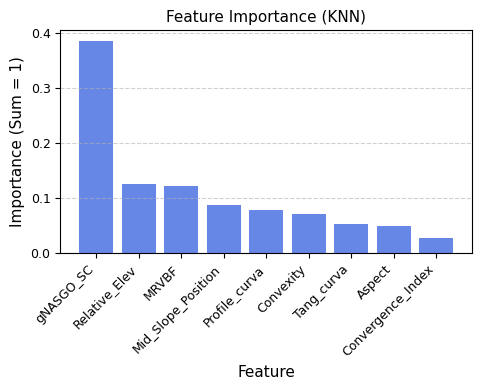

In [ ]:
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue', alpha=0.8)
plt.ylabel('Importance (Sum = 1)', fontsize=11)
plt.xlabel('Feature', fontsize=11)
plt.title('Feature Importance (KNN)', fontsize=11)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


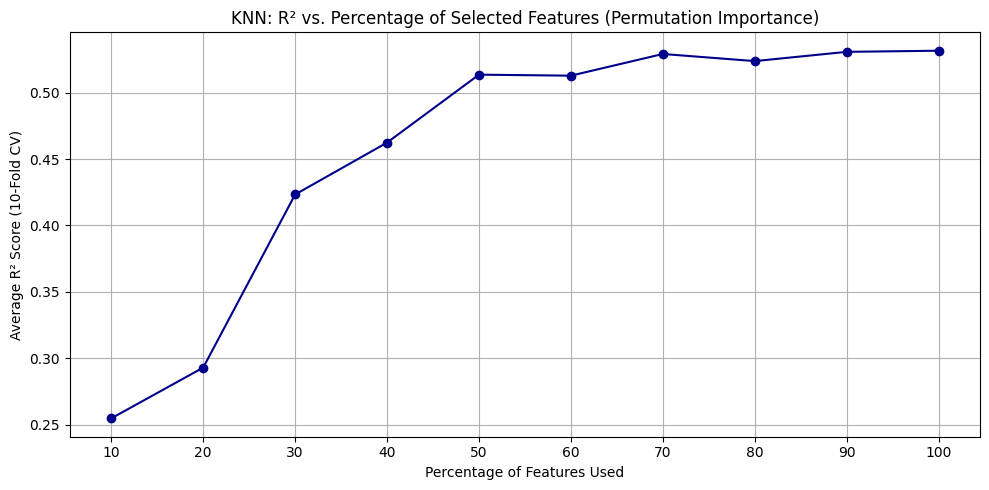

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor # Make sure KNeighborsRegressor is imported
from sklearn.metrics import r2_score

# Assuming X, y, scaler, kf, feature_importance_df are defined in previous cells

r2_scores_vs_features = []

# Initialize KNN model inside the loop or before it
# This ensures 'knn' is defined in the scope of this cell
knn = KNeighborsRegressor(n_neighbors=10, weights='distance', metric='minkowski') # Initialize the KNN model

# Loop over different percentages of features
for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # Select top N features based on permutation importance
    selected_features = feature_importance_df['Feature'].iloc[:num_feats].tolist()
    X_subset = X[selected_features].values

    # Standardize selected features
    X_subset_scaled = scaler.fit_transform(X_subset)

    # 10-Fold cross-validation
    r2_list_temp = []
    for train_idx, test_idx in kf.split(X_subset_scaled):
        X_train, X_test = X_subset_scaled[train_idx], X_subset_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Use the initialized 'knn' model
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    # Average R² for this feature count
    avg_r2 = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2))

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='darkblue')
plt.title("KNN: R² vs. Percentage of Selected Features (Permutation Importance)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()

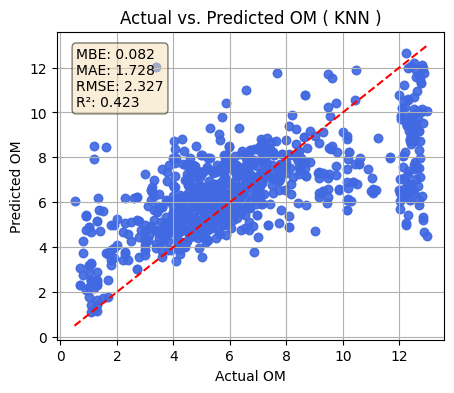

In [ ]:
# Create scatter plot
plt.figure(figsize=(5, 4))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM ( KNN )")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.3f}',
    f'MAE: {avg_mae:.3f}',
    f'RMSE: {avg_rmse:.3f}',
    f'R²: {avg_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

Gridsearch cv, KNN RF

KNN with cv and test

Selected Features (12 out of 32): ['MRVBF', 'Convexity', 'Convergence_Index', 'Mid_Slope_Position', 'Relative_Elev', 'Aspect', 'Tang_curva', 'Profile_curva', 'gNASGO_SC', 'Senti_BI_1', 'PH_Polaris', 'Slope']
Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}

Test Set Performance:
MBE = 0.1296, MAE = 1.1847, RMSE = 1.6525, R² = 0.4682

Cross-Validation on Training Set:
MBE = 0.0947, MAE = 1.2374, RMSE = 1.6624, R² = 0.4660

✅ Sum of normalized importances (top 12 features): 1.0000


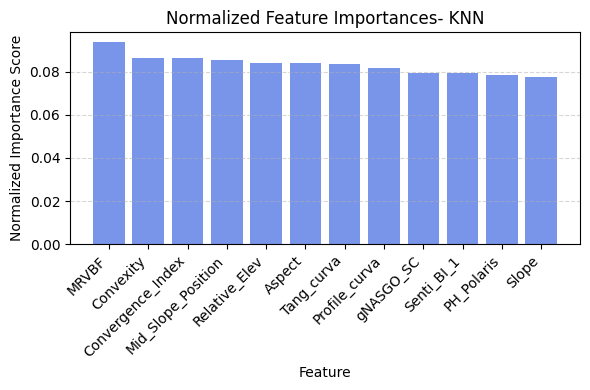

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter Data (OM ≤ 12) and Drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2',])
y = df_filtered['OM']
df_cleaned = df_filtered.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned[X.columns]
y = df_cleaned['OM']

# === Step 2: Train-Test Split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardize Features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Permutation Importance (Initial KNN) ===
knn_base = KNeighborsRegressor(n_neighbors=10, weights='distance')
knn_base.fit(X_train_scaled, y_train_full)
perm_importance = permutation_importance(knn_base, X_train_scaled, y_train_full, scoring='r2', n_repeats=10, random_state=42)

# === Step 5: Select Top 30% Most Important Features ===
importances = perm_importance.importances_mean
feature_names = X_train_full.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values(by='Importance', ascending=False)

top_k = int(0.40 * len(feature_names))
selected_features = importance_df['Feature'].iloc[:top_k].tolist()
print(f"Selected Features ({top_k} out of {len(feature_names)}): {selected_features}")

# Reduce to selected features
X_train_selected = X_train_full[selected_features]
X_test_selected = X_test[selected_features]
X_train_selected_scaled = scaler.fit_transform(X_train_selected)
X_test_selected_scaled = scaler.transform(X_test_selected)

# === Step 6: GridSearchCV (10-Fold CV on Train Set) ===
param_grid = {
    'n_neighbors': [3, 5, 7, 10, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}
knn = KNeighborsRegressor()
grid_search = GridSearchCV(knn, param_grid, cv=10, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected_scaled, y_train_full)

best_knn = grid_search.best_estimator_
print(f"Best Hyperparameters: {grid_search.best_params_}")

# === Step 7: Evaluate on Test Set ===
y_pred_test = best_knn.predict(X_test_selected_scaled)
test_mbe = np.mean(y_pred_test - y_test)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
test_r2 = r2_score(y_test, y_pred_test)

print("\nTest Set Performance:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# === Step 8: Evaluate Using 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected_scaled):
    X_train, X_val = X_train_selected_scaled[train_idx], X_train_selected_scaled[val_idx]
    y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_knn.fit(X_train, y_train)
    y_pred = best_knn.predict(X_val)

    train_metrics['mbe'].append(np.mean(y_pred - y_val))
    train_metrics['mae'].append(mean_absolute_error(y_val, y_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_val, y_pred)))
    train_metrics['r2'].append(r2_score(y_val, y_pred))

print("\nCross-Validation on Training Set:")
print(f"MBE = {np.mean(train_metrics['mbe']):.4f}, MAE = {np.mean(train_metrics['mae']):.4f}, "
      f"RMSE = {np.mean(train_metrics['rmse']):.4f}, R² = {np.mean(train_metrics['r2']):.4f}")

# === Step 9: Normalize and Plot Feature Importance (Sum = 1 after selection) ===

# Select top-k features first
top_features_df = importance_df.iloc[:top_k].copy()

# Normalize only within selected features
top_features_df['Importance'] = top_features_df['Importance'] / top_features_df['Importance'].sum()

# Optional: Verify the sum
print(f"\n✅ Sum of normalized importances (top {top_k} features): {top_features_df['Importance'].sum():.4f}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar(top_features_df['Feature'], top_features_df['Importance'], color='royalblue', alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.title('Normalized Feature Importances- KNN')
plt.xlabel('Feature')
plt.ylabel('Normalized Importance Score')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



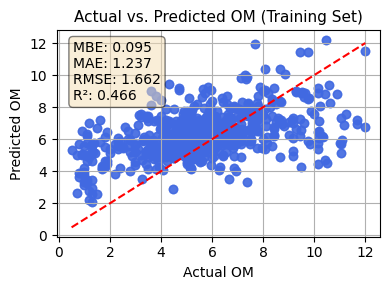

In [ ]:
# === Filter OM > 12 only from plot points, NOT from metrics ===
import numpy as np
import matplotlib.pyplot as plt

# Convert to numpy arrays for filtering
all_y_test_np = np.array(all_y_test)
all_y_pred_np = np.array(all_y_pred)

# Filter to OM ≤ 12 only
mask = all_y_test_np <= 12
filtered_y_test = all_y_test_np[mask]
filtered_y_pred = all_y_pred_np[mask]

# === Scatter Plot (Filtered Points Only, Original Metrics) ===
plt.figure(figsize=(4, 3))
plt.scatter(filtered_y_test, filtered_y_pred, color="royalblue", alpha=0.7)
plt.plot([min(filtered_y_test), max(filtered_y_test)],
         [min(filtered_y_test), max(filtered_y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Training Set)", fontsize=11)
plt.grid(True)

# Keep original metrics text
textstr = '\n'.join((
    f'MBE: {np.mean(train_metrics["mbe"]):.3f}',
    f'MAE: {np.mean(train_metrics["mae"]):.3f}',
    f'RMSE: {np.mean(train_metrics["rmse"]):.3f}',
    f'R²: {np.mean(train_metrics["r2"]):.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


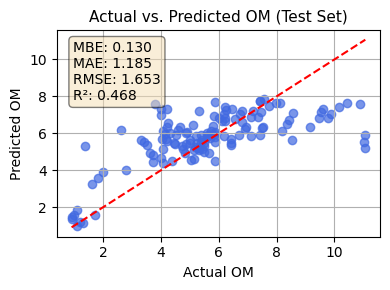

In [ ]:
# === Scatter Plot: Test Set ===
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_pred_test, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize =11)
plt.grid(True)

# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


KNN planetscope

Selected Features (12 out of 32): ['MRVBF', 'Aspect', 'Relative_Elev', 'Convexity', 'Profile_curva', 'Convergence_Index', 'gNASGO_SC', 'PH_Polaris', 'Planet_BI_1', 'Mid_Slope_Position', 'Tang_curva', 'Slope']
Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}

Test Set Performance:
MBE = 0.1972, MAE = 1.1901, RMSE = 1.6162, R² = 0.4085

Cross-Validation on Training Set:
MBE = 0.1476, MAE = 1.2762, RMSE = 1.6726, R² = 0.4804

✅ Sum of normalized importances (top 12 features): 1.0000


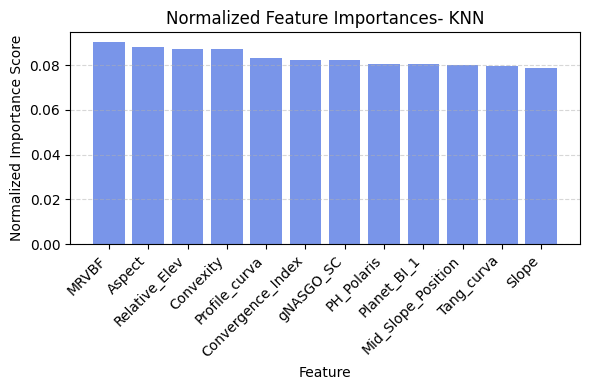

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter Data (OM ≤ 12) and Drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2',])
y = df_filtered['OM']
df_cleaned = df_filtered.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned[X.columns]
y = df_cleaned['OM']

# === Step 2: Train-Test Split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardize Features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Permutation Importance (Initial KNN) ===
knn_base = KNeighborsRegressor(n_neighbors=10, weights='distance')
knn_base.fit(X_train_scaled, y_train_full)
perm_importance = permutation_importance(knn_base, X_train_scaled, y_train_full, scoring='r2', n_repeats=10, random_state=42)

# === Step 5: Select Top 30% Most Important Features ===
importances = perm_importance.importances_mean
feature_names = X_train_full.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values(by='Importance', ascending=False)

top_k = int(0.40 * len(feature_names))
selected_features = importance_df['Feature'].iloc[:top_k].tolist()
print(f"Selected Features ({top_k} out of {len(feature_names)}): {selected_features}")

# Reduce to selected features
X_train_selected = X_train_full[selected_features]
X_test_selected = X_test[selected_features]
X_train_selected_scaled = scaler.fit_transform(X_train_selected)
X_test_selected_scaled = scaler.transform(X_test_selected)

# === Step 6: GridSearchCV (10-Fold CV on Train Set) ===
param_grid = {
    'n_neighbors': [3, 5, 7, 10, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}
knn = KNeighborsRegressor()
grid_search = GridSearchCV(knn, param_grid, cv=10, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected_scaled, y_train_full)

best_knn = grid_search.best_estimator_
print(f"Best Hyperparameters: {grid_search.best_params_}")

# === Step 7: Evaluate on Test Set ===
y_pred_test = best_knn.predict(X_test_selected_scaled)
test_mbe = np.mean(y_pred_test - y_test)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
test_r2 = r2_score(y_test, y_pred_test)

print("\nTest Set Performance:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# === Step 8: Evaluate Using 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected_scaled):
    X_train, X_val = X_train_selected_scaled[train_idx], X_train_selected_scaled[val_idx]
    y_train, y_val = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    best_knn.fit(X_train, y_train)
    y_pred = best_knn.predict(X_val)

    train_metrics['mbe'].append(np.mean(y_pred - y_val))
    train_metrics['mae'].append(mean_absolute_error(y_val, y_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_val, y_pred)))
    train_metrics['r2'].append(r2_score(y_val, y_pred))

print("\nCross-Validation on Training Set:")
print(f"MBE = {np.mean(train_metrics['mbe']):.4f}, MAE = {np.mean(train_metrics['mae']):.4f}, "
      f"RMSE = {np.mean(train_metrics['rmse']):.4f}, R² = {np.mean(train_metrics['r2']):.4f}")

# === Step 9: Normalize and Plot Feature Importance (Sum = 1 after selection) ===

# Select top-k features first
top_features_df = importance_df.iloc[:top_k].copy()

# Normalize only within selected features
top_features_df['Importance'] = top_features_df['Importance'] / top_features_df['Importance'].sum()

# Optional: Verify the sum
print(f"\n✅ Sum of normalized importances (top {top_k} features): {top_features_df['Importance'].sum():.4f}")

# Plot
plt.figure(figsize=(6, 4))
plt.bar(top_features_df['Feature'], top_features_df['Importance'], color='royalblue', alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.title('Normalized Feature Importances- KNN')
plt.xlabel('Feature')
plt.ylabel('Normalized Importance Score')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



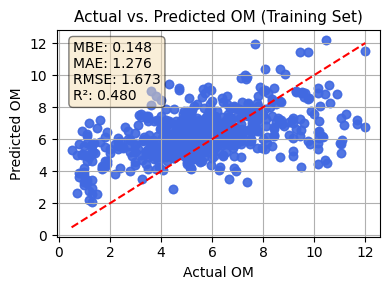

In [ ]:
# === Filter OM > 12 only from plot points, NOT from metrics ===
import numpy as np
import matplotlib.pyplot as plt

# Convert to numpy arrays for filtering
all_y_test_np = np.array(all_y_test)
all_y_pred_np = np.array(all_y_pred)

# Filter to OM ≤ 12 only
mask = all_y_test_np <= 12
filtered_y_test = all_y_test_np[mask]
filtered_y_pred = all_y_pred_np[mask]

# === Scatter Plot (Filtered Points Only, Original Metrics) ===
plt.figure(figsize=(4, 3))
plt.scatter(filtered_y_test, filtered_y_pred, color="royalblue", alpha=0.7)
plt.plot([min(filtered_y_test), max(filtered_y_test)],
         [min(filtered_y_test), max(filtered_y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Training Set)", fontsize=11)
plt.grid(True)

# Keep original metrics text
textstr = '\n'.join((
    f'MBE: {np.mean(train_metrics["mbe"]):.3f}',
    f'MAE: {np.mean(train_metrics["mae"]):.3f}',
    f'RMSE: {np.mean(train_metrics["rmse"]):.3f}',
    f'R²: {np.mean(train_metrics["r2"]):.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


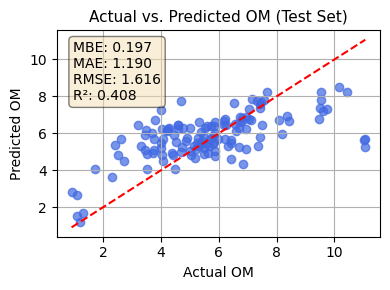

In [ ]:
# === Scatter Plot: Test Set ===
plt.figure(figsize=(4, 3))
plt.scatter(y_test, y_pred_test, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize =11)
plt.grid(True)

# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


KSVM

Model: Kernelized Support Vector Machines (KSVM) - RBF Kernel
Setup: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Average Metrics Across 10-Fold CV:
MBE=-0.5078, MAE=1.4989, RMSE=2.2500, R²=0.4623


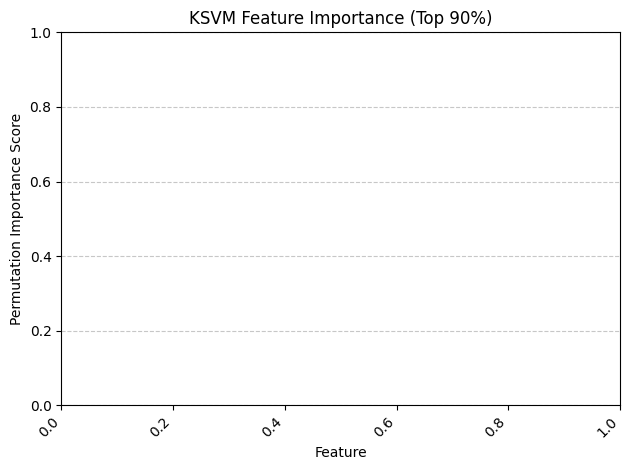

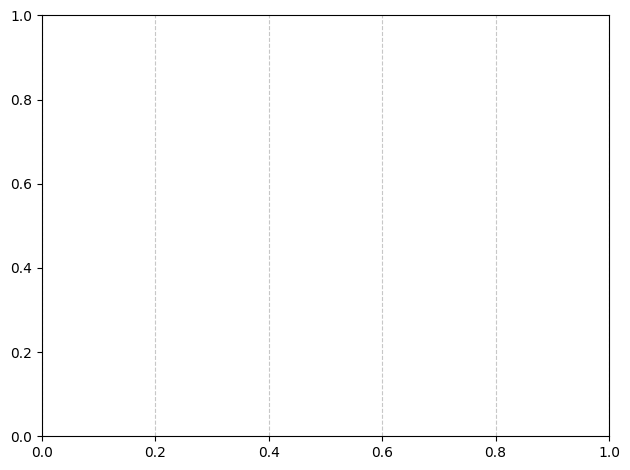

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long','Sensor_OM', 'rootznaws'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



# Initialize Kernelized Support Vector Machines (KSVM) with RBF kernel
ksvm = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    ksvm.fit(X_train, y_train)

    # Predictions
    y_pred = ksvm.predict(X_test)

      # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Kernelized Support Vector Machines (KSVM) - RBF Kernel")
print(f"Setup: {ksvm.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_ksvm = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Feature Importance for Linear Kernel Only
if ksvm.kernel == 'linear':  # Fixed the variable reference
    feature_importances = np.abs(ksvm.coef_).flatten()  # Absolute values of coefficients
    feature_names = X.columns  # Feature names

    # Create DataFrame for visualization
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort descending

    # Plot Feature Importance
    plt.figure(figsize=(12, 6))
    plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
    plt.ylabel("Feature Importance Score (Absolute Coefficients)")
    plt.xlabel("Feature")
    plt.title("Feature Importance Plot (SVR with Linear Kernel)")
    plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

plt.ylabel('Permutation Importance Score')
plt.xlabel('Feature')
plt.title('KSVM Feature Importance (Top 90%)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

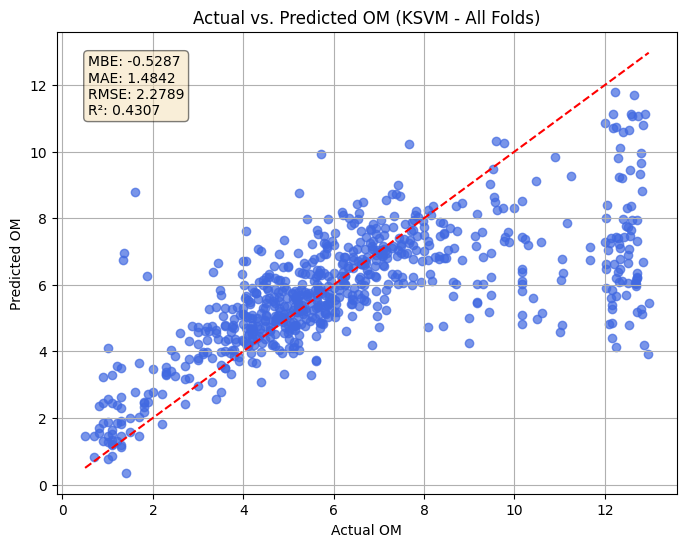

In [ ]:
# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (KSVM - All Folds)")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.4f}',
    f'MAE: {avg_mae:.4f}',
    f'RMSE: {avg_rmse:.4f}',
    f'R²: {avg_r2:.4f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

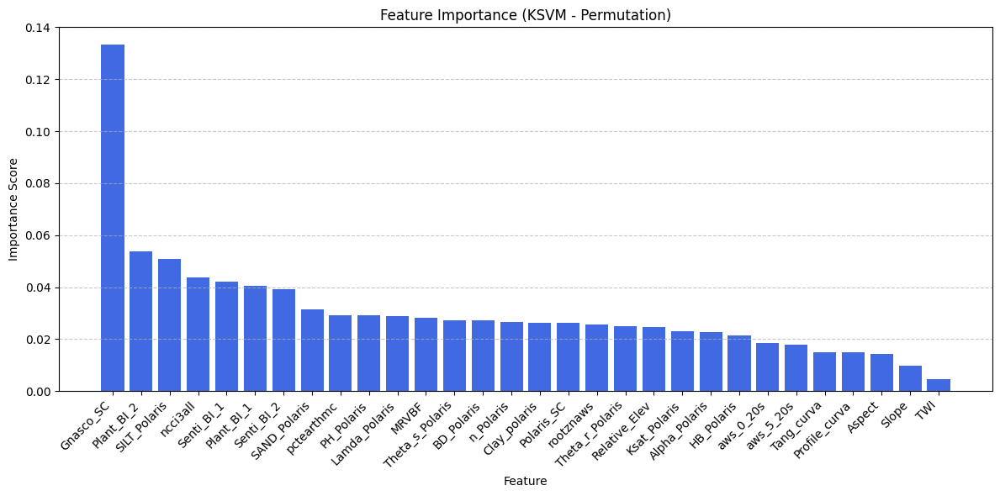

In [ ]:
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue')
plt.title("Feature Importance (KSVM - Permutation)")
plt.xlabel("Feature")
plt.ylabel("Importance Score")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


RFE KSVM

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long', ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize Kernelized Support Vector Machines (KSVM) with RBF kernel
ksvm = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

# Set the number of features to select (90% of total features)
num_features_to_select = int(0.3 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=SVR(kernel='linear'), n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []


# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []


# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    ksvm.fit(X_train, y_train)

    # Predictions
    y_pred = ksvm.predict(X_test)

     # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Kernelized Support Vector Machines (KSVM) - RBF Kernel")
print(f"Setup: {ksvm.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_ksvm_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Feature Importance for Linear Kernel Only
if ksvm.kernel == 'linear':  # If using a linear kernel, extract feature importance
    feature_importances = np.abs(ksvm.coef_).flatten()  # Absolute values of coefficients
    feature_names = selected_features  # Only selected features

    # Create DataFrame for visualization
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort descending

    # Plot Feature Importance
    plt.figure(figsize=(12, 6))
    plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
    plt.ylabel("Feature Importance Score (Absolute Coefficients)")
    plt.xlabel("Feature")
    plt.title("Feature Importance Plot (SVR with Linear Kernel)")
    plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

Selected Top 90% Features (10 out of 34):
['Relative_Elev', 'Senti_BI_1', 'Planet_BI_1', 'Planet_BI_2', 'Gnasco_SC', 'SILT_Polaris', 'pctearthmc', 'Alpha_Polaris', 'HB_Polaris', 'Lambda_Polaris']
Model: Kernelized Support Vector Machines (KSVM) - RBF Kernel
Setup: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Average Metrics Across 10-Fold CV (with 90% selected features):
MBE=-0.3652, MAE=1.4324, RMSE=2.1114, R²=0.5229


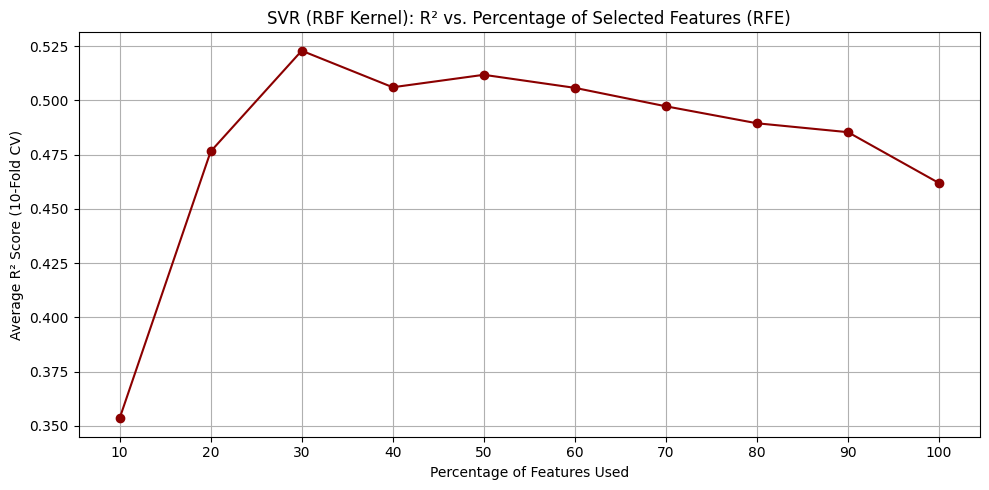

In [ ]:
r2_scores_vs_features = []

# Loop over different percentages of features
for pct in range(10, 101, 10):
    num_feats = int(pct / 100 * X.shape[1])

    # Perform RFE using a linear kernel SVR
    rfe = RFE(estimator=SVR(kernel='linear'), n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_index, test_index in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_index], X_rfe[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Use RBF kernel SVR to fit and predict
        ksvm.fit(X_train, y_train)
        y_pred = ksvm.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2_temp = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2_temp))

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='royalblue')
plt.title("SVR (RBF Kernel): R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()



Estimating feature importance using permutation (KSVM with RBF kernel, 90% selected features)...


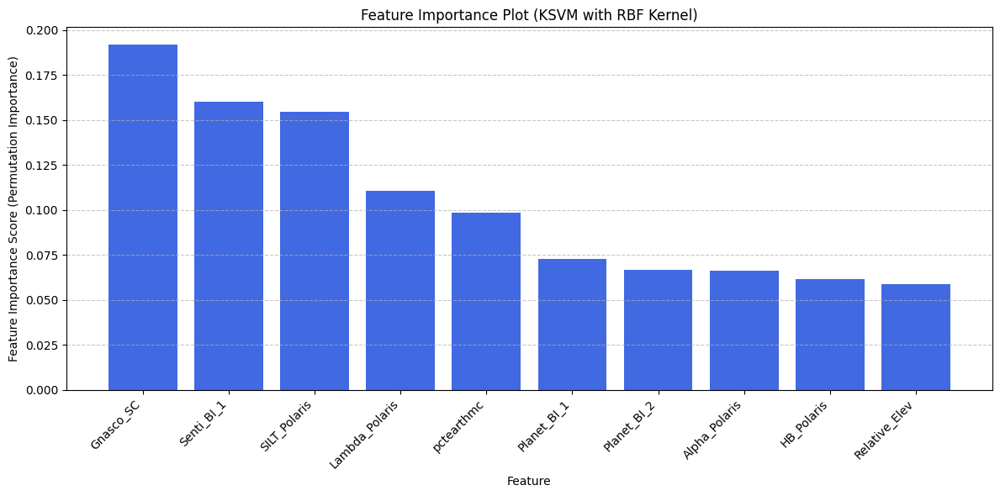

In [ ]:
from sklearn.inspection import permutation_importance

# ---- Permutation Feature Importance for KSVM with RBF Kernel (Top 90% RFE-selected) ----
print("\nEstimating feature importance using permutation (KSVM with RBF kernel, 90% selected features)...")

# Fit on full data with selected features
ksvm.fit(X_selected, y)

# Get permutation importance
perm_result = permutation_importance(
    ksvm, X_selected, y, n_repeats=10, random_state=42, scoring='r2'
)

# Build DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': perm_result.importances_mean
}).sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score (Permutation Importance)")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (KSVM with RBF Kernel)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.inspection import permutation_importance


In [ ]:
fold_importances = []


In [ ]:
# Compute permutation importance on test data
perm_result = permutation_importance(ksvm, X_test, y_test, n_repeats=10, random_state=42, scoring='r2')
fold_importances.append(perm_result.importances_mean)


In [ ]:
# Average permutation importances across all folds
avg_importances = np.mean(fold_importances, axis=0)

# Normalize so that total importance sums to 1
normalized_importances = avg_importances / np.sum(avg_importances)

# Create DataFrame for plotting
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)


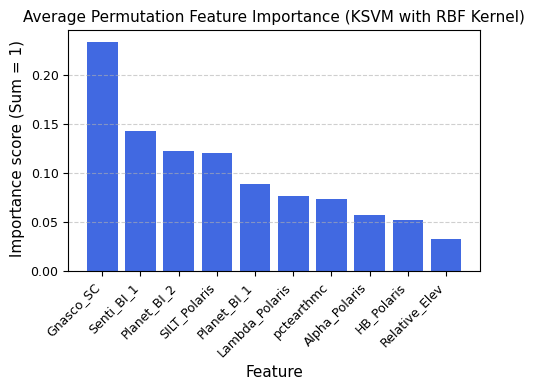

In [ ]:
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue')
plt.ylabel(" Importance score (Sum = 1)", fontsize=11)
plt.xlabel("Feature", fontsize=11)
plt.title("Average Permutation Feature Importance (KSVM with RBF Kernel)", fontsize=11)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


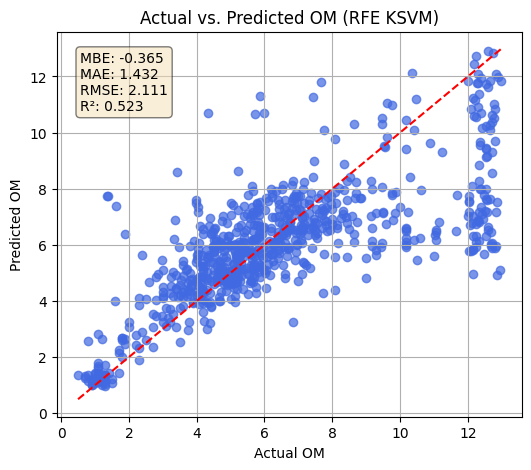

In [ ]:
# Create scatter plot
plt.figure(figsize=(6, 5))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (RFE KSVM)")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.3f}',
    f'MAE: {avg_mae:.3f}',
    f'RMSE: {avg_rmse:.3f}',
    f'R²: {avg_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

KSVM train test cv

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.base import clone

# === Step 1: Filter OM ≤ 12 and Drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
df_cleaned = df_filtered.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned[X.columns]
y = df_cleaned['OM']

# === Step 2: Train-Test Split (80% Train / 20% Test) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardize Features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Recursive Feature Elimination (RFE) ===
num_features_to_select = int(0.40 * X.shape[1])
rfe = RFE(estimator=SVR(kernel='linear'), n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X.columns[rfe.support_]
print(f"\nSelected Top {len(selected_features)} Features:\n{selected_features.tolist()}")

X_train_rfe = X_train_scaled[:, rfe.support_]
X_test_rfe = X_test_scaled[:, rfe.support_]

# === Step 5: GridSearchCV on Training Set ===
param_grid = {
    'C': [0.1, 1, 10],
    'epsilon': [0.01, 0.1, 0.2],
    'gamma': ['scale', 'auto'],
    'kernel': ['rbf']  # RBF only for kernelized SVR
}

grid_search = GridSearchCV(SVR(), param_grid, cv=10, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_rfe, y_train_full)

best_svr = grid_search.best_estimator_
print(f"\nBest Hyperparameters: {grid_search.best_params_}")

# === Step 6: Evaluate on Test Set ===
y_pred_test = best_svr.predict(X_test_rfe)
test_mbe = np.mean(y_pred_test - y_test)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
test_r2 = r2_score(y_test, y_pred_test)

print("\nTest Set Performance:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# === Step 7: 10-Fold CV on Training Set Using Best Estimator ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual = []
train_predicted = []
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_svr)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    train_actual.extend(y_val_cv)
    train_predicted.extend(y_val_pred)

    mbe_list.append(np.mean(y_val_pred - y_val_cv))
    mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    r2_list.append(r2_score(y_val_cv, y_val_pred))

# === Step 8: Print Training CV Metrics ===
print("\nTraining Set (10-Fold CV) Performance:")
print(f"MBE = {np.mean(mbe_list):.4f}, MAE = {np.mean(mae_list):.4f}, RMSE = {np.mean(rmse_list):.4f}, R² = {np.mean(r2_list):.4f}")



Selected Top 12 Features:
['Senti_BI_1', 'Polaris_SC', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'BD_Polaris', 'PH_Polaris', 'pctearthmc', 'Alpha_Polaris', 'HB_Polaris', 'n_Polaris', 'Theta_s_Polaris']

Best Hyperparameters: {'C': 1, 'epsilon': 0.2, 'gamma': 'auto', 'kernel': 'rbf'}

Test Set Performance:
MBE = -0.1690, MAE = 1.0567, RMSE = 1.5453, R² = 0.5350

Training Set (10-Fold CV) Performance:
MBE = -0.2262, MAE = 1.1511, RMSE = 1.6073, R² = 0.5028


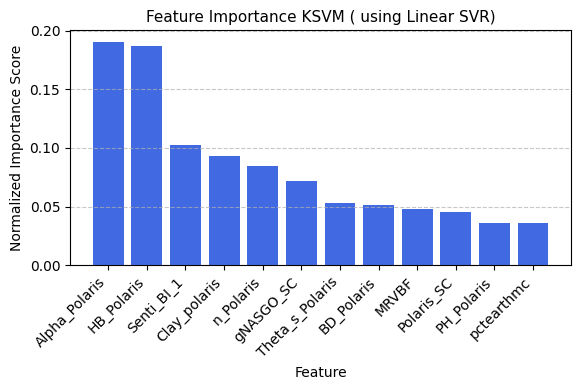

In [ ]:
# === Step 9: Feature Importance Plot (Based on RFE Estimator) ===
if hasattr(rfe.estimator_, 'coef_'):
    importances = np.abs(rfe.estimator_.coef_.flatten())
    feature_importance_df = pd.DataFrame({
        'Feature': selected_features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    # Normalize to sum to 1 (optional)
    feature_importance_df['Importance'] = feature_importance_df['Importance'] / feature_importance_df['Importance'].sum()

    # Plot
    plt.figure(figsize=(6, 4))
    plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
    plt.ylabel("Normalized Importance Score")
    plt.xlabel("Feature")
    plt.title("Feature Importance KSVM ( using Linear SVR)", fontsize=11)
    plt.xticks(rotation=45, ha="right")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


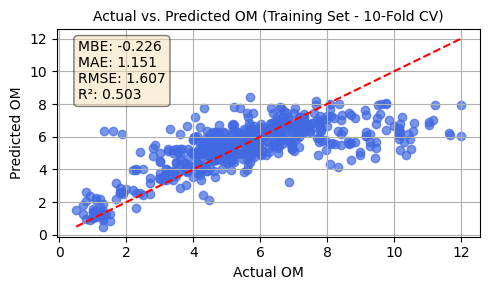

In [ ]:
import matplotlib.pyplot as plt

# === Convert to NumPy Arrays ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

# === Compute Metrics (already done earlier) ===
train_mbe = np.mean(mbe_list)
train_mae = np.mean(mae_list)
train_rmse = np.mean(rmse_list)
train_r2 = np.mean(r2_list)

# === Scatter Plot for Training Set ===
plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min(train_actual_np), max(train_actual_np)],
         [min(train_actual_np), max(train_actual_np)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Training Set)", fontsize=10)
plt.grid(True)

# Text box with metrics
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


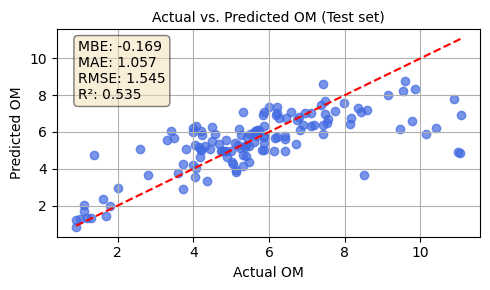

In [ ]:
# === Scatter Plot for Test Set ===
plt.figure(figsize=(5, 3))
plt.scatter(y_test, y_pred_test, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)],
         [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test set)", fontsize=10)
plt.grid(True)

# Text box with test metrics (already computed)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


KSVM planetscope train testcv

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.base import clone

# === Step 1: Filter OM ≤ 12 and Drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM','SAMPLEDATE','lati','long','Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
df_cleaned = df_filtered.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned[X.columns]
y = df_cleaned['OM']

# === Step 2: Train-Test Split (80% Train / 20% Test) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardize Features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Recursive Feature Elimination (RFE) ===
num_features_to_select = int(0.40 * X.shape[1])
rfe = RFE(estimator=SVR(kernel='linear'), n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X.columns[rfe.support_]
print(f"\nSelected Top {len(selected_features)} Features:\n{selected_features.tolist()}")

X_train_rfe = X_train_scaled[:, rfe.support_]
X_test_rfe = X_test_scaled[:, rfe.support_]

# === Step 5: GridSearchCV on Training Set ===
param_grid = {
    'C': [0.1, 1, 10],
    'epsilon': [0.01, 0.1, 0.2],
    'gamma': ['scale', 'auto'],
    'kernel': ['rbf']  # RBF only for kernelized SVR
}

grid_search = GridSearchCV(SVR(), param_grid, cv=10, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_rfe, y_train_full)

best_svr = grid_search.best_estimator_
print(f"\nBest Hyperparameters: {grid_search.best_params_}")

# === Step 6: Evaluate on Test Set ===
y_pred_test = best_svr.predict(X_test_rfe)
test_mbe = np.mean(y_pred_test - y_test)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
test_r2 = r2_score(y_test, y_pred_test)

print("\nTest Set Performance:")
print(f"MBE = {test_mbe:.4f}, MAE = {test_mae:.4f}, RMSE = {test_rmse:.4f}, R² = {test_r2:.4f}")

# === Step 7: 10-Fold CV on Training Set Using Best Estimator ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual = []
train_predicted = []
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

for train_idx, val_idx in kf.split(X_train_rfe):
    X_train_cv, X_val_cv = X_train_rfe[train_idx], X_train_rfe[val_idx]
    y_train_cv, y_val_cv = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]

    model_cv = clone(best_svr)
    model_cv.fit(X_train_cv, y_train_cv)
    y_val_pred = model_cv.predict(X_val_cv)

    train_actual.extend(y_val_cv)
    train_predicted.extend(y_val_pred)

    mbe_list.append(np.mean(y_val_pred - y_val_cv))
    mae_list.append(mean_absolute_error(y_val_cv, y_val_pred))
    rmse_list.append(np.sqrt(mean_squared_error(y_val_cv, y_val_pred)))
    r2_list.append(r2_score(y_val_cv, y_val_pred))

# === Step 8: Print Training CV Metrics ===
print("\nTraining Set (10-Fold CV) Performance:")
print(f"MBE = {np.mean(mbe_list):.4f}, MAE = {np.mean(mae_list):.4f}, RMSE = {np.mean(rmse_list):.4f}, R² = {np.mean(r2_list):.4f}")



Selected Top 12 Features:
['Relative_Elev', 'Planet_BI_1', 'gNASGO_SC', 'MRVBF', 'Clay_polaris', 'SAND_Polaris', 'PH_Polaris', 'pctearthmc', 'Alpha_Polaris', 'HB_Polaris', 'n_Polaris', 'Theta_s_Polaris']

Best Hyperparameters: {'C': 10, 'epsilon': 0.2, 'gamma': 'auto', 'kernel': 'rbf'}

Test Set Performance:
MBE = -0.0769, MAE = 0.9370, RMSE = 1.4737, R² = 0.5082

Training Set (10-Fold CV) Performance:
MBE = -0.1074, MAE = 1.1100, RMSE = 1.6315, R² = 0.5039


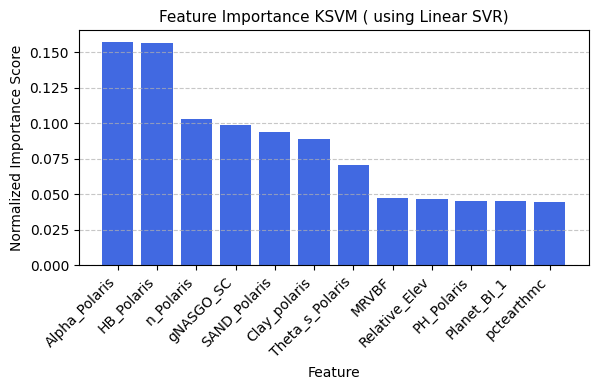

In [ ]:
# === Step 9: Feature Importance Plot (Based on RFE Estimator) ===
if hasattr(rfe.estimator_, 'coef_'):
    importances = np.abs(rfe.estimator_.coef_.flatten())
    feature_importance_df = pd.DataFrame({
        'Feature': selected_features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    # Normalize to sum to 1 (optional)
    feature_importance_df['Importance'] = feature_importance_df['Importance'] / feature_importance_df['Importance'].sum()

    # Plot
    plt.figure(figsize=(6, 4))
    plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
    plt.ylabel("Normalized Importance Score")
    plt.xlabel("Feature")
    plt.title("Feature Importance KSVM ( using Linear SVR)", fontsize=11)
    plt.xticks(rotation=45, ha="right")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


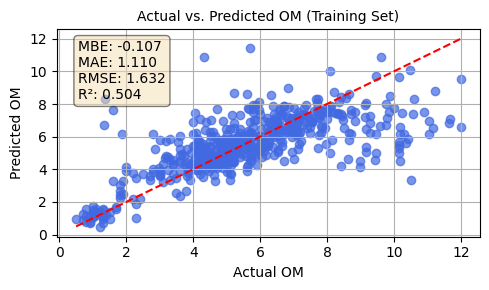

In [ ]:
import matplotlib.pyplot as plt

# === Convert to NumPy Arrays ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

# === Compute Metrics (already done earlier) ===
train_mbe = np.mean(mbe_list)
train_mae = np.mean(mae_list)
train_rmse = np.mean(rmse_list)
train_r2 = np.mean(r2_list)

# === Scatter Plot for Training Set ===
plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min(train_actual_np), max(train_actual_np)],
         [min(train_actual_np), max(train_actual_np)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Training Set)", fontsize=10)
plt.grid(True)

# Text box with metrics
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


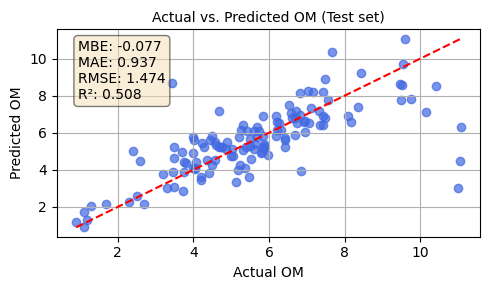

In [ ]:
# === Scatter Plot for Test Set ===
plt.figure(figsize=(5, 3))
plt.scatter(y_test, y_pred_test, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)],
         [min(y_test), max(y_test)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test set)", fontsize=10)
plt.grid(True)

# Text box with test metrics (already computed)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


PLSE

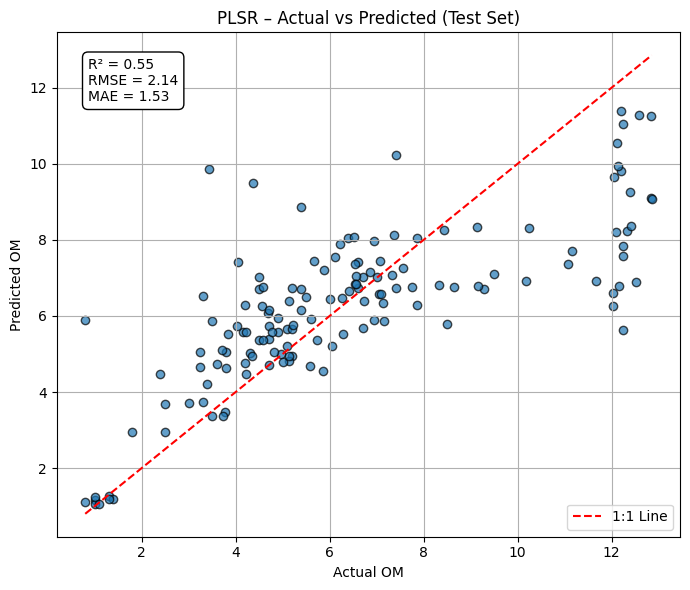

In [ ]:
plt.figure(figsize=(7, 6))
plt.scatter(y_test, y_pred_test, alpha=0.7, edgecolors='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='1:1 Line')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("PLSR – Actual vs Predicted (Test Set)")

plt.text(0.05, 0.95,
         f"R² = {test_r2:.2f}\nRMSE = {test_rmse:.2f}\nMAE = {test_mae:.2f}",
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4'))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


GB

Model: Gradient Boosting Regressor
Setup: {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.05, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 42, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Average Metrics Across 10-Fold CV:
MBE=-0.0021, MAE=1.4454, RMSE=2.0372, R²=0.5556


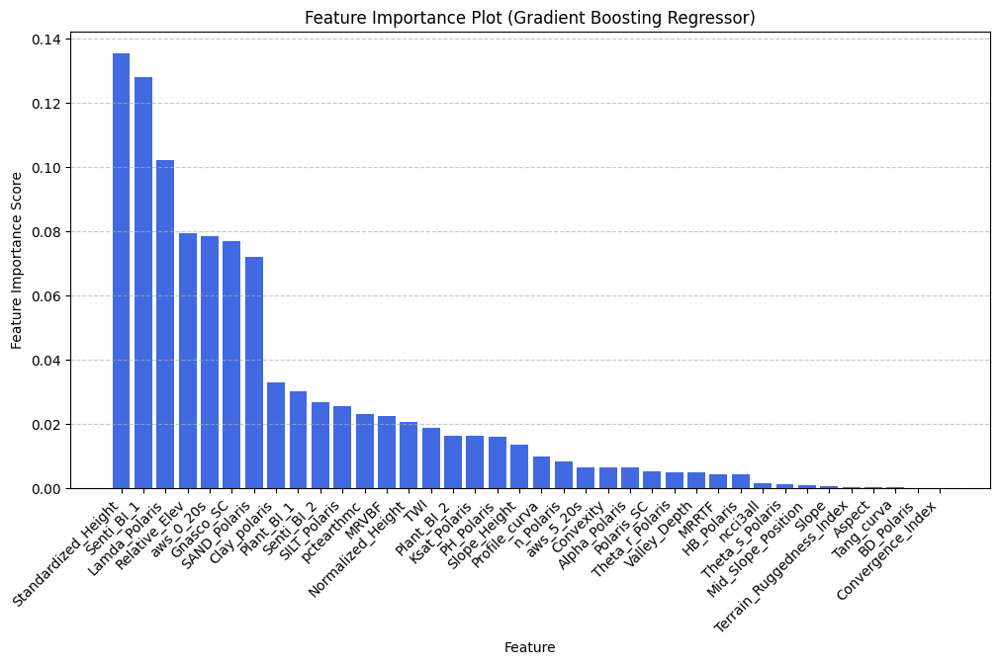

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'rootznaws'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize Gradient Boosting Regressor (GBR)
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.05, max_depth=3, random_state=42)

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    gbr.fit(X_train, y_train)

    # Predictions
    y_pred = gbr.predict(X_test)

    # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Gradient Boosting Regressor")
print(f"Setup: {gbr.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_gb = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances
feature_importances = gbr.feature_importances_
feature_names = X.columns  # Get the feature names

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Gradient Boosting Regressor)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


RFE GB

Selected Top 80% Features (9 out of 32):
['Relative_Elev', 'Senti_BI_1', 'gNASGO_SC', 'Clay_polaris', 'SILT_Polaris', 'ncci3all', 'aws_5_20s', 'Ksat_Polaris', 'Lamda_Polaris']
Model: Gradient Boosting Regressor
Setup: {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 42, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Average Metrics Across 10-Fold CV (with 80% selected features):
MBE=-0.0411, MAE=1.5043, RMSE=2.1825, R²=0.4962


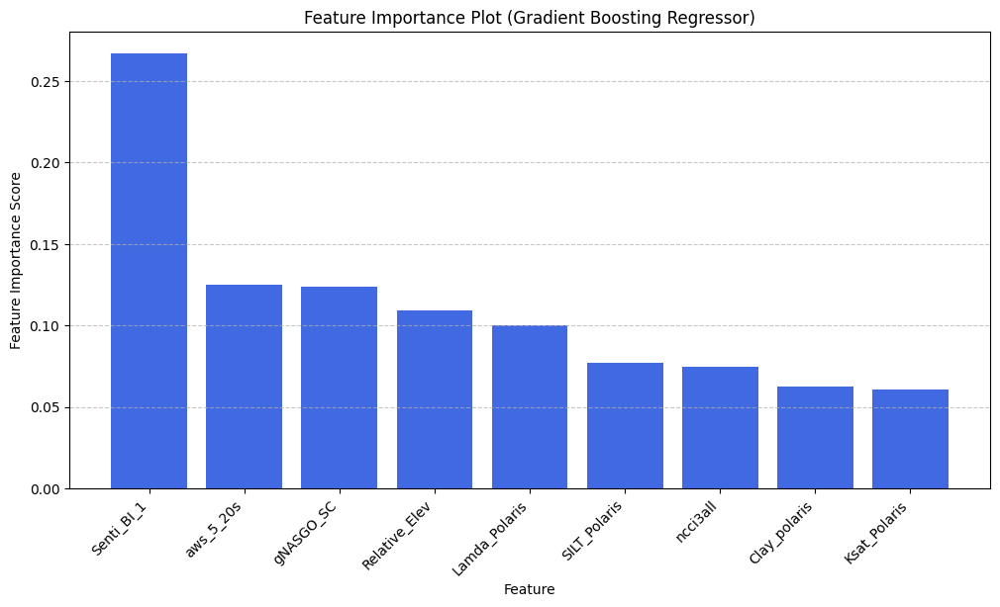

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','lati','long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2' ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in




# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize Gradient Boosting Regressor (GBR)
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Set the number of features to select (80% of total features)
num_features_to_select = int(0.40 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=gbr, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 80% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    gbr.fit(X_train, y_train)

    # Predictions
    y_pred = gbr.predict(X_test)

     # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Gradient Boosting Regressor")
print(f"Setup: {gbr.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 80% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_gb_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances for the selected features
feature_importances = gbr.feature_importances_

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': selected_features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Gradient Boosting Regressor)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
fold_importances = []  # For storing feature importances from each fold


In [ ]:
# Train model
gbr.fit(X_train, y_train)

# Store feature importances for this fold
fold_importances.append(gbr.feature_importances_)


In [ ]:
# Average feature importances across folds
avg_importances = np.mean(fold_importances, axis=0)

# Normalize to ensure the sum = 1
normalized_importances = avg_importances / np.sum(avg_importances)

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)


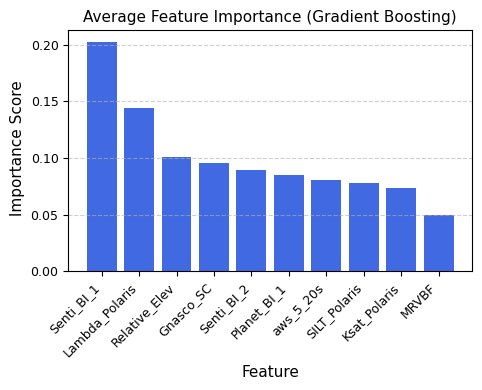

In [ ]:
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel(" Importance Score", fontsize=11)
plt.xlabel("Feature", fontsize=11)
plt.title("Average Feature Importance (Gradient Boosting)", fontsize=11)
plt.xticks(rotation=45, ha="right", fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
r2_scores_vs_features = []

# Loop over different percentages of features
for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # RFE with GBR as estimator
    rfe = RFE(estimator=GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42),
              n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        gbr.fit(X_train, y_train)
        y_pred = gbr.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2 = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2))

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='royalblue')
plt.title("Gradient Boosting: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


KeyboardInterrupt: 

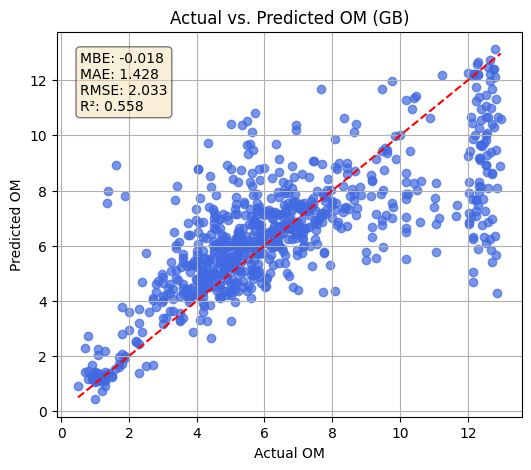

In [ ]:
# Create scatter plot
plt.figure(figsize=(6, 5))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7)  # Scatter plot of all predictions
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="red", linestyle="--")  # 1:1 line
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (GB)")
plt.grid(True)



# Add metrics text to the plot
textstr = '\n'.join((
    f'MBE: {avg_mbe:.3f}',
    f'MAE: {avg_mae:.3f}',
    f'RMSE: {avg_rmse:.3f}',
    f'R²: {avg_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

RFE GB CV-test, grid serch sentinel


Best Model Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}

Average Train Metrics (10-Fold CV):
MBE: -0.0447, MAE: 1.0623, RMSE: 1.4439, R²: 0.5933

Test Set Metrics:
MBE: 0.0287, MAE: 0.9584, RMSE: 1.3495, R²: 0.6453


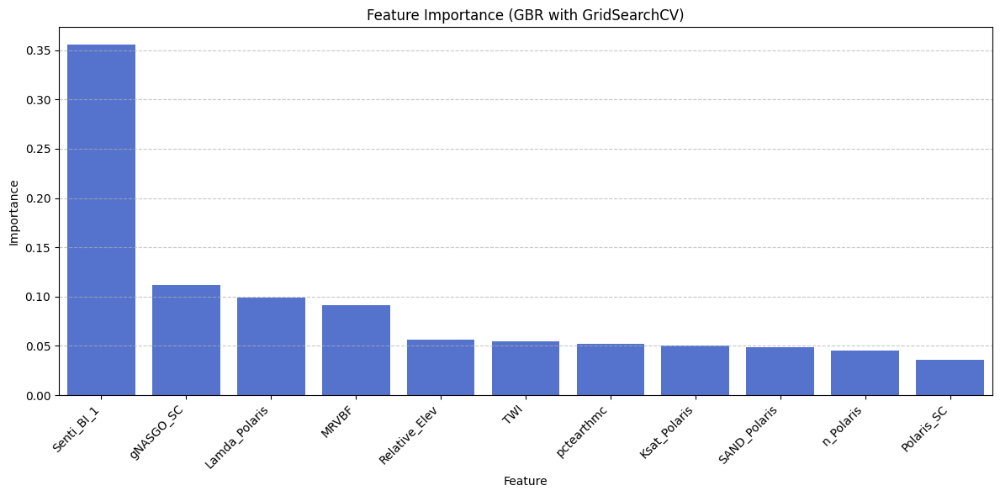

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter out outliers and define X, y ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']

# Drop NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split (80/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Recursive Feature Elimination (40% of features) ===
num_features_to_select = int(0.35 * X.shape[1])
gbr_base = GradientBoostingRegressor(random_state=42)
rfe = RFE(estimator=gbr_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Hyperparameter Tuning ===
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5]
}
grid_search = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: Cross-validation on train set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Evaluate on test set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_metrics = {
    'mbe': np.mean(y_test_pred - y_test),
    'mae': mean_absolute_error(y_test, y_test_pred),
    'rmse': np.sqrt(mean_squared_error(y_test, y_test_pred)),
    'r2': r2_score(y_test, y_test_pred)
}

# === Step 8: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nAverage Train Metrics (10-Fold CV):")
print(f"MBE: {np.mean(train_metrics['mbe']):.4f}, MAE: {np.mean(train_metrics['mae']):.4f}, "
      f"RMSE: {np.mean(train_metrics['rmse']):.4f}, R²: {np.mean(train_metrics['r2']):.4f}")

print("\nTest Set Metrics:")
print(f"MBE: {test_metrics['mbe']:.4f}, MAE: {test_metrics['mae']:.4f}, "
      f"RMSE: {test_metrics['rmse']:.4f}, R²: {test_metrics['r2']:.4f}")

# === Step 9: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (GBR with GridSearchCV)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


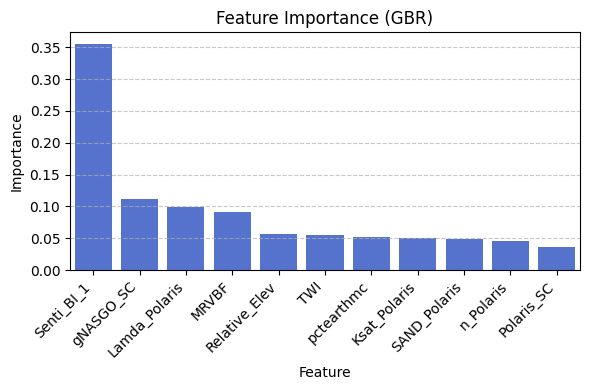

In [ ]:
plt.figure(figsize=(6, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (GBR)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
train_actual = []
train_predicted = []

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    # Append predictions and actual values for the fold
    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

    # Metrics
    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))


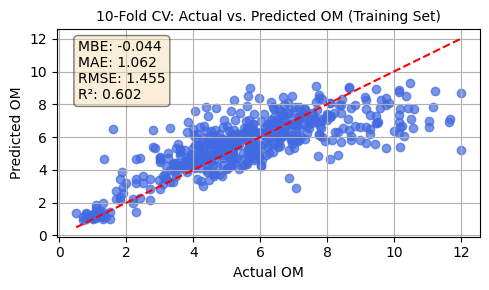

In [ ]:
# === Convert to NumPy Arrays ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

# === Compute Average CV Metrics ===
train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Determine plot range ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

# === Scatter Plot ===
plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Training Set)", fontsize=10)
plt.grid(True)

# === Metrics Box ===
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


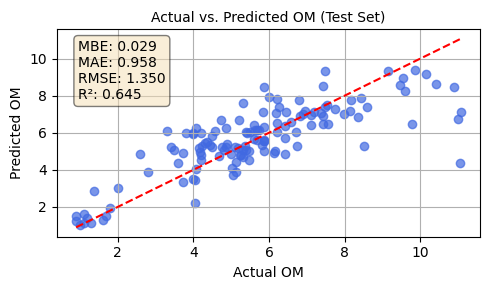

In [ ]:
# === Convert Test Data to NumPy Arrays ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

# === Compute Test Metrics ===
test_mbe = np.mean(test_predicted_np - test_actual_np)
test_mae = mean_absolute_error(test_actual_np, test_predicted_np)
test_rmse = np.sqrt(mean_squared_error(test_actual_np, test_predicted_np))
test_r2 = r2_score(test_actual_np, test_predicted_np)

# === Scatter Plot for Test Set ===
plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min(test_actual_np), max(test_actual_np)],
         [min(test_actual_np), max(test_actual_np)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)

# Text box with metrics
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()



Best Model Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}

Average Train Metrics (10-Fold CV):
MBE: -0.0089, MAE: 1.0857, RMSE: 1.4729, R²: 0.5931

Test Set Metrics:
MBE: 0.1074, MAE: 1.0622, RMSE: 1.4762, R²: 0.5065


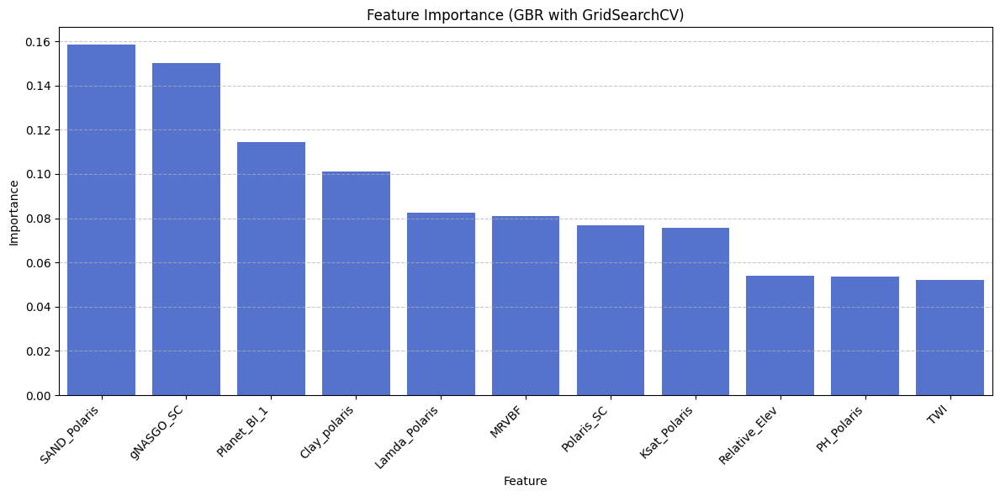

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter out outliers and define X, y ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']

# Drop NaNs
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split (80/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Recursive Feature Elimination (40% of features) ===
num_features_to_select = int(0.35 * X.shape[1])
gbr_base = GradientBoostingRegressor(random_state=42)
rfe = RFE(estimator=gbr_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Hyperparameter Tuning ===
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5]
}
grid_search = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: Cross-validation on train set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Evaluate on test set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_metrics = {
    'mbe': np.mean(y_test_pred - y_test),
    'mae': mean_absolute_error(y_test, y_test_pred),
    'rmse': np.sqrt(mean_squared_error(y_test, y_test_pred)),
    'r2': r2_score(y_test, y_test_pred)
}

# === Step 8: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nAverage Train Metrics (10-Fold CV):")
print(f"MBE: {np.mean(train_metrics['mbe']):.4f}, MAE: {np.mean(train_metrics['mae']):.4f}, "
      f"RMSE: {np.mean(train_metrics['rmse']):.4f}, R²: {np.mean(train_metrics['r2']):.4f}")

print("\nTest Set Metrics:")
print(f"MBE: {test_metrics['mbe']:.4f}, MAE: {test_metrics['mae']:.4f}, "
      f"RMSE: {test_metrics['rmse']:.4f}, R²: {test_metrics['r2']:.4f}")

# === Step 9: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (GBR with GridSearchCV)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


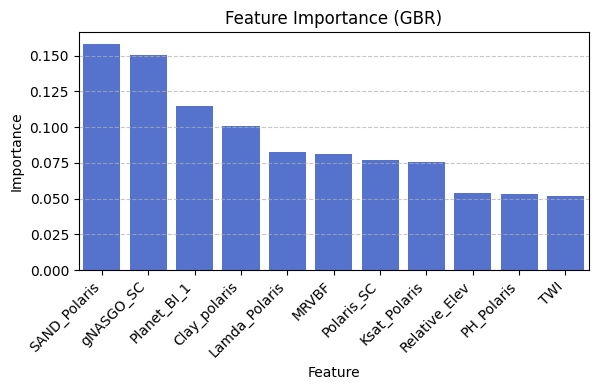

In [ ]:
plt.figure(figsize=(6, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (GBR)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
train_actual = []
train_predicted = []

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    # Append predictions and actual values for the fold
    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

    # Metrics
    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))


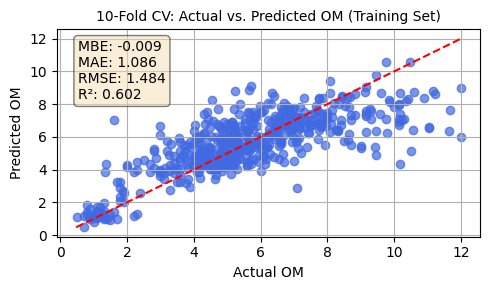

In [ ]:
# === Convert to NumPy Arrays ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

# === Compute Average CV Metrics ===
train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Determine plot range ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

# === Scatter Plot ===
plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Training Set)", fontsize=10)
plt.grid(True)

# === Metrics Box ===
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


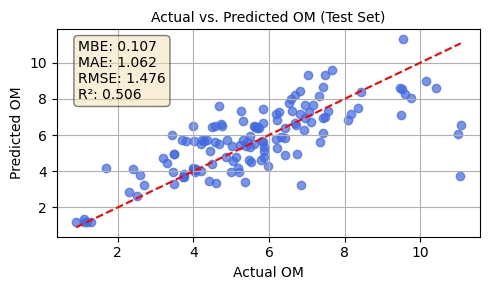

In [ ]:
# === Convert Test Data to NumPy Arrays ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

# === Compute Test Metrics ===
test_mbe = np.mean(test_predicted_np - test_actual_np)
test_mae = mean_absolute_error(test_actual_np, test_predicted_np)
test_rmse = np.sqrt(mean_squared_error(test_actual_np, test_predicted_np))
test_r2 = r2_score(test_actual_np, test_predicted_np)

# === Scatter Plot for Test Set ===
plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min(test_actual_np), max(test_actual_np)],
         [min(test_actual_np), max(test_actual_np)], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)

# Text box with metrics
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()


DT

Model: Decision Tree Regressor
Setup: {'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': 42, 'splitter': 'best'}
Average Metrics Across 10-Fold CV:
MBE=-0.0566, MAE=1.6371, RMSE=2.5801, R²=0.2614


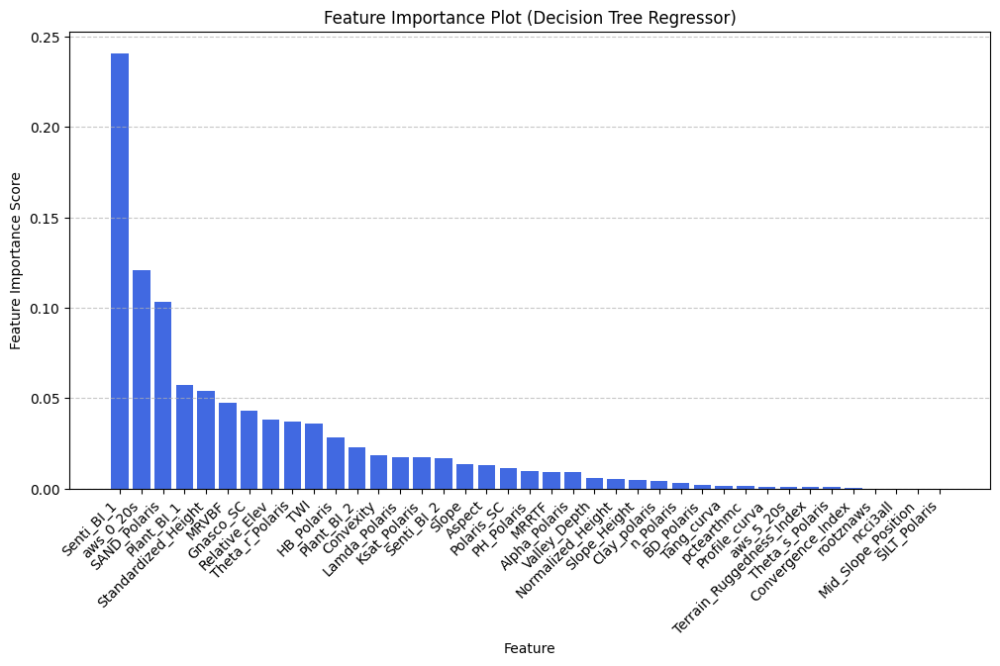

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize Decision Tree Regressor
dt = DecisionTreeRegressor(random_state=42, max_depth=10)  # Adjust max_depth for better performance

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Initialize lists to store all predictions and actual values
all_y_test = []
all_y_pred = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    dt.fit(X_train, y_train)

    # Predictions
    y_pred = dt.predict(X_test)

     # Extend all_y_test and all_y_pred after predictions
    all_y_test.extend(y_test)  # Extend with y_test values
    all_y_pred.extend(y_pred)  # Extend with y_pred values

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Decision Tree Regressor")
print(f"Setup: {dt.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_dt = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances
feature_importances = dt.feature_importances_
feature_names = X.columns  # Get the feature names

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Decision Tree Regressor)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

With RFE DT

Selected Top 90% Features (10 out of 34):
['Relative_Elev', 'Senti_BI_1', 'Senti_BI_2', 'Planet_BI_1', 'Gnasco_SC', 'MRVBF', 'TWI', 'aws_5_20s', 'HB_Polaris', 'Lambda_Polaris']
Model: Decision Tree Regressor
Setup: {'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': 42, 'splitter': 'best'}
Average Metrics Across 10-Fold CV (with 90% selected features):
MBE=-0.0269, MAE=1.5918, RMSE=2.4975, R²=0.3313


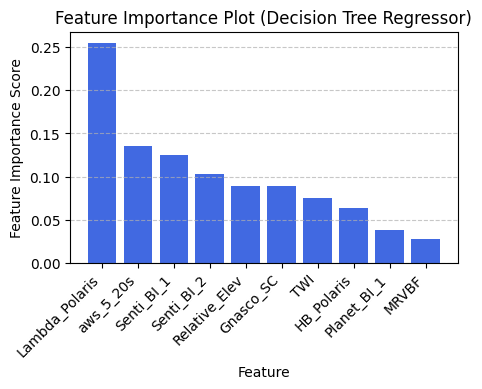

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','lati','long','Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize Decision Tree Regressor
dt = DecisionTreeRegressor(random_state=42, max_depth=10)  # Adjust max_depth for better performance

# Set the number of features to select (90% of total features)
num_features_to_select = int(0.4 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=dt, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    dt.fit(X_train, y_train)

    # Predictions
    y_pred = dt.predict(X_test)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Decision Tree Regressor")
print(f"Setup: {dt.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_dt_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances for the selected features
feature_importances = dt.feature_importances_

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': selected_features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(5, 3))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel(" Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (Decision Tree Regressor)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-29-e8de40770b67>:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


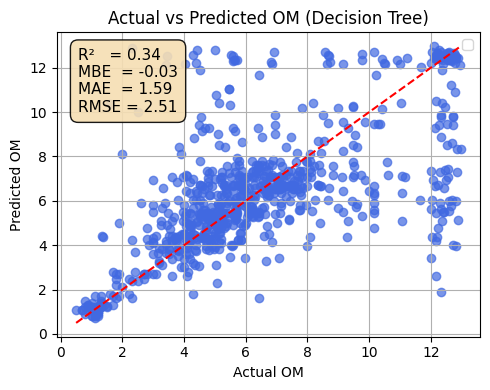

In [ ]:
# Step: Collect all true and predicted values across folds for a complete scatter plot
all_actuals = []
all_preds = []

# Re-run KFold loop to collect predictions from all folds
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    dt.fit(X_train, y_train)
    y_pred = dt.predict(X_test)

    all_actuals.extend(y_test)
    all_preds.extend(y_pred)

# Convert to arrays
all_actuals = np.array(all_actuals)
all_preds = np.array(all_preds)

# Compute overall metrics
final_r2 = r2_score(all_actuals, all_preds)
final_rmse = np.sqrt(mean_squared_error(all_actuals, all_preds))
final_mae = mean_absolute_error(all_actuals, all_preds)
final_mbe = np.mean(all_preds - all_actuals)

# Scatter plot
plt.figure(figsize=(5, 4))
plt.scatter(all_actuals, all_preds, color='royalblue', alpha=0.7,)
plt.plot([min(all_actuals), max(all_actuals)],
         [min(all_actuals), max(all_actuals)],
         'r--', )

plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs Predicted OM (Decision Tree)")

# Metrics box (wheat color)
metrics_text = (f"R²   = {final_r2:.2f}\n"
                f"MBE  = {final_mbe:.2f}\n"
                f"MAE  = {final_mae:.2f}\n"
                f"RMSE = {final_rmse:.2f}")

props = dict(boxstyle='round,pad=0.5', facecolor='wheat', alpha=0.9)
plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top', bbox=props)

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


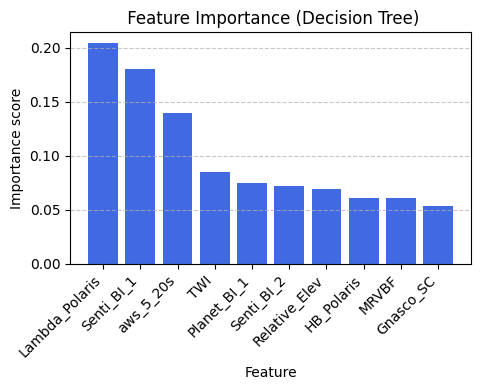

In [ ]:
# Initialize array to collect feature importances across all folds
feature_importance_matrix = np.zeros(len(selected_features))

# Re-run K-Fold to collect average feature importances
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    dt.fit(X_train, y_train)

    # Accumulate feature importances
    feature_importance_matrix += dt.feature_importances_

# Average across folds
avg_feature_importances = feature_importance_matrix / kf.get_n_splits()

# Normalize importance to sum to 1 (optional but recommended)
normalized_importances = avg_feature_importances / avg_feature_importances.sum()

# Create DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)

# Plot averaged feature importance
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Importance score")
plt.xlabel("Feature")
plt.title(" Feature Importance (Decision Tree)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


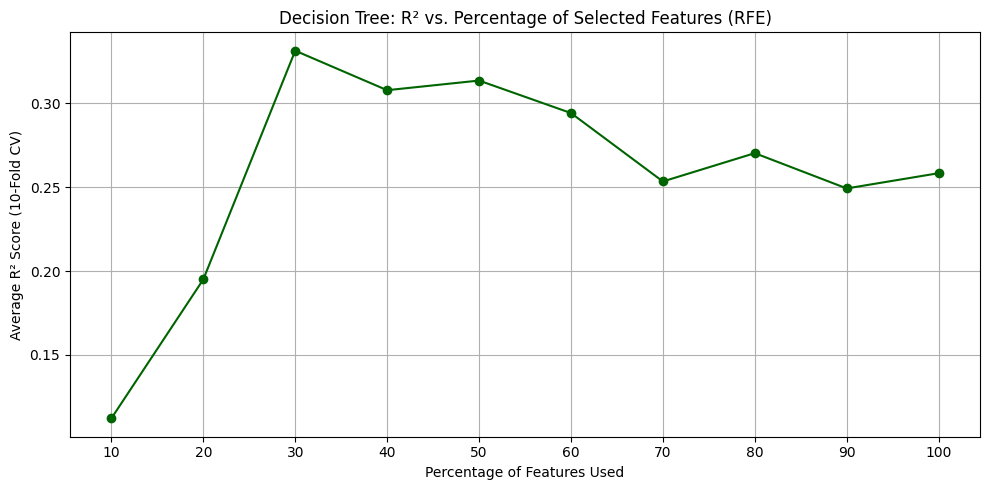

In [ ]:
r2_scores_vs_features = []

# Loop over different percentages of features
for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # RFE using Decision Tree
    rfe = RFE(estimator=DecisionTreeRegressor(random_state=42, max_depth=10),
              n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        dt.fit(X_train, y_train)
        y_pred = dt.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2 = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2))

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='darkgreen')
plt.title("Decision Tree: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


RFE DT_CV_Test


Best Model Parameters: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10}

Train Set Metrics (10-Fold Cross-Validation):
MBE: -0.0463, MAE: 1.1876, RMSE: 1.6196, R²: 0.5069

Test Set Metrics:
MBE: 0.1150, MAE: 1.0982, RMSE: 1.5871, R²: 0.5095


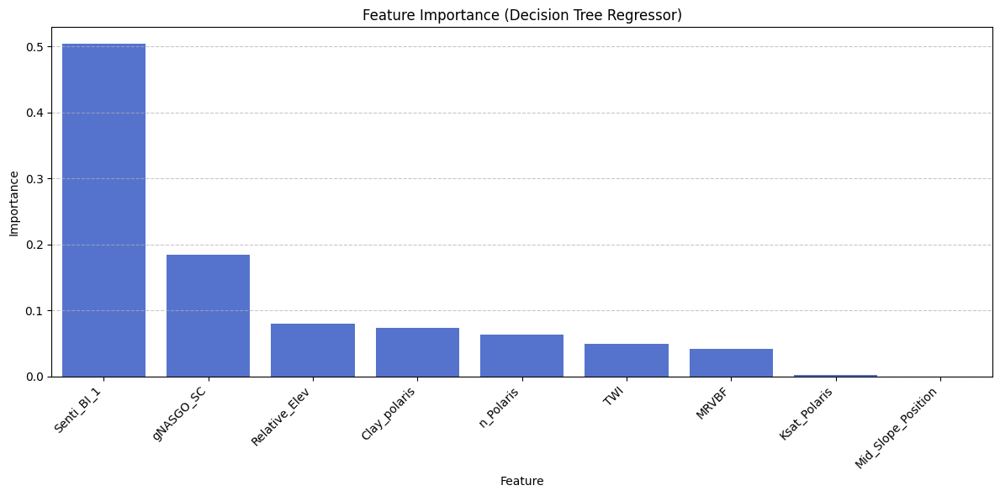

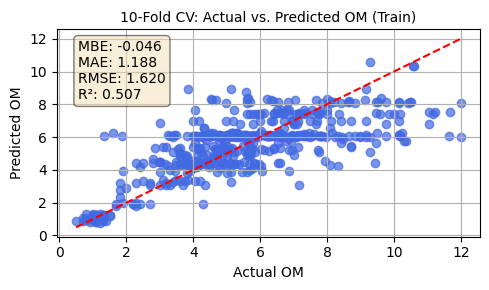

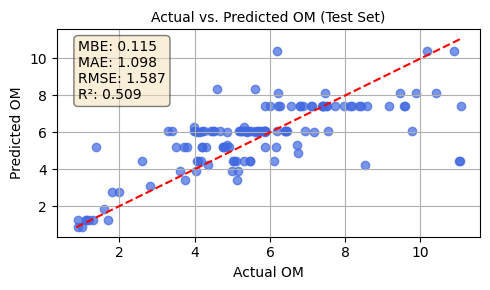

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# === Step 1: Filter out OM > 12 and NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]  # <-- Keep OM ≤ 12 only
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()



# === Step 2: Train-test split (80/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Recursive Feature Elimination (40% of features) ===
num_features_to_select = int(0.30 * X.shape[1])
dt_base = DecisionTreeRegressor(random_state=42)
rfe = RFE(estimator=dt_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Hyperparameter Tuning ===
param_grid = {
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}
train_actual = []
train_predicted = []

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

# === Step 7: Evaluate on test set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Compute Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (Decision Tree Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


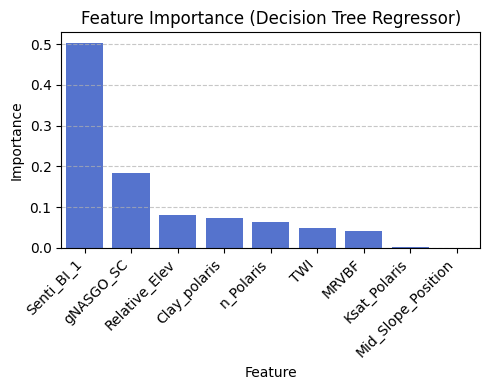

In [ ]:
# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(5, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (Decision Tree Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Best Model Parameters: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10}

Train Set Metrics (10-Fold Cross-Validation):
MBE: 0.0011, MAE: 1.3215, RMSE: 1.8307, R²: 0.3938

Test Set Metrics:
MBE: 0.0810, MAE: 1.0792, RMSE: 1.4699, R²: 0.5107


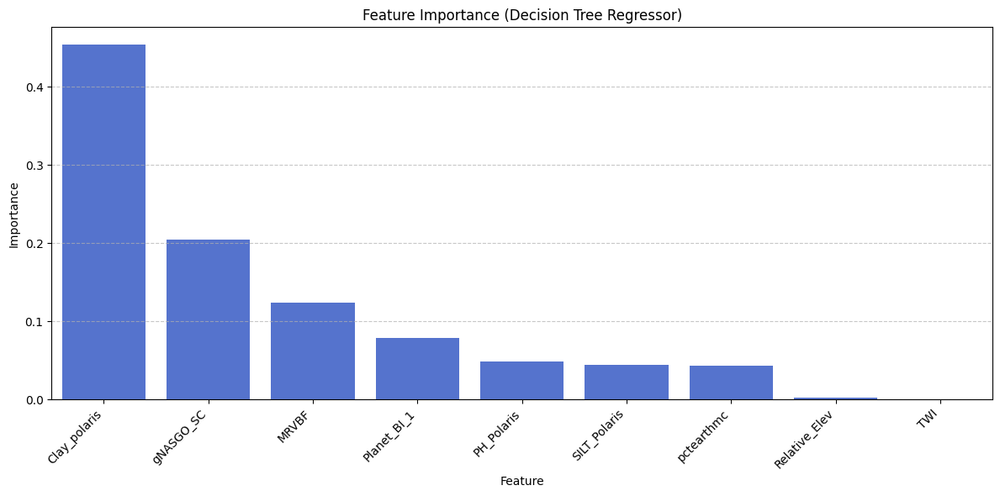

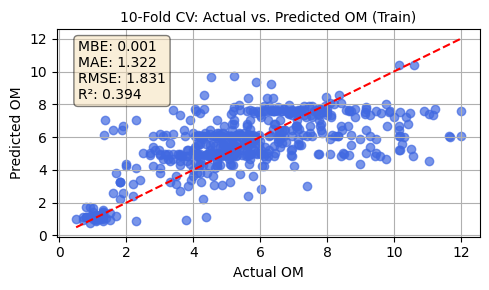

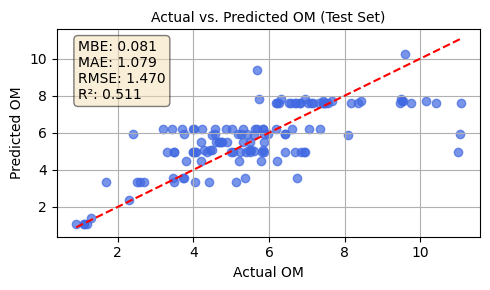

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# === Step 1: Filter out OM > 12 and NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]  # <-- Keep OM ≤ 12 only
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()



# === Step 2: Train-test split (80/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Recursive Feature Elimination (40% of features) ===
num_features_to_select = int(0.30 * X.shape[1])
dt_base = DecisionTreeRegressor(random_state=42)
rfe = RFE(estimator=dt_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Hyperparameter Tuning ===
param_grid = {
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}
train_actual = []
train_predicted = []

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

# === Step 7: Evaluate on test set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Compute Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (Decision Tree Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


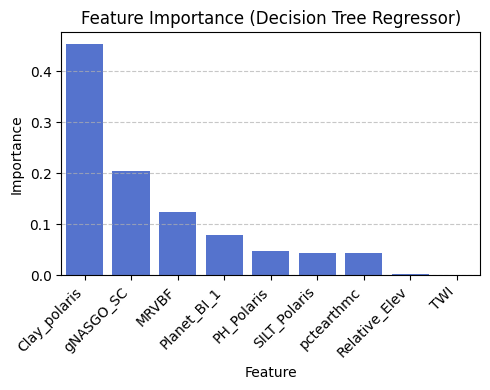

In [ ]:
# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(5, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (Decision Tree Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

XGBOOST

Model: XGBRegressor
Setup: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 10, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Average Metrics Across 10-Fold CV:
MBE=-0.0368, MAE=1.2890, RMSE=1.9663, R²=0.

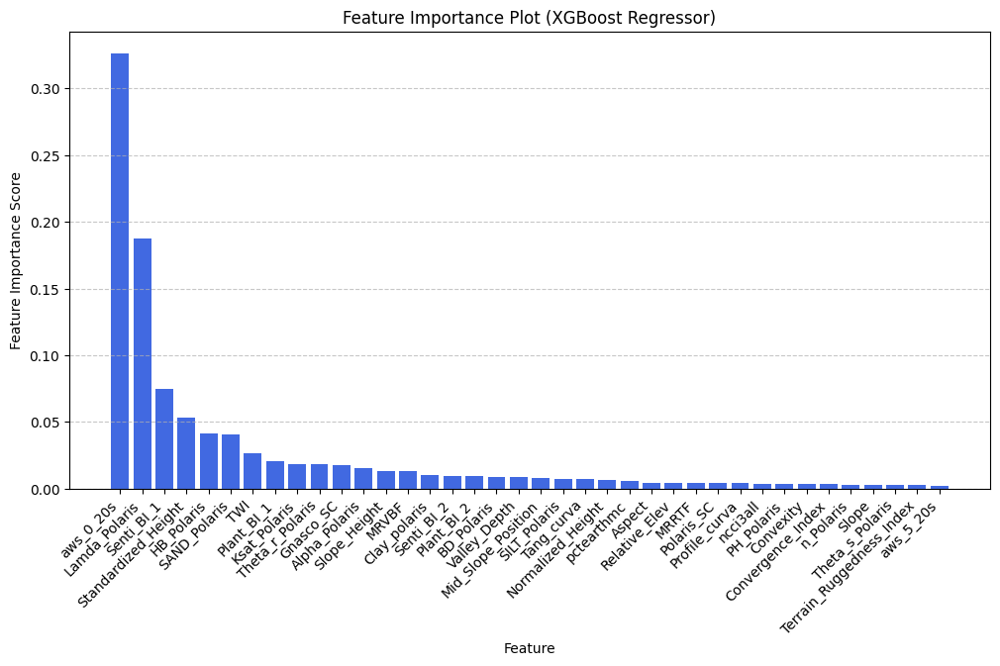

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long','Sensor_OM','rootznaws'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize XGBoost Regressor
xgb = XGBRegressor(random_state=42, max_depth=10, n_estimators=100, learning_rate=0.1)

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    xgb.fit(X_train, y_train)

    # Predictions
    y_pred = xgb.predict(X_test)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: XGBRegressor")
print(f"Setup: {xgb.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_xgb = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances
feature_importances = xgb.feature_importances_
feature_names = X.columns  # Get the feature names

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (XGBoost Regressor)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

WITH RFE XGBOOST

Selected Top 90% Features (10 out of 34):
['Senti_BI_1', 'Senti_BI_2', 'Gnasco_SC', 'MRVBF', 'TWI', 'pctearthmc', 'aws_5_20s', 'HB_Polaris', 'Lambda_Polaris', 'Theta_r_Polaris']
Model: XGBRegressor
Setup: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 10, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_wei

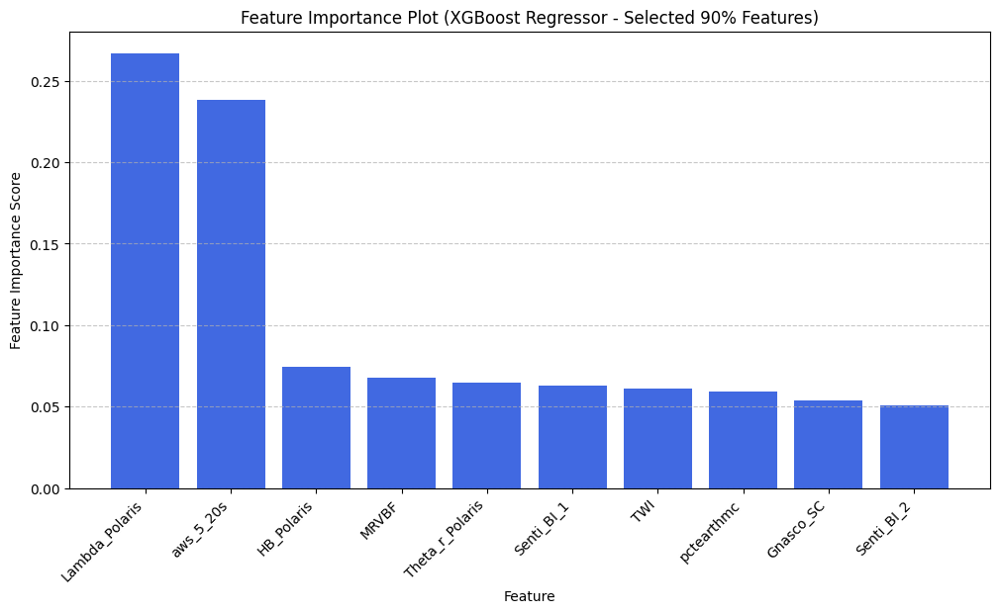

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long','Sensor_OM','rootznaws', 'Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize XGBoost Regressor
xgb = XGBRegressor(random_state=42, max_depth=10, n_estimators=100, learning_rate=0.1)

# Set the number of features to select (90% of total features)
num_features_to_select = int(0.3 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=xgb, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    xgb.fit(X_train, y_train)

    # Predictions
    y_pred = xgb.predict(X_test)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: XGBRegressor")
print(f"Setup: {xgb.get_params()}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_xgb_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract feature importances for the selected features
feature_importances = xgb.feature_importances_

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': selected_features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)  # Sort in descending order

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (XGBoost Regressor - Selected 90% Features)")
plt.xticks(rotation=45, ha="right")  # Rotate feature names for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
fold_importances = []


In [ ]:
# Store feature importances for this fold
fold_importances.append(xgb.feature_importances_)


In [ ]:
# Average importances across all folds
avg_importances = np.mean(fold_importances, axis=0)

# Normalize so the sum = 1
normalized_importances = avg_importances / np.sum(avg_importances)

# Create a DataFrame for plotting
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)


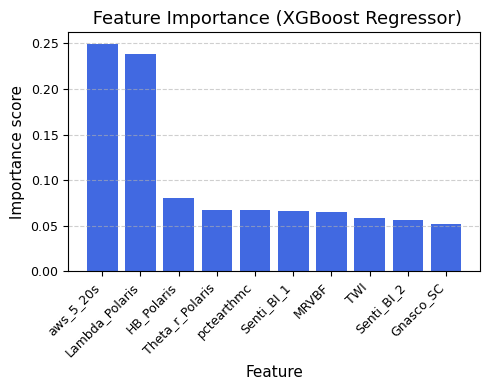

In [ ]:
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel(" Importance score ", fontsize=11)
plt.xlabel("Feature", fontsize=11)
plt.title(" Feature Importance (XGBoost Regressor)", fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


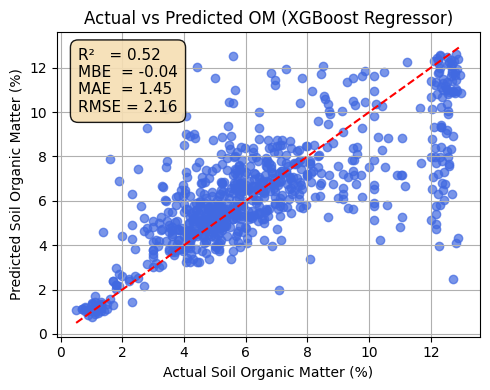

In [ ]:
# Step: Collect all true and predicted values across folds for a complete scatter plot (XGBoost)
all_actuals = []
all_preds = []

# Re-run KFold loop to collect predictions from all folds
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    xgb.fit(X_train, y_train)
    y_pred = xgb.predict(X_test)

    all_actuals.extend(y_test)
    all_preds.extend(y_pred)

# Convert to arrays
all_actuals = np.array(all_actuals)
all_preds = np.array(all_preds)

# Compute overall metrics
final_r2 = r2_score(all_actuals, all_preds)
final_rmse = np.sqrt(mean_squared_error(all_actuals, all_preds))
final_mae = mean_absolute_error(all_actuals, all_preds)
final_mbe = np.mean(all_preds - all_actuals)

# Scatter plot
plt.figure(figsize=(5, 4))
plt.scatter(all_actuals, all_preds, color='royalblue', alpha=0.7)
plt.plot([min(all_actuals), max(all_actuals)],
         [min(all_actuals), max(all_actuals)],
         'r--')

plt.xlabel("Actual Soil Organic Matter (%)")
plt.ylabel("Predicted Soil Organic Matter (%)")
plt.title("Actual vs Predicted OM (XGBoost Regressor)")

# Metrics box
metrics_text = (f"R²   = {final_r2:.2f}\n"
                f"MBE  = {final_mbe:.2f}\n"
                f"MAE  = {final_mae:.2f}\n"
                f"RMSE = {final_rmse:.2f}")

props = dict(boxstyle='round,pad=0.5', facecolor='wheat', alpha=0.9)
plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top', bbox=props)

plt.grid(True)
plt.tight_layout()
plt.show()


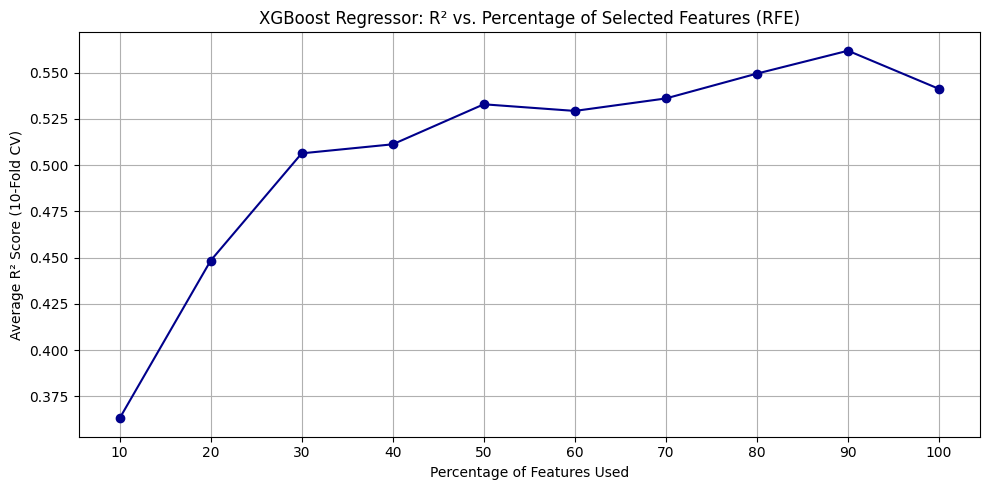

In [ ]:
r2_scores_vs_features = []

# Loop over different percentages of features
for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # Perform RFE with XGBRegressor
    rfe = RFE(estimator=XGBRegressor(random_state=42, max_depth=10, n_estimators=100, learning_rate=0.1),
              n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        xgb.fit(X_train, y_train)
        y_pred = xgb.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2 = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2))

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='darkblue')
plt.title("XGBoost Regressor: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


XGBOOST TREAIN TEST CV


Best Model Parameters: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100}

Train Set Metrics (10-Fold Cross-Validation):
MBE: -0.0057, MAE: 1.1114, RMSE: 1.5342, R²: 0.5743

Test Set Metrics:
MBE: 0.1127, MAE: 1.0994, RMSE: 1.5307, R²: 0.4694


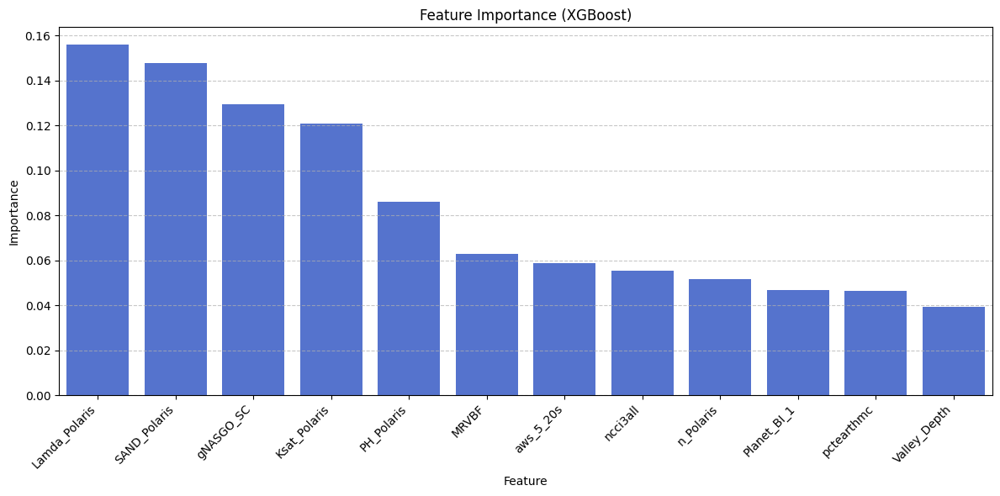

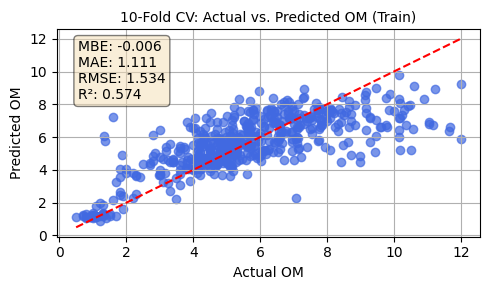

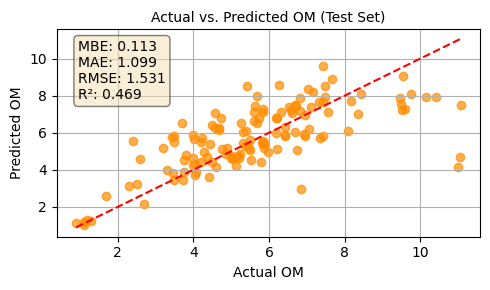

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter out OM > 12 and NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE with XGBoost ===
num_features_to_select = int(0.40 * X.shape[1])
xgb_base = XGBRegressor(random_state=42, verbosity=0)
rfe = RFE(estimator=xgb_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Grid Search for XGBoost ===
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5]
}
grid_search = GridSearchCV(XGBRegressor(random_state=42, verbosity=0), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold CV on Train Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}
train_actual = []
train_predicted = []

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

# === Step 7: Evaluate on Test Set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Compute Average Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (XGBoost)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="darkorange", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


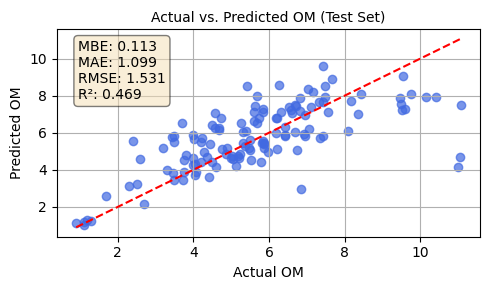

In [ ]:
# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

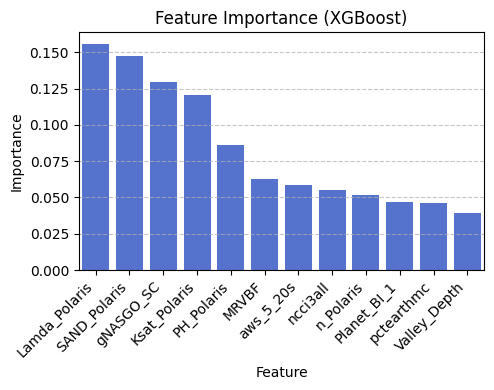

In [ ]:
# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(5, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (XGBoost)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

RFE_ADA_boosting

Selected Features (10 out of 34): ['Relative_Elev', 'Senti_BI_1', 'Senti_BI_2', 'Planet_BI_1', 'Gnasco_SC', 'Clay_polaris', 'SILT_Polaris', 'aws_5_20s', 'Ksat_Polaris', 'Lambda_Polaris']

Model: AdaBoost Regressor
Average MBE:  0.1811
Average MAE:  1.5983
Average RMSE: 2.1197
Average R²:   0.5193


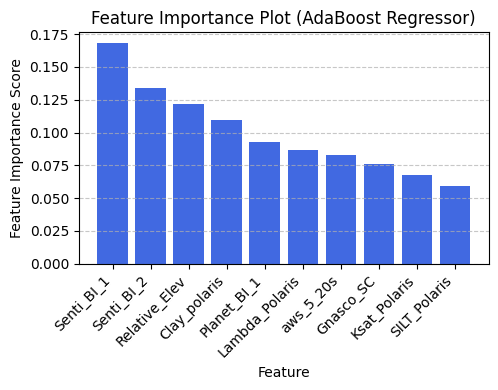

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor  # Base estimator for AdaBoost

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long','Sensor_OM','rootznaws', 'Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height'])
y = df_m['OM']

# Remove rows with NaN values
X = X.dropna()
y = y[X.index]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize AdaBoost Regressor with a Decision Tree base
# Changed base_estimator to estimator
ada = AdaBoostRegressor(
    estimator=DecisionTreeRegressor(max_depth=4),
    n_estimators=100,
    learning_rate=0.05,
    random_state=42
)

# Set the number of features to select
num_features_to_select = int(0.3 * X.shape[1])

# RFE for feature selection
rfe = RFE(estimator=ada, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Features ({len(selected_features)} out of {X.shape[1]}): {selected_features.tolist()}")

# Reduce features
X_selected = X_scaled[:, rfe.support_]

# Cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_idx, test_idx in kf.split(X_selected):
    X_train, X_test = X_selected[train_idx], X_selected[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    ada.fit(X_train, y_train)
    y_pred = ada.predict(X_test)

    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Average metrics
print("\nModel: AdaBoost Regressor")
print(f"Average MBE:  {np.mean(mbe_list):.4f}")
print(f"Average MAE:  {np.mean(mae_list):.4f}")
print(f"Average RMSE: {np.mean(rmse_list):.4f}")
print(f"Average R²:   {np.mean(r2_list):.4f}")

# Feature importance
feature_importances = ada.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue')
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (AdaBoost Regressor)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

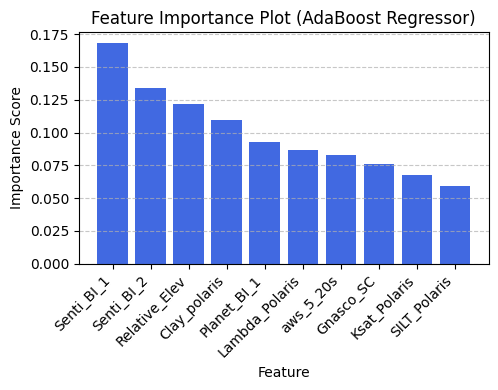

In [ ]:
# Plot
plt.figure(figsize=(5, 4))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color='royalblue')
plt.ylabel("Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (AdaBoost Regressor)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

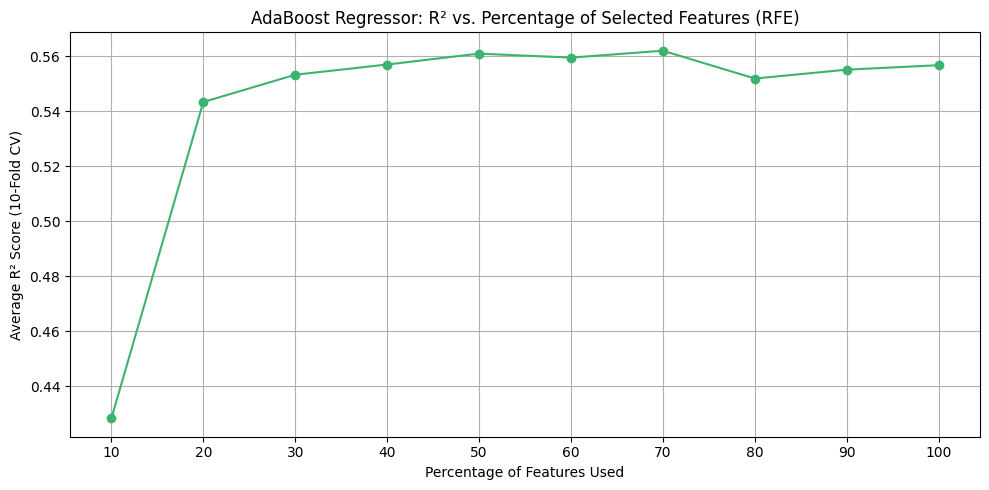

In [ ]:
r2_scores_vs_features = []

# Loop over feature percentages
for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # RFE using AdaBoost with Decision Tree base
    rfe = RFE(estimator=AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=4),
        n_estimators=100,
        learning_rate=0.05,
        random_state=42
    ), n_features_to_select=num_feats)

    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        ada.fit(X_train, y_train)
        y_pred = ada.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2 = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2))

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='mediumseagreen')
plt.title("AdaBoost Regressor: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


<ipython-input-29-2787961295>:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


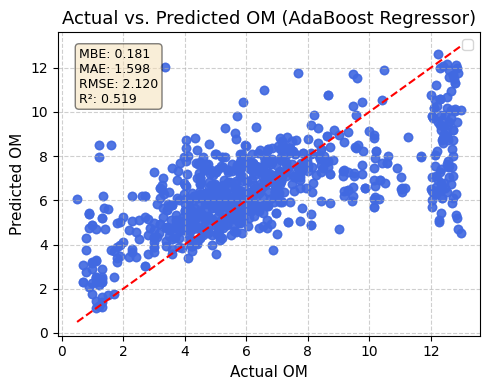

In [ ]:
# Scatter Plot for AdaBoost Regressor
plt.figure(figsize=(5, 4))
plt.scatter(all_y_test, all_y_pred, color="royalblue", alpha=0.7,)
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)],
         color="red", linestyle="--", linewidth=1.5, )

plt.xlabel("Actual OM", fontsize=11)
plt.ylabel("Predicted OM", fontsize=11)
plt.title("Actual vs. Predicted OM (AdaBoost Regressor)", fontsize=13)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()

# Add performance metrics as a text box
textstr = '\n'.join((
    f'MBE: {np.mean(mbe_list):.3f}',
    f'MAE: {np.mean(mae_list):.3f}',
    f'RMSE: {np.mean(rmse_list):.3f}',
    f'R²: {np.mean(r2_list):.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         verticalalignment='top', fontsize=9, bbox=props)

plt.tight_layout()
plt.show()


ADA BOOST TRAIN TEST CV


Best Model Parameters: {'learning_rate': 0.1, 'n_estimators': 200}

Train Set Metrics (10-Fold Cross-Validation):
MBE: 0.0272, MAE: 1.1230, RMSE: 1.5330, R²: 0.5749

Test Set Metrics:
MBE: 0.0572, MAE: 1.0654, RMSE: 1.4876, R²: 0.4988


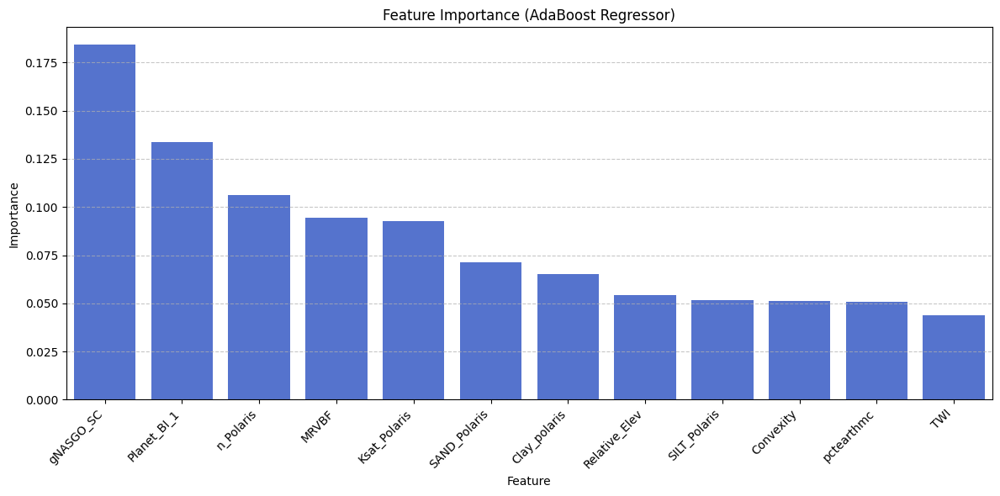

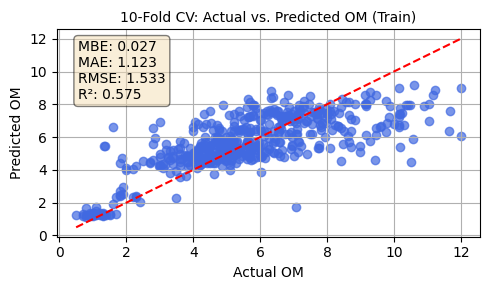

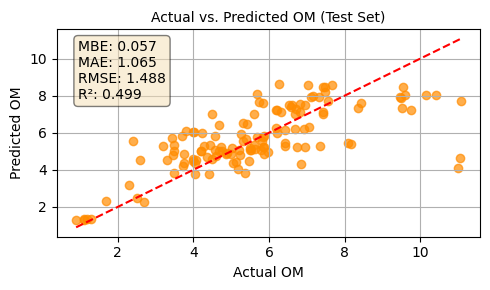

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter OM > 12 and drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE Feature Selection with AdaBoost ===
num_features_to_select = int(0.4 * X.shape[1])
base_tree = DecisionTreeRegressor(max_depth=5)
ada_base = AdaBoostRegressor(estimator=base_tree, random_state=42)
rfe = RFE(estimator=ada_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Grid Search for Best AdaBoost Params ===
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1]
}
grid_search = GridSearchCV(AdaBoostRegressor(estimator=base_tree, random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual = []
train_predicted = []
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)
    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Evaluate on Test Set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Average Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (AdaBoost Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="darkorange", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


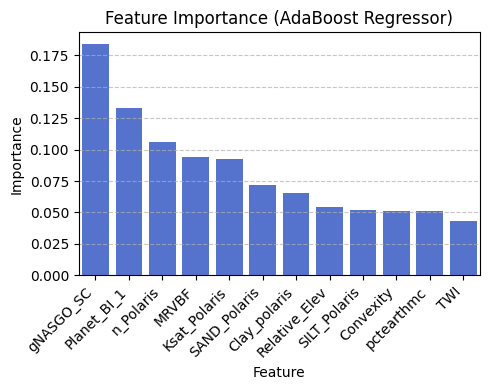

In [ ]:
# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(5, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (AdaBoost Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

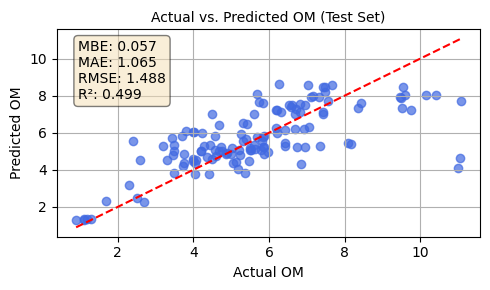

In [ ]:
# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

cat boost

Model: CatBoostRegressor
Setup: {'iterations': 100, 'learning_rate': 0.1, 'depth': 10, 'loss_function': 'RMSE', 'random_seed': 42, 'verbose': 0}
Average Metrics Across 10-Fold CV:
MBE=-0.0189, MAE=1.4170, RMSE=1.9597, R²=0.5879


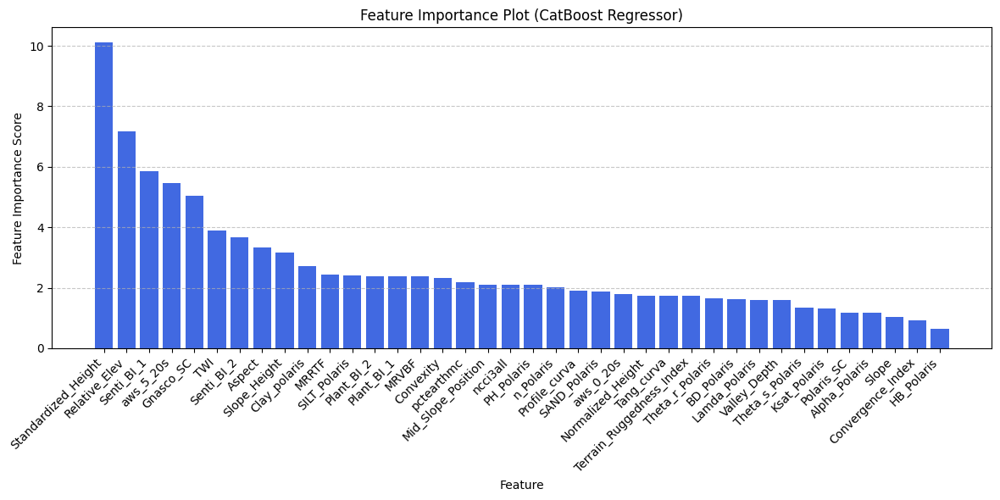

In [ ]:
# Install the catboost library
!pip install catboost

# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long','Sensor_OM', 'rootznaws', 'Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize CatBoost Regressor (silent mode)
catboost_model = CatBoostRegressor(
    iterations=100,
    learning_rate=0.1,
    depth=10,
    random_seed=42,
    verbose=0
)

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train model
    catboost_model.fit(X_train, y_train)

    # Predictions
    y_pred = catboost_model.predict(X_test)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: CatBoostRegressor")
print(f"Setup: {catboost_model.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_catboost = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract and plot feature importances
feature_importances = catboost_model.get_feature_importance()
feature_names = X.columns

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (CatBoost Regressor)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
r2_scores_vs_features = []

# Loop over different percentages of selected features
for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # RFE with CatBoost
    rfe = RFE(estimator=CatBoostRegressor(
        iterations=100,
        learning_rate=0.1,
        depth=10,
        random_seed=42,
        verbose=0
    ), n_features_to_select=num_feats)

    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    # Store fold-wise R² scores
    r2_list_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        catboost_model.fit(X_train, y_train)
        y_pred = catboost_model.predict(X_test)
        r2_list_temp.append(r2_score(y_test, y_pred))

    avg_r2 = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2))

# Create DataFrame for plotting
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='purple')
plt.title("CatBoost Regressor: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


KeyboardInterrupt: 

In [ ]:
# Install the catboost library
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.9 MB/s eta 0:00:00


Selected Top 70% Features (10 out of 34):
['Relative_Elev', 'Senti_BI_1', 'Senti_BI_2', 'Planet_BI_1', 'Gnasco_SC', 'MRVBF', 'TWI', 'SILT_Polaris', 'ncci3all', 'aws_5_20s']

Model: CatBoostRegressor with RFE (70% features)
Average MBE  : -0.0124
Average MAE  : 1.3576
Average RMSE : 1.9594
Average R²   : 0.5899


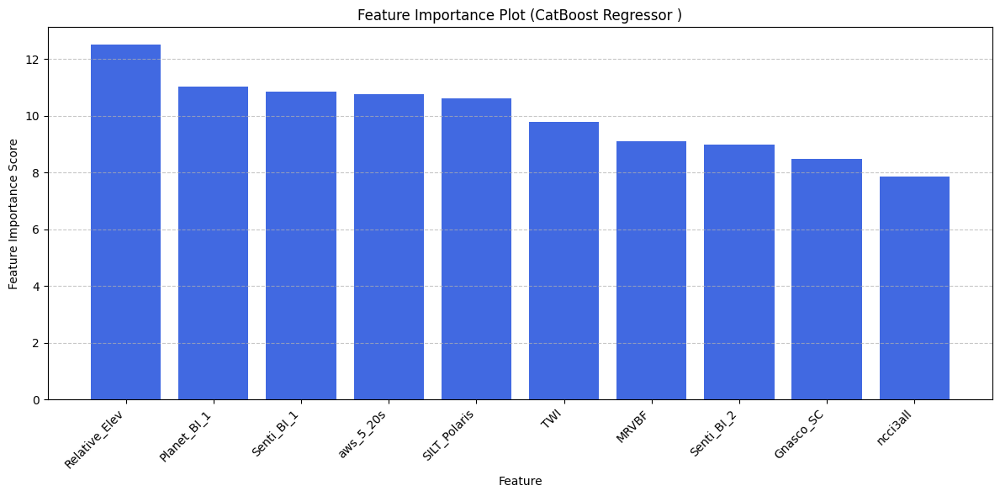

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long','Sensor_OM', 'rootznaws','Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values
X = X.dropna()
y = y[X.index]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize CatBoost Regressor
catboost_model = CatBoostRegressor(
    iterations=100,
    learning_rate=0.1,
    depth=10,
    random_seed=42,
    verbose=0
)

# Perform RFE to select 70% of the features
num_features_to_select = int(0.3 * X.shape[1])
rfe = RFE(estimator=catboost_model, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 70% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce feature set
X_selected = X_scaled[:, rfe.support_]

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Metrics storage
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

# Perform cross-validation
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    catboost_model.fit(X_train, y_train)
    y_pred = catboost_model.predict(X_test)

    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Print average metrics
print(f"\nModel: CatBoostRegressor with RFE (70% features)")
print(f"Average MBE  : {np.mean(mbe_list):.4f}")
print(f"Average MAE  : {np.mean(mae_list):.4f}")
print(f"Average RMSE : {np.mean(rmse_list):.4f}")
print(f"Average R²   : {np.mean(r2_list):.4f}")

# Create DataFrame for last fold
df_catboost_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

# Extract and plot feature importances for selected features
feature_importances = catboost_model.get_feature_importance()
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (CatBoost Regressor )")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


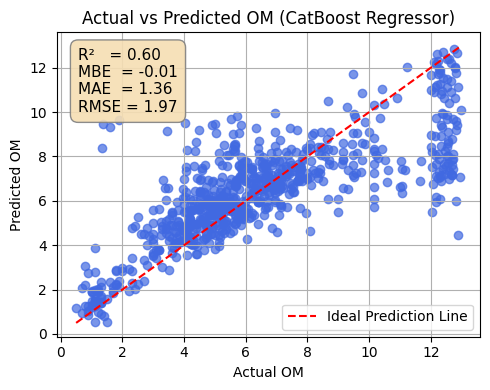

In [ ]:
# Create scatter plot with royal blue points
plt.figure(figsize=(5, 4))
plt.scatter(all_actuals, all_preds, alpha=0.7, color='royalblue')
plt.plot([min(all_actuals), max(all_actuals)],
         [min(all_actuals), max(all_actuals)],
         'r--', label='Ideal Prediction Line')

# Axis labels and title
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs Predicted OM (CatBoost Regressor)")

# Annotation box (wheat color)
metrics_text = (f"R²   = {final_r2:.2f}\n"
                f"MBE  = {final_mbe:.2f}\n"
                f"MAE  = {final_mae:.2f}\n"
                f"RMSE = {final_rmse:.2f}")

# Add text box
props = dict(boxstyle='round,pad=0.5', facecolor='wheat', edgecolor='gray', alpha=0.9)
plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top', bbox=props)

plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



Best Model Parameters: {'depth': 8, 'iterations': 200, 'learning_rate': 0.05}

Train Set Metrics (10-Fold Cross-Validation):
MBE: -0.0465, MAE: 1.0528, RMSE: 1.4691, R²: 0.6096

Test Set Metrics:
MBE: 0.0246, MAE: 0.9758, RMSE: 1.4512, R²: 0.5231


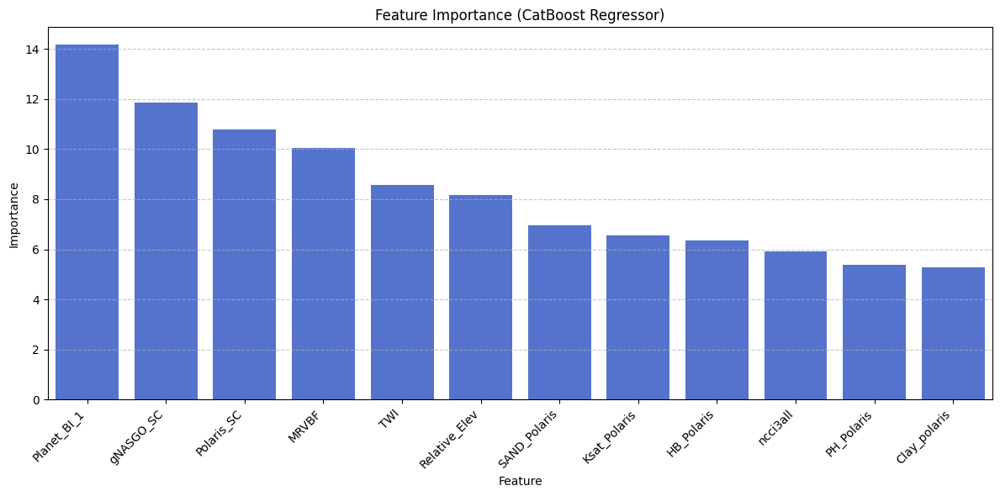

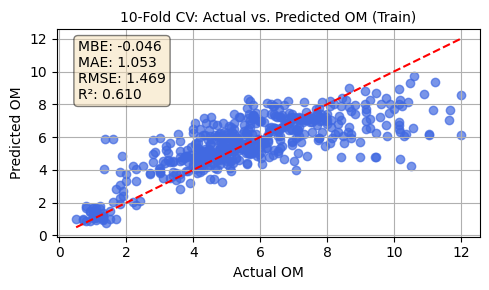

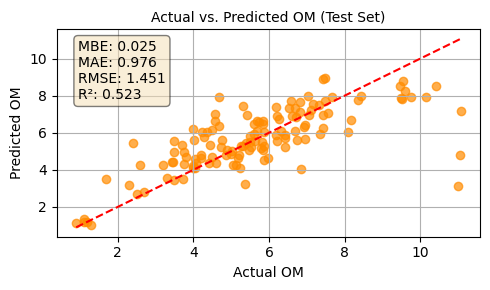

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter OM > 12 and drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE Feature Selection ===
num_features_to_select = int(0.40 * X.shape[1])
cat_base = CatBoostRegressor(verbose=0, random_state=42)
rfe = RFE(estimator=cat_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Grid Search for CatBoost Hyperparameters ===
param_grid = {
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05],
    'iterations': [100, 200]
}
grid_search = GridSearchCV(CatBoostRegressor(verbose=0, random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold Cross Validation on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual = []
train_predicted = []
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t, verbose=0)
    y_val_pred = best_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)
    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Evaluate on Test Set ===
best_model.fit(X_train_selected, y_train_full, verbose=0)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Compute Average Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (CatBoost Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="darkorange", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


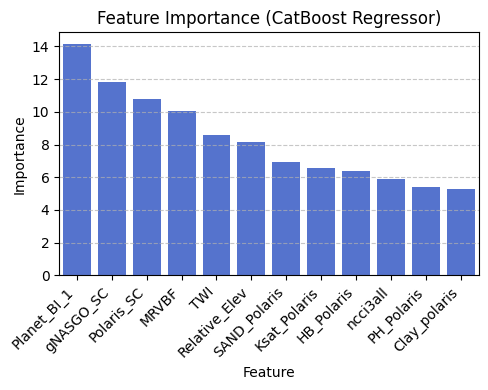

In [ ]:
# === Step 10: Feature Importance Plot ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(5, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (CatBoost Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

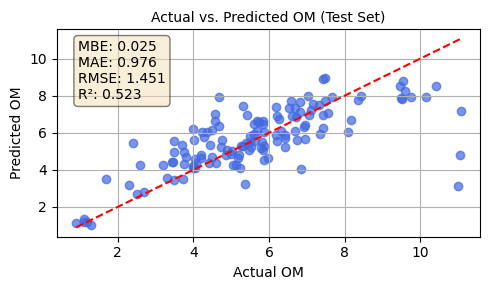

In [ ]:
# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

In [ ]:
from scikeras.wrappers import KerasRegressor


LIGHT GBM

In [ ]:
all_y_test = []
all_y_pred = []
fold_importances = []


In [ ]:
# Store predictions for scatter plot or external use
all_y_test.extend(y_test)
all_y_pred.extend(y_pred)

# Store feature importances from this fold
fold_importances.append(catboost_model.get_feature_importance())


In [ ]:
# Compute average metrics
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

print(f"\nModel: CatBoostRegressor with RFE (70% features)")
print(f"Average MBE  : {avg_mbe:.4f}")
print(f"Average MAE  : {avg_mae:.4f}")
print(f"Average RMSE : {avg_rmse:.4f}")
print(f"Average R²   : {avg_r2:.4f}")

# Average feature importances across folds and normalize
avg_importances = np.mean(fold_importances, axis=0)
normalized_importances = avg_importances / np.sum(avg_importances)

# Create DataFrame for plotting
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': normalized_importances
}).sort_values(by='Importance', ascending=False)



Model: CatBoostRegressor with RFE (70% features)
Average MBE  : -0.0124
Average MAE  : 1.3576
Average RMSE : 1.9594
Average R²   : 0.5899


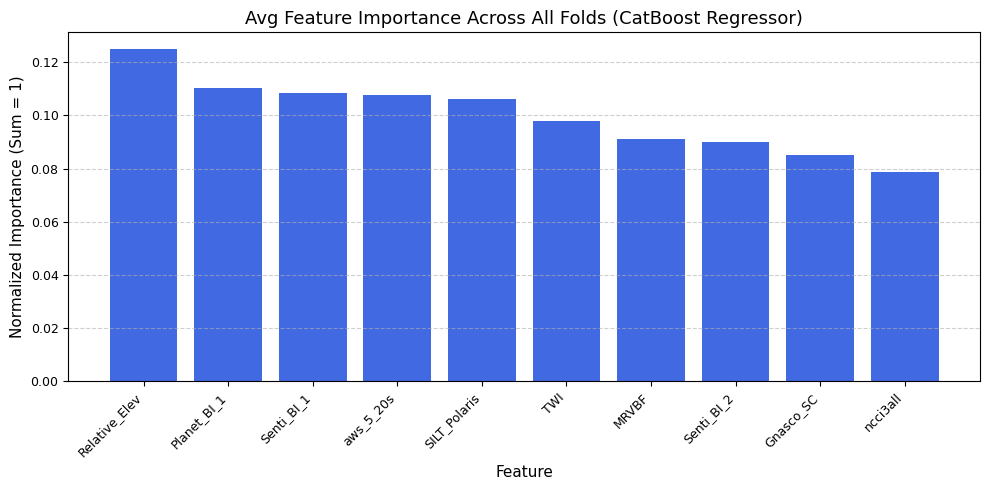

In [ ]:
plt.figure(figsize=(10, 5))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Normalized Importance (Sum = 1)", fontsize=11)
plt.xlabel("Feature", fontsize=11)
plt.title("Avg Feature Importance Across All Folds (CatBoost Regressor)", fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Lgbm train test cv

In [ ]:
pip install lightgbm


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5465
[LightGBM] [Info] Number of data points in the train set: 520, number of used features: 32
[LightGBM] [Info] Start training from score 5.579231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3994
[LightGBM] [Info] Number of data points in the train set: 520, number of used features: 23
[LightGBM] [Info] Start training from score 5.579231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2257
[LightGBM] [Info] Number of data points in the train set: 520, number of used features: 13
[LightGBM] [Info] Start training from score 5.579231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2084
[LightGBM] [Info] Number of data points in the train set: 520, number of used features: 12
[LightGBM] [Info] Start training from score 5.579231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1877
[LightGBM] [Info] Number of data points in the train set: 468, number of used features: 12
[LightGBM] [Info] Start training from score 5.604423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1879
[LightGBM] [Info] Number of data points in the train set: 468, number of used features: 12
[LightGBM] [Info] Start training from score 5.565085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


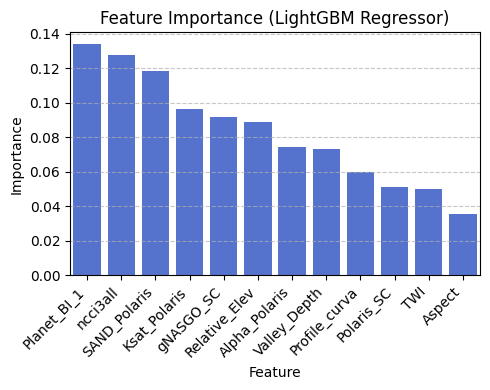

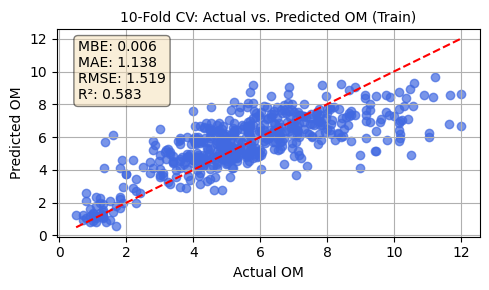

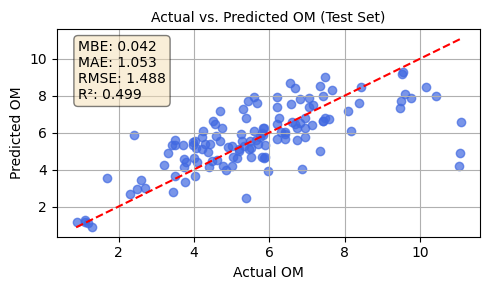

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter OM > 12 and Drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test Split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE Feature Selection ===
num_features_to_select = int(0.4 * X.shape[1])
lgb_base = LGBMRegressor(random_state=42)
rfe = RFE(estimator=lgb_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: GridSearchCV for Best Parameters ===
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.05],
    'max_depth': [3, 5]
}
grid_search = GridSearchCV(LGBMRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold CV on Train Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual = []
train_predicted = []
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)
    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Evaluate on Test Set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Average Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot (Normalized) ===
importances = best_model.feature_importances_
importances_normalized = importances / importances.sum()  # Normalize to sum to 1

feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': importances_normalized
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(5, 4))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (LightGBM Regressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

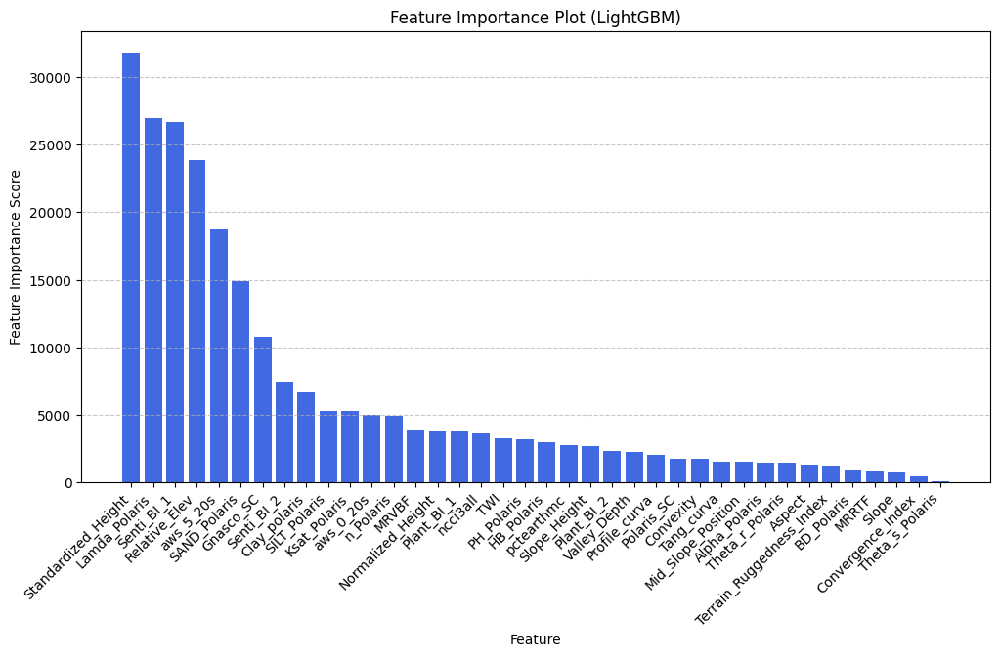

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lightgbm as lgb
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'rootznaws'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features (optional for LightGBM)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define LightGBM parameters
params = {
    'objective': 'regression',  # Regression task
    'metric': 'rmse',  # Root Mean Squared Error
    'boosting_type': 'gbdt',  # Gradient Boosting Decision Tree
    'num_leaves': 31,  # Number of leaves in a tree
    'learning_rate': 0.01,  # Learning rate
    'feature_fraction': 0.9,  # Fraction of features to use for each tree
    'bagging_fraction': 0.8,  # Fraction of data to use for each tree
    'bagging_freq': 5,  # Frequency for bagging
    'verbose': 0,  # Suppress output
    'random_state': 42,  # Random seed for reproducibility
}

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Convert data into LightGBM Dataset format
    train_data = lgb.Dataset(X_train, label=y_train)
    test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

    # Perform LightGBM cross-validation to determine optimal boosting rounds
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000,
        nfold=5,  # Inner 5-fold CV
        stratified=False,
        metrics='rmse',
        seed=42,
        return_cvbooster=True,
        callbacks=[lgb.early_stopping(stopping_rounds=50)],
    )

    # Extract the best number of boosting rounds
    best_num_boost_rounds = len(cv_results['valid rmse-mean'])

    # Train final model on the fold
    model = lgb.train(
        params,
        train_data,
        num_boost_round=best_num_boost_rounds,
        valid_sets=[test_data],
        callbacks=[lgb.early_stopping(stopping_rounds=50)],
    )

    # Predict on test set
    y_pred = model.predict(X_test, num_iteration=model.best_iteration)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: LightGBM")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_lgb = pd.DataFrame({
    'Actual OM': y_test.values,
    'Predicted OM': y_pred
})

# Extract feature importances
feature_importances = model.feature_importance(importance_type='gain')
feature_names = X.columns

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (LightGBM)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

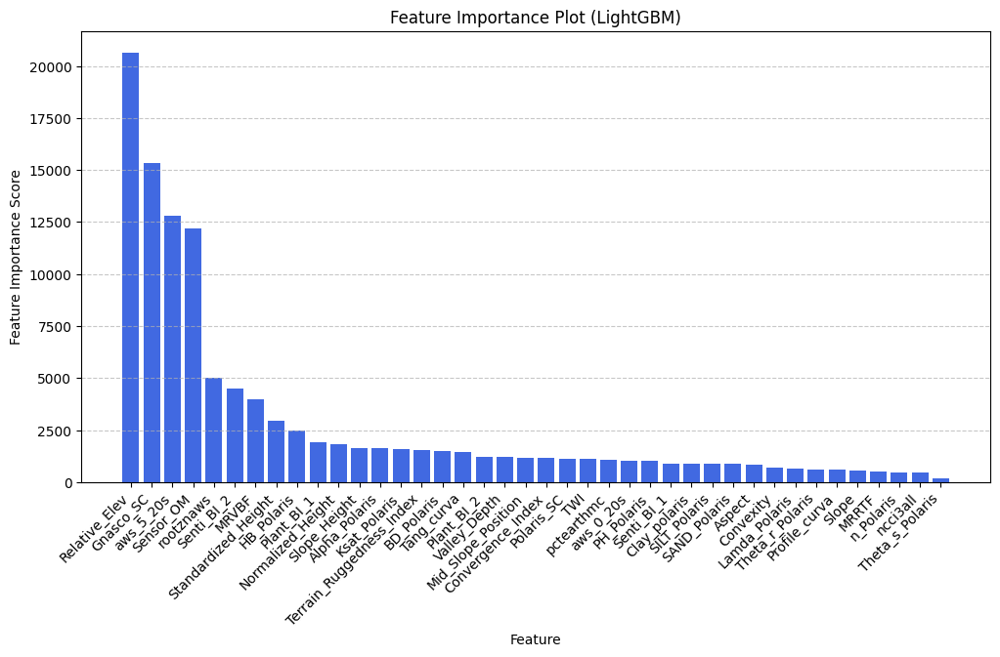

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lightgbm as lgb
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features (optional for LightGBM)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define LightGBM parameters
params = {
    'objective': 'regression',  # Regression task
    'metric': 'rmse',  # Root Mean Squared Error
    'boosting_type': 'gbdt',  # Gradient Boosting Decision Tree
    'num_leaves': 31,  # Number of leaves in a tree
    'learning_rate': 0.01,  # Learning rate
    'feature_fraction': 0.9,  # Fraction of features to use for each tree
    'bagging_fraction': 0.8,  # Fraction of data to use for each tree
    'bagging_freq': 5,  # Frequency for bagging
    'verbose': 0,  # Suppress output
    'random_state': 42,  # Random seed for reproducibility
}

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Convert data into LightGBM Dataset format
    train_data = lgb.Dataset(X_train, label=y_train)
    test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

    # Perform LightGBM cross-validation to determine optimal boosting rounds
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000,
        nfold=5,  # Inner 5-fold CV
        stratified=False,
        metrics='rmse',
        seed=42,
        return_cvbooster=True,
        callbacks=[lgb.early_stopping(stopping_rounds=50)],
    )

    # Extract the best number of boosting rounds
    best_num_boost_rounds = len(cv_results['valid rmse-mean'])

    # Train final model on the fold
    model = lgb.train(
        params,
        train_data,
        num_boost_round=best_num_boost_rounds,
        valid_sets=[test_data],
        callbacks=[lgb.early_stopping(stopping_rounds=50)],
    )

    # Predict on test set
    y_pred = model.predict(X_test, num_iteration=model.best_iteration)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: LightGBM")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_lgb = pd.DataFrame({
    'Actual OM': y_test.values,
    'Predicted OM': y_pred
})

# Extract feature importances
feature_importances = model.feature_importance(importance_type='gain')
feature_names = X.columns

# Create DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance_df['Feature'], feature_importance_df['Importance'], color="royalblue")
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance Plot (LightGBM)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

RFE LIGHT GBM

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lightgbm as lgb
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.feature_selection import RFE
from lightgbm import LGBMRegressor

# Feature and target
X = df_m.drop(columns=['OM', 'SAMPLEDATE', 'Elevation', 'lati', 'long', 'Sensor_OM'])
y = df_m['OM']
X = X.dropna()
y = y[X.index]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# LightGBM base model for RFE
base_estimator = LGBMRegressor(
    objective='regression',
    learning_rate=0.01,
    num_leaves=31,
    feature_fraction=0.9,
    bagging_fraction=0.8,
    bagging_freq=5,
    verbose=-1,
    random_state=42
)

# RFE to select ~90% features
rfe = RFE(estimator=base_estimator, n_features_to_select=int(0.7 * X.shape[1]), step=1)
rfe = rfe.fit(X_scaled, y)
selected_features = X.columns[rfe.support_]
print(f"Selected Features via RFE ({len(selected_features)} features):")
print(selected_features.tolist())

# Reduce feature set
X_selected = X[selected_features]
X_selected_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_selected_scaled, y, test_size=0.2, random_state=42)

# LightGBM parameters
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.01,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1,
    'random_state': 42
}

# K-Fold CV on training set
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train):
    X_tr, X_val = X_train[train_idx], X_train[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    train_data = lgb.Dataset(X_tr, label=y_tr)
    val_data = lgb.Dataset(X_val, label=y_val)

    cv_model = lgb.train(
        params,
        train_data,
        num_boost_round=1000,
        valid_sets=[val_data],
        callbacks=[lgb.early_stopping(stopping_rounds=50)],

    )

    y_val_pred = cv_model.predict(X_val, num_iteration=cv_model.best_iteration)
    mbe_list.append(np.mean(y_val_pred - y_val))
    mae_list.append(mean_absolute_error(y_val, y_val_pred))
    rmse_list.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    r2_list.append(r2_score(y_val, y_val_pred))

print("\nCross-Validation Metrics on Training Set (10-fold):")
print(f"Avg MBE:  {np.mean(mbe_list):.4f}")
print(f"Avg MAE:  {np.mean(mae_list):.4f}")
print(f"Avg RMSE: {np.mean(rmse_list):.4f}")
print(f"Avg R²:   {np.mean(r2_list):.4f}")

# Retrain on full training set
final_train_data = lgb.Dataset(X_train, label=y_train)
final_model = lgb.train(
    params,
    final_train_data,
    num_boost_round=cv_model.best_iteration
)

# Predict on unseen test set
y_test_pred = final_model.predict(X_test, num_iteration=final_model.best_iteration)
print("\nFinal Model Performance on Test Set:")
print(f"MBE:  {np.mean(y_test_pred - y_test):.4f}")
print(f"MAE:  {mean_absolute_error(y_test, y_test_pred):.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred)):.4f}")
print(f"R²:   {r2_score(y_test, y_test_pred):.4f}")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

Selected Features via RFE (27 features):
['Relative_Elev', 'Aspect', 'Senti_BI_1', 'Senti_BI_2', 'Plant_BI_1', 'Plant_BI_2', 'Polaris_SC', 'Gnasco_SC', 'MRVBF', 'TWI', 'Clay_polaris', 'SAND_Polaris', 'PH_Polaris', 'rootznaws', 'pctearthmc', 'ncci3all', 'aws_5_20s', 'aws_0_20s', 'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'MRRTF', 'Valley_Depth', 'Slope_Height', 'Convexity', 'Standardized_Height', 'Normalized_Height']
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[400]	valid_0's rmse: 1.79204
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[669]	valid_0's rmse: 1.5675
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[265]	valid_0's rmse: 2.32262
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[555]	valid_0's rmse: 2.24592
Training until validation scores don't improve for 50 rounds
Early stoppi

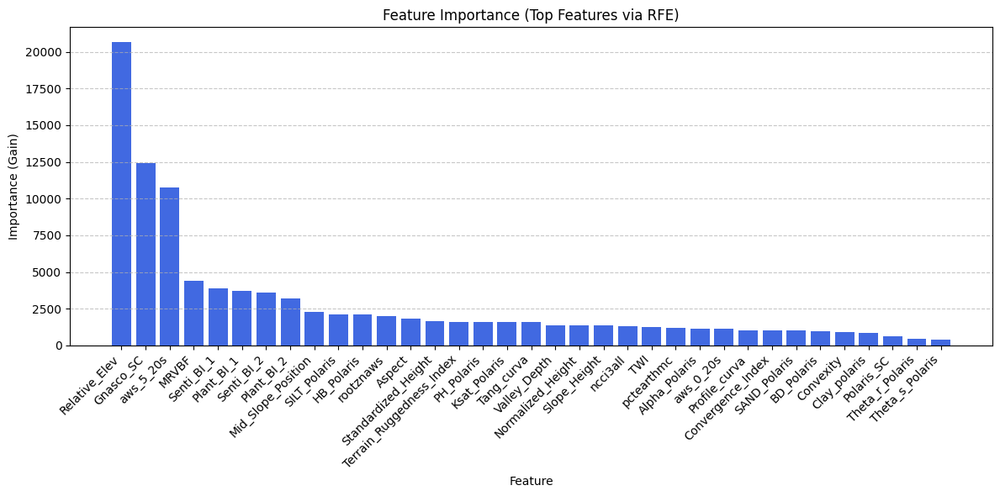

In [ ]:
# Get feature importance from the final model
importances = final_model.feature_importance(importance_type='gain')
features = selected_features  # These are the RFE-selected feature names

# Create a DataFrame for plotting
feat_imp_df = pd.DataFrame({'Feature': features, 'Importance': importances})
feat_imp_df = feat_imp_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(feat_imp_df['Feature'], feat_imp_df['Importance'], color='royalblue')
plt.xlabel("Feature")
plt.ylabel("Importance (Gain)")
plt.title("Feature Importance (Top Features via RFE)")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Bayer


Best Model Parameters: {'alpha_1': 1e-06, 'alpha_2': 1e-05, 'lambda_1': 1e-05, 'lambda_2': 1e-06}

Train Set Metrics (10-Fold Cross-Validation):
MBE: 0.0029, MAE: 1.1720, RMSE: 1.5798, R²: 0.5308

Test Set Metrics:
MBE: 0.0923, MAE: 1.1866, RMSE: 1.6259, R²: 0.4852


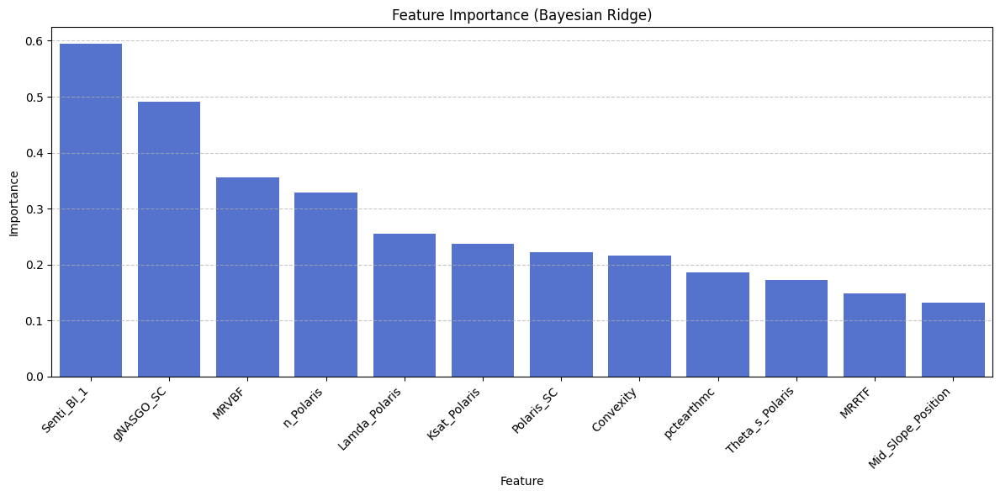

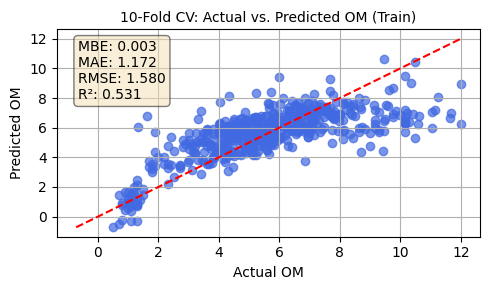

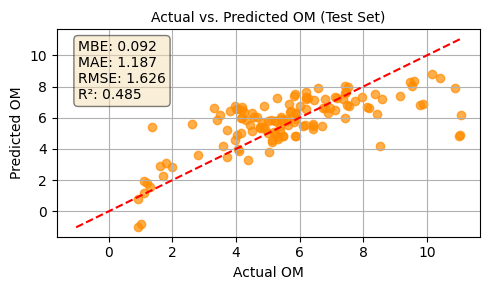

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# === Step 1: Filter OM > 12 and drop NaNs ===
df_filtered = df_m[df_m['OM'] <= 12]
X = df_filtered.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_filtered['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Standardization ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE Feature Selection ===
num_features_to_select = int(0.4 * X.shape[1])
br_base = BayesianRidge()
rfe = RFE(estimator=br_base, n_features_to_select=num_features_to_select)
rfe.fit(X_train_scaled, y_train_full)

selected_features = X_train_full.columns[rfe.support_]
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

# === Step 5: Grid Search for Bayesian Ridge ===
param_grid = {
    'alpha_1': [1e-6, 1e-5],
    'alpha_2': [1e-6, 1e-5],
    'lambda_1': [1e-6, 1e-5],
    'lambda_2': [1e-6, 1e-5]
}
grid_search = GridSearchCV(BayesianRidge(), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_selected, y_train_full)
best_model = grid_search.best_estimator_

# === Step 6: 10-Fold CV on Training Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual = []
train_predicted = []
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    best_model.fit(X_t, y_t)
    y_val_pred = best_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)
    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Evaluate on Test Set ===
best_model.fit(X_train_selected, y_train_full)
y_test_pred = best_model.predict(X_test_selected)

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 8: Average Train Metrics ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

train_mbe = np.mean(train_predicted_np - train_actual_np)
train_mae = mean_absolute_error(train_actual_np, train_predicted_np)
train_rmse = np.sqrt(mean_squared_error(train_actual_np, train_predicted_np))
train_r2 = r2_score(train_actual_np, train_predicted_np)

# === Step 9: Print Results ===
print("\nBest Model Parameters:", grid_search.best_params_)
print("\nTrain Set Metrics (10-Fold Cross-Validation):")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")
print("\nTest Set Metrics:")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")

# === Step 10: Feature Importance Plot (using model coefficients) ===
feature_importance_df = pd.DataFrame({
    'Feature': selected_features,
    'Importance': np.abs(best_model.coef_)
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df, color='royalblue')
plt.title("Feature Importance (Bayesian Ridge)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# === Step 11: Scatter Plot for Training Set ===
min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(train_actual_np, train_predicted_np, color="royalblue", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("10-Fold CV: Actual vs. Predicted OM (Train)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()

# === Step 12: Scatter Plot for Test Set ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 3))
plt.scatter(test_actual_np, test_predicted_np, color="darkorange", alpha=0.7)
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (Test Set)", fontsize=10)
plt.grid(True)
textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)
plt.tight_layout()
plt.show()


RFE multilayer percepton

Training temporary MLP for feature importance...
Temporary MLP trained.
Computing permutation importance...


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Permutation importance computed.

Selected Top 30% Features (10 out of 34):
['Senti_BI_1', 'Theta_r_Polaris', 'SILT_Polaris', 'Planet_BI_2', 'n_Polaris', 'BD_Polaris', 'Relative_Elev', 'Lambda_Polaris', 'ncci3all', 'PH_Polaris']

Performing 10-Fold Cross-Validation on selected features...
Processing Fold 1/10


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Processing Fold 2/10
Processing Fold 3/10


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Processing Fold 4/10
Processing Fold 5/10
Processing Fold 6/10
Processing Fold 7/10
Processing Fold 8/10
Processing Fold 9/10
Processing Fold 10/10

Model: MLPRegressor (with 10 features)
Average Metrics Across 10-Fold CV:
MBE=0.0568, MAE=1.6661, RMSE=2.3335, R²=0.4278


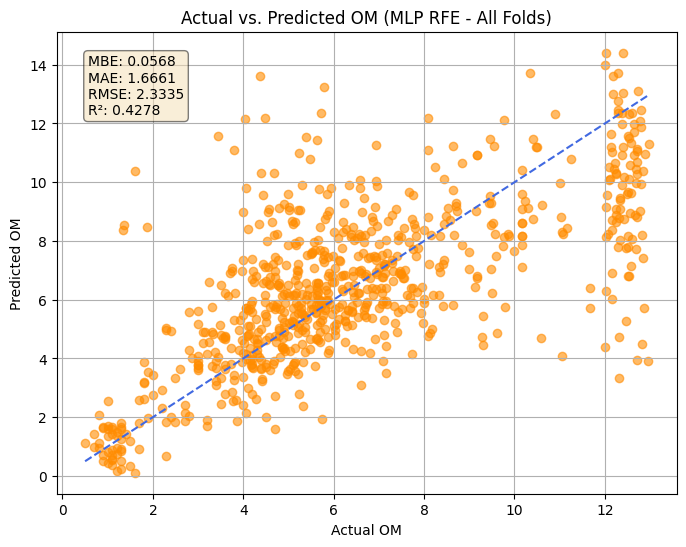

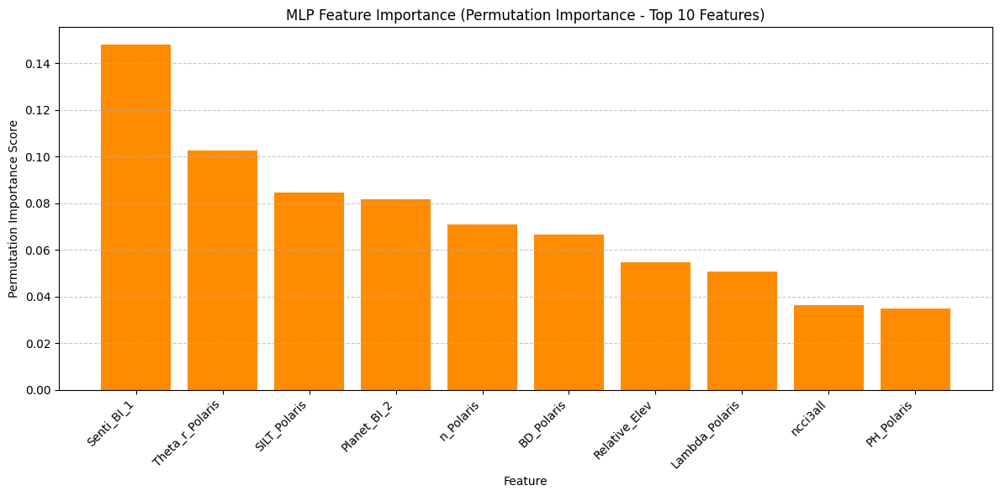

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.inspection import permutation_importance # Import permutation_importance

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long', 'Sensor_OM','rootznaws','Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height'])
y = df_m['OM']

# Remove rows with NaN values
df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM','rootznaws', 'Standardized_Height','aws_0_20s',
                       'Valley_Depth','Normalized_Height'])
y = df_cleaned['OM']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data for initial feature importance calculation
# We use a split here because permutation importance is typically run on held-out data
X_train_imp, X_test_imp, y_train_imp, y_test_imp = train_test_split(
    X_scaled, y, test_size=0.3, random_state=42
)

# Initialize a temporary MLP Regressor for feature importance calculation
# Use a small number of iterations for speed, as this is just for ranking features
temp_mlp = MLPRegressor(hidden_layer_sizes=(100,), # Simplified for speed
                        activation='relu',
                        solver='adam',
                        max_iter=200, # Reduced iterations
                        random_state=42)

# Train the temporary model
print("Training temporary MLP for feature importance...")
temp_mlp.fit(X_train_imp, y_train_imp)
print("Temporary MLP trained.")

# Compute permutation importance
print("Computing permutation importance...")
perm_importance = permutation_importance(
    temp_mlp, X_test_imp, y_test_imp, scoring='r2', n_repeats=10, random_state=42, n_jobs=-1
)
print("Permutation importance computed.")

# Extract importance scores and feature names
feature_importance = perm_importance.importances_mean
feature_names = X.columns

# Sort features by importance
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Select top features based on importance (e.g., top 40%)
num_features_to_select = int(0.30 * X.shape[1])
selected_features = feature_importance_df['Feature'].iloc[:num_features_to_select].tolist()

print(f"\nSelected Top {int(0.30*100)}% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features)

# Now, apply the feature selection to the full scaled dataset
X_selected_scaled = X_scaled[:, X.columns.isin(selected_features)]

# Initialize the final MLP Regressor for cross-validation and testing
# Use the full max_iter here
mlp = MLPRegressor(hidden_layer_sizes=(100, 50),
                   activation='relu',
                   solver='adam',
                   max_iter=1000,
                   random_state=42)

# Initialize K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Store metrics
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []
all_y_test, all_y_pred = [], []

print("\nPerforming 10-Fold Cross-Validation on selected features...")
# Cross-validation on the selected features
for fold, (train_index, test_index) in enumerate(kf.split(X_selected_scaled)):
    print(f"Processing Fold {fold+1}/10")
    X_train, X_test = X_selected_scaled[train_index], X_selected_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Initialize a new model instance for each fold to ensure independence
    fold_mlp = MLPRegressor(hidden_layer_sizes=(100, 50),
                            activation='relu',
                            solver='adam',
                            max_iter=1000,
                            random_state=42)

    fold_mlp.fit(X_train, y_train)
    y_pred = fold_mlp.predict(X_test)

    all_y_test.extend(y_test)
    all_y_pred.extend(y_pred)

    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Average metrics
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.sqrt(np.mean(np.array(rmse_list)**2)) # Correct way to average RMSE
avg_r2 = np.mean(r2_list)

# Print performance
print(f"\nModel: MLPRegressor (with {len(selected_features)} features)")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Prediction DataFrame from the last fold (for reference, better to plot all_y_test vs all_y_pred)
df_mlp_rfe = pd.DataFrame({
    'Actual OM (Last Fold)': y_test.values,
    'Predicted OM (Last Fold)': y_pred
})

# Plot Actual vs. Predicted for ALL folds
plt.figure(figsize=(8, 6))
plt.scatter(all_y_test, all_y_pred, color="darkorange", alpha=0.6)
plt.plot([min(all_y_test), max(all_y_test)], [min(all_y_test), max(all_y_test)], color="royalblue", linestyle="--")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Actual vs. Predicted OM (MLP RFE - All Folds)")
plt.grid(True)

# Add metrics text
textstr = '\n'.join((
    f'MBE: {avg_mbe:.4f}',
    f'MAE: {avg_mae:.4f}',
    f'RMSE: {avg_rmse:.4f}',
    f'R²: {avg_r2:.4f}'
))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=props)

plt.show()

# Plot Feature Importance (using permutation importance results)
plt.figure(figsize=(12, 6))
# Use the dataframe created from permutation importance earlier
plt.bar(feature_importance_df['Feature'][:num_features_to_select],
        feature_importance_df['Importance'][:num_features_to_select],
        color='darkorange')
plt.ylabel('Permutation Importance Score')
plt.xlabel('Feature')
plt.title(f'MLP Feature Importance (Permutation Importance - Top {num_features_to_select} Features)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor # Import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Use the existing X_scaled and y from previous cells
# Assuming X_scaled and y are already loaded and preprocessed as in previous cells

# Initialize MLP model for evaluation
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), activation='relu',
                   solver='adam', max_iter=1000, random_state=42)

# Initialize KFold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

r2_scores_vs_features = []

# Initialize a compatible estimator for RFE to use for feature ranking
# RandomForestRegressor has feature_importances_
rfe_estimator = RandomForestRegressor(n_estimators=100, random_state=42)

# Loop over different percentages of features
for pct in range(10, 101, 10):
    num_feats = int(pct / 100 * X_scaled.shape[1]) # Use X_scaled shape for number of features

    # Initialize RFE with the compatible estimator
    rfe = RFE(estimator=rfe_estimator, n_features_to_select=num_feats)

    # Fit RFE using the compatible estimator to select features
    # The compatible estimator will be trained internally by RFE
    rfe.fit(X_scaled, y)

    # Select features from the original scaled data using the RFE results
    X_rfe = X_scaled[:, rfe.support_]

    r2_list_temp = []

    # Perform cross-validation using the MLPRegressor on the selected features
    for train_index, test_index in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_index], X_rfe[test_index]
        # Ensure y aligns with the splits of X_rfe which are based on the indices of X_scaled
        # y needs to be indexed correctly using .iloc
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train the MLPRegressor on the subset of features
        # Re-initialize MLP for each fold to avoid leakage if statefulness were an issue
        fold_mlp = MLPRegressor(hidden_layer_sizes=(100, 50), activation='relu',
                                solver='adam', max_iter=1000, random_state=42)
        fold_mlp.fit(X_train, y_train)
        y_pred = fold_mlp.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        r2_list_temp.append(r2)

    avg_r2_temp = np.mean(r2_list_temp)
    r2_scores_vs_features.append((pct, avg_r2_temp))

# Create DataFrame for plotting
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='purple')
plt.title("MLP Regressor (Features Selected by RF-RFE): R² vs. Percentage of Features")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.xticks(range(10, 110, 10))
plt.grid(True)
plt.tight_layout()
plt.show()

Stackinig Regressor

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM','rootznaws', 'Standardized_Height', 'Normalized_Height' ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Base Models for Stacking
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
knn = KNeighborsRegressor(n_neighbors=5)
xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
lgbm = LGBMRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)  # Added GBR

# Define Stacking Regressor
stacking_model = StackingRegressor(
    estimators=[
        ('rf', rf),
        ('knn', knn),
        ('xgb', xgb),
        ('lgbm', lgbm),
        ('gbr', gbr)  # Added GBR to the stacking model
    ],
    final_estimator=RandomForestRegressor(n_estimators=50, max_depth=5, random_state=42),
    cv=5
)

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train the Stacking Model
    stacking_model.fit(X_train, y_train)

    # Predictions
    y_pred = stacking_model.predict(X_test)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: StackingRegressor")
print(f"Setup: {stacking_model.get_params()}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_sr = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8150
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 36
[LightGBM] [Info] Start training from score 6.434454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6487
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 36
[LightGBM] [Info] Start training from score 5.935428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8141
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 36
[LightGBM] [Info] Start training from score 6.378661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6484
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 36
[LightGBM] [Info] Start training from score 5.839053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6529
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 6.755509
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8145
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 36
[LightGBM] [Info] Start training from score 6.309418
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6491
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 36
[LightGBM] [Info] Start training from score 5.792623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8143
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 36
[LightGBM] [Info] Start training from score 6.389214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6490
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 36
[LightGBM] [Info] Start training from score 5.863643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8164
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 36
[LightGBM] [Info] Start training from score 6.413488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6502
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 5.911055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8163
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 36
[LightGBM] [Info] Start training from score 6.457980
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6499
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 5.957236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6527
[LightGBM] [Info] Number of data points in the train set: 551, number of used features: 36
[LightGBM] [Info] Start training from score 6.809274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8157
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 36
[LightGBM] [Info] Start training from score 6.406759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6502
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 5.873364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6536
[LightGBM] [Info] Number of data points in the train set: 551, number of used features: 36
[LightGBM] [Info] Start training from score 6.742105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8152
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 36
[LightGBM] [Info] Start training from score 6.461366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6499
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 5.940000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8162
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 36
[LightGBM] [Info] Start training from score 6.397951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6513
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 5.879200
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8157
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 36
[LightGBM] [Info] Start training from score 6.392180
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6509
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 36
[LightGBM] [Info] Start training from score 5.888782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model: StackingRegressor
Setup: {'cv': 5, 'estimators': [('rf', RandomForestRegressor(max_depth=10, random_state=42)), ('knn', KNeighborsRegressor()), ('xgb', XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)), ('lgbm', LGBMRegressor(max_depth=5, random_state=42)), ('gbr', GradientBoostingRegressor(max_depth=

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


latest stacking

In [ ]:
pip install catboost lightgbm xgboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.1 MB/s eta 0:00:00


staking Regressor

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from catboost import CatBoostRegressor

# === Step 1: Clean Data ===
df_m = df_m[df_m['OM'] <= 12]
X = df_m.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_m['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Scaling ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Define and Tune Base Learners ===
param_grid_rf = {'n_estimators': [100], 'max_depth': [None, 10]}
param_grid_et = {'n_estimators': [100], 'max_depth': [None, 10]}
param_grid_gbr = {'n_estimators': [100], 'learning_rate': [0.1], 'max_depth': [3]}
param_grid_cat = {'learning_rate': [0.1], 'depth': [4], 'iterations': [100]}

rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=5, n_jobs=-1)
et = GridSearchCV(ExtraTreesRegressor(random_state=42), param_grid_et, cv=5, n_jobs=-1)
gbr = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gbr, cv=5, n_jobs=-1)
cat = GridSearchCV(CatBoostRegressor(verbose=0, random_state=42), param_grid_cat, cv=5, n_jobs=-1)

# === Meta-Learner ===
meta_learner = ElasticNet(alpha=0.1, l1_ratio=0.5)

# === Step 5: Build Stacking Regressor ===
stacking_model = StackingRegressor(
    estimators=[('rf', rf), ('et', et), ('gbr', gbr), ('cat', cat)],
    final_estimator=meta_learner,
    passthrough=True,
    n_jobs=-1
)

# === Step 6: 10-Fold Cross-Validation on Train Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}
train_actual = []
train_predicted = []

for train_idx, val_idx in kf.split(X_train_scaled):
    X_t, X_v = X_train_scaled[train_idx], X_train_scaled[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    stacking_model.fit(X_t, y_t)
    y_val_pred = stacking_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 7: Fit Final Model & Test ===
stacking_model.fit(X_train_scaled, y_train_full)
y_test_pred = stacking_model.predict(X_test_scaled)

# === Step 8: Compute Metrics ===
train_mbe = np.mean(train_metrics['mbe'])
train_mae = np.mean(train_metrics['mae'])
train_rmse = np.mean(train_metrics['rmse'])
train_r2 = np.mean(train_metrics['r2'])

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 9: Display Results ===
print("\n--- Train Set (10-Fold CV) ---")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")

print("\n--- Test Set ---")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")



--- Train Set (10-Fold CV) ---
MBE: 0.0042, MAE: 1.0588, RMSE: 1.4607, R²: 0.5873

--- Test Set ---
MBE: 0.1225, MAE: 0.9627, RMSE: 1.3785, R²: 0.6300


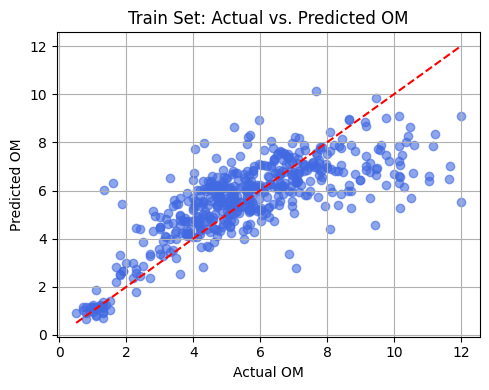

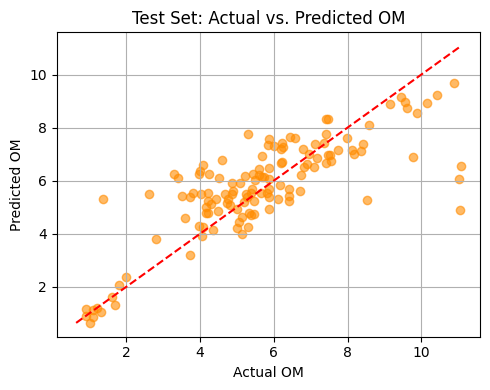

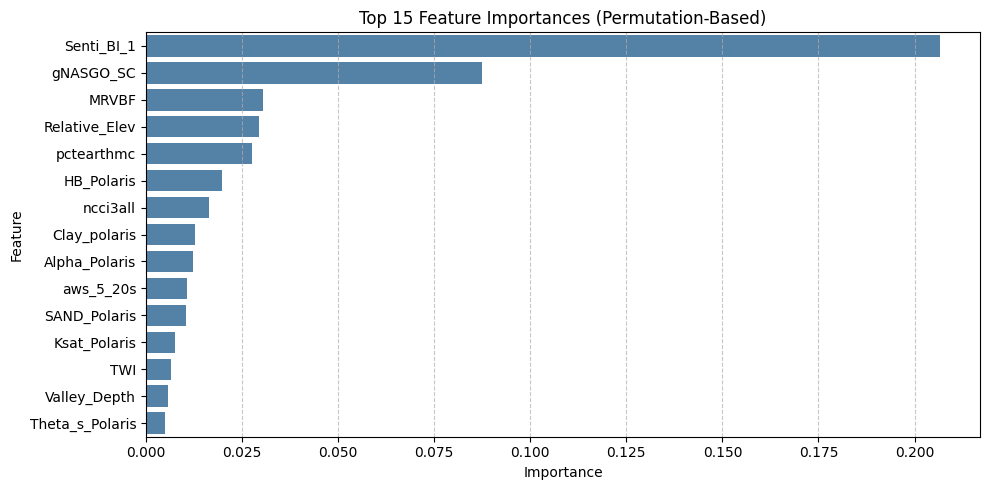

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

# === Step 10: Train Scatter Plot ===
train_actual_np = np.array(train_actual)
train_predicted_np = np.array(train_predicted)

min_val = min(train_actual_np.min(), train_predicted_np.min())
max_val = max(train_actual_np.max(), train_predicted_np.max())

plt.figure(figsize=(5, 4))
plt.scatter(train_actual_np, train_predicted_np, alpha=0.6, color='royalblue')
plt.plot([min_val, max_val], [min_val, max_val], 'r--')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Train Set: Actual vs. Predicted OM")
plt.grid(True)
plt.tight_layout()
plt.show()

# === Step 11: Test Scatter Plot ===
test_actual_np = np.array(y_test)
test_predicted_np = np.array(y_test_pred)

min_val = min(test_actual_np.min(), test_predicted_np.min())
max_val = max(test_actual_np.max(), test_predicted_np.max())

plt.figure(figsize=(5, 4))
plt.scatter(test_actual_np, test_predicted_np, alpha=0.6, color='darkorange')
plt.plot([min_val, max_val], [min_val, max_val], 'r--')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("Test Set: Actual vs. Predicted OM")
plt.grid(True)
plt.tight_layout()
plt.show()

# === Step 12: Feature Importance via Permutation ===
result = permutation_importance(stacking_model, X_test_scaled, y_test, n_repeats=10, random_state=42, n_jobs=-1)

importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': result.importances_mean
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(data=importances_df.head(15), x='Importance', y='Feature', color='steelblue')
plt.title("Top 15 Feature Importances (Permutation-Based)")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Stacking with 40%

In [22]:
!pip install catboost lightgbm xgboost


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.feature_selection import RFE
from catboost import CatBoostRegressor

# === Step 1: Clean Data ===
df_m = df_m[df_m['OM'] <= 12]
X = df_m.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Planet_BI_1', 'Planet_BI_2'])
y = df_m['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Scaling ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE to select 40% of features ===
num_features = int(0.4 * X.shape[1])
rfe_estimator = GradientBoostingRegressor(random_state=42)
rfe = RFE(estimator=rfe_estimator, n_features_to_select=num_features)
rfe.fit(X_train_scaled, y_train_full)

X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]
selected_feature_names = X.columns[rfe.support_]

# === Step 5: Define and Tune Base Learners ===
param_grid_rf = {'n_estimators': [100], 'max_depth': [None, 10]}
param_grid_et = {'n_estimators': [100], 'max_depth': [None, 10]}
param_grid_gbr = {'n_estimators': [100], 'learning_rate': [0.1], 'max_depth': [3]}
param_grid_cat = {'learning_rate': [0.1], 'depth': [4], 'iterations': [100]}

rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=5, n_jobs=-1)
et = GridSearchCV(ExtraTreesRegressor(random_state=42), param_grid_et, cv=5, n_jobs=-1)
gbr = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gbr, cv=5, n_jobs=-1)
cat = GridSearchCV(CatBoostRegressor(verbose=0, random_state=42), param_grid_cat, cv=5, n_jobs=-1)


from sklearn.linear_model import ElasticNetCV

meta_learner = ElasticNetCV(
    alphas=np.logspace(-2, 2, 8),   # 8 values from 0.01 to 100
    l1_ratio=[0.1, 0.5, 0.9],       # Try different L1/L2 balances
    cv=5,
    n_jobs=-1,
    max_iter=10000
)

# === Meta Learner ===
#meta_learner = ElasticNet(alpha=0.1, l1_ratio=0.5)

# === Step 6: Build Stacking Model ===
stacking_model = StackingRegressor(
    estimators=[('rf', rf), ('et', et), ('gbr', gbr), ('cat', cat)],
    final_estimator=meta_learner,
    passthrough=True,
    n_jobs=-1
)

# === Step 7: 10-Fold CV on Train Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual, train_predicted = [], []
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    stacking_model.fit(X_t, y_t)
    y_val_pred = stacking_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 8: Final Fit & Test ===
stacking_model.fit(X_train_selected, y_train_full)
y_test_pred = stacking_model.predict(X_test_selected)

# === Step 9: Compute Metrics ===
train_mbe = np.mean(train_metrics['mbe'])
train_mae = np.mean(train_metrics['mae'])
train_rmse = np.mean(train_metrics['rmse'])
train_r2 = np.mean(train_metrics['r2'])

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 10: Display Results ===
print("\n--- Train Set (10-Fold CV, 40% Features) ---")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")

print("\n--- Test Set ---")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")



--- Train Set (10-Fold CV, 40% Features) ---
MBE: 0.0069, MAE: 1.0465, RMSE: 1.4358, R²: 0.6006

--- Test Set ---
MBE: 0.0878, MAE: 0.9400, RMSE: 1.3358, R²: 0.6525


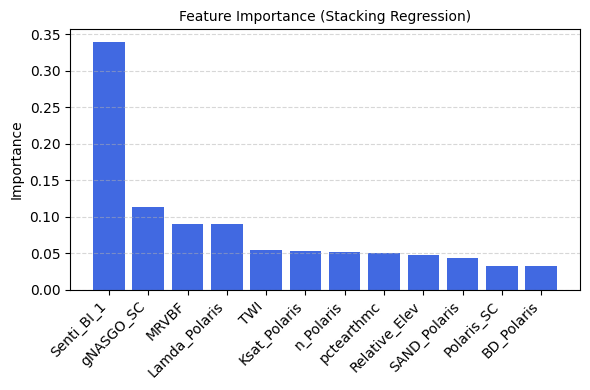

In [26]:
# === Step 13: Feature Importance Plot from GBR ===
best_gbr = stacking_model.named_estimators_['gbr'].best_estimator_
feature_importance = best_gbr.feature_importances_

importance_df = pd.DataFrame({
    'Feature': selected_feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(6, 4))
bars = plt.bar(importance_df['Feature'], importance_df['Importance'], color='royalblue')
plt.title("Feature Importance (Stacking Regression)", fontsize=10)
plt.ylabel("Importance")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


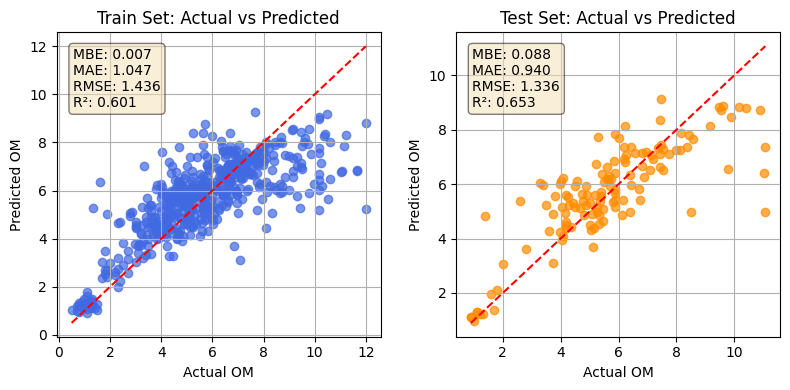

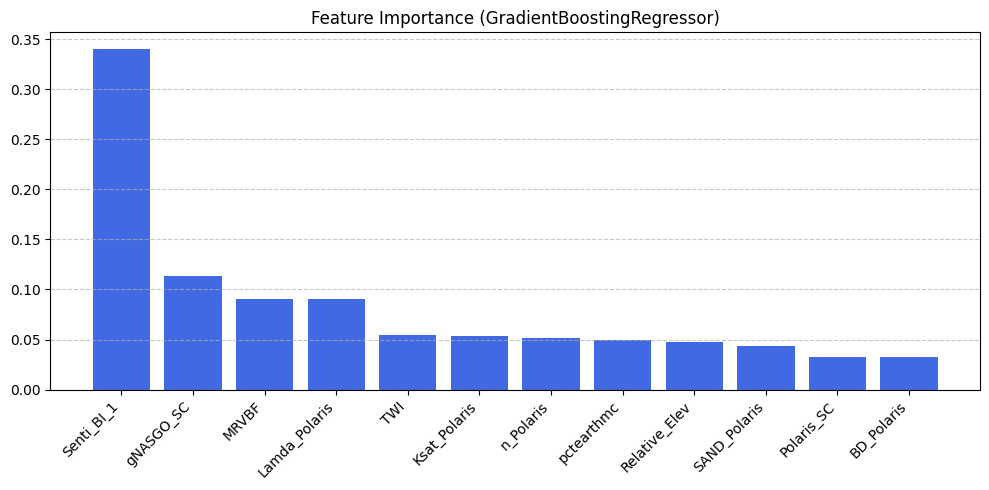

In [35]:
import matplotlib.pyplot as plt

# === Scatter Plot: Train and Test with Metrics ===
plt.figure(figsize=(8, 4))

# Train scatter
plt.subplot(1, 2, 1)
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)], [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.title("Train Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Train metrics box
train_textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
train_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, train_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=train_props)

# Test scatter
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, color="darkorange", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.title("Test Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Test metrics box
test_textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
test_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, test_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=test_props)

plt.tight_layout()
plt.show()

# === Feature Importance Plot from GBR ===
best_gbr = stacking_model.named_estimators_['gbr'].best_estimator_
feature_importance = best_gbr.feature_importances_

importance_df = pd.DataFrame({
    'Feature': selected_feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 5))
plt.bar(importance_df['Feature'], importance_df['Importance'], color='royalblue')
plt.title("Feature Importance (GradientBoostingRegressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Text(0.05, 0.95, 'MBE: 0.007\nMAE: 1.047\nRMSE: 1.436\nR²: 0.601')

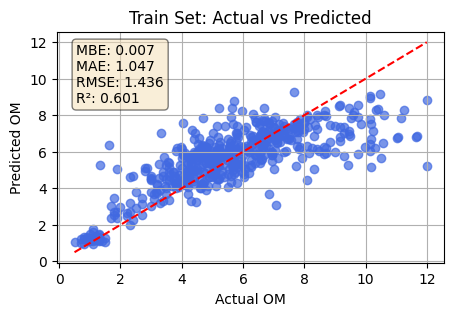

In [43]:
import matplotlib.pyplot as plt

# === Scatter Plot: Train and Test with Metrics ===
plt.figure(figsize=(11, 3))

# Train scatter
plt.subplot(1, 2, 1)
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)], [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.title("Train Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Train metrics box
train_textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
train_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, train_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=train_props)

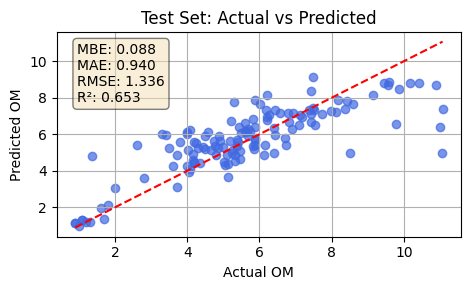

In [53]:
# Test scatter
# === Scatter Plot: Train and Test with Metrics ===
plt.figure(figsize=(9, 3))

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.title("Test Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Test metrics box
test_textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
test_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, test_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=test_props)

plt.tight_layout()
plt.show()

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.feature_selection import RFE
from catboost import CatBoostRegressor

# === Step 1: Clean Data ===
df_m = df_m[df_m['OM'] <= 12]
X = df_m.drop(columns=['OM', 'SAMPLEDATE', 'lati', 'long', 'Senti_BI_2', 'Senti_BI_1', 'Planet_BI_2'])
y = df_m['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# === Step 2: Train-test split ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Step 3: Scaling ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_full)
X_test_scaled = scaler.transform(X_test)

# === Step 4: RFE to select 40% of features ===
num_features = int(0.4 * X.shape[1])
rfe_estimator = GradientBoostingRegressor(random_state=42)
rfe = RFE(estimator=rfe_estimator, n_features_to_select=num_features)
rfe.fit(X_train_scaled, y_train_full)

X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]
selected_feature_names = X.columns[rfe.support_]

# === Step 5: Define and Tune Base Learners ===
param_grid_rf = {'n_estimators': [100], 'max_depth': [None, 10]}
param_grid_et = {'n_estimators': [100], 'max_depth': [None, 10]}
param_grid_gbr = {'n_estimators': [100], 'learning_rate': [0.1], 'max_depth': [3]}
param_grid_cat = {'learning_rate': [0.1], 'depth': [4], 'iterations': [100]}

rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=5, n_jobs=-1)
et = GridSearchCV(ExtraTreesRegressor(random_state=42), param_grid_et, cv=5, n_jobs=-1)
gbr = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gbr, cv=5, n_jobs=-1)
cat = GridSearchCV(CatBoostRegressor(verbose=0, random_state=42), param_grid_cat, cv=5, n_jobs=-1)

# === Meta Learner ===
meta_learner = ElasticNet(alpha=0.1, l1_ratio=0.5)

# === Step 6: Build Stacking Model ===
stacking_model = StackingRegressor(
    estimators=[('rf', rf), ('et', et), ('gbr', gbr), ('cat', cat)],
    final_estimator=meta_learner,
    passthrough=True,
    n_jobs=-1
)

# === Step 7: 10-Fold CV on Train Set ===
kf = KFold(n_splits=10, shuffle=True, random_state=42)
train_actual, train_predicted = [], []
train_metrics = {'mbe': [], 'mae': [], 'rmse': [], 'r2': []}

for train_idx, val_idx in kf.split(X_train_selected):
    X_t, X_v = X_train_selected[train_idx], X_train_selected[val_idx]
    y_t, y_v = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    stacking_model.fit(X_t, y_t)
    y_val_pred = stacking_model.predict(X_v)

    train_actual.extend(y_v)
    train_predicted.extend(y_val_pred)

    train_metrics['mbe'].append(np.mean(y_val_pred - y_v))
    train_metrics['mae'].append(mean_absolute_error(y_v, y_val_pred))
    train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_v, y_val_pred)))
    train_metrics['r2'].append(r2_score(y_v, y_val_pred))

# === Step 8: Final Fit & Test ===
stacking_model.fit(X_train_selected, y_train_full)
y_test_pred = stacking_model.predict(X_test_selected)

# === Step 9: Compute Metrics ===
train_mbe = np.mean(train_metrics['mbe'])
train_mae = np.mean(train_metrics['mae'])
train_rmse = np.mean(train_metrics['rmse'])
train_r2 = np.mean(train_metrics['r2'])

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

# === Step 10: Display Results ===
print("\n--- Train Set (10-Fold CV, 40% Features) ---")
print(f"MBE: {train_mbe:.4f}, MAE: {train_mae:.4f}, RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")

print("\n--- Test Set ---")
print(f"MBE: {test_mbe:.4f}, MAE: {test_mae:.4f}, RMSE: {test_rmse:.4f}, R²: {test_r2:.4f}")



--- Train Set (10-Fold CV, 40% Features) ---
MBE: -0.0025, MAE: 1.0890, RMSE: 1.5038, R²: 0.5763

--- Test Set ---
MBE: 0.0395, MAE: 1.0172, RMSE: 1.4353, R²: 0.5335


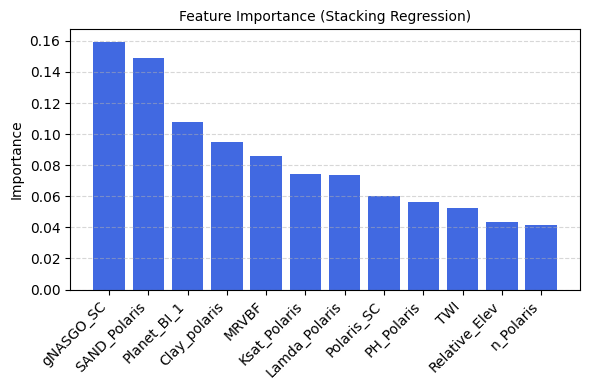

In [55]:
# === Step 13: Feature Importance Plot from GBR ===
best_gbr = stacking_model.named_estimators_['gbr'].best_estimator_
feature_importance = best_gbr.feature_importances_

importance_df = pd.DataFrame({
    'Feature': selected_feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(6, 4))
bars = plt.bar(importance_df['Feature'], importance_df['Importance'], color='royalblue')
plt.title("Feature Importance (Stacking Regression)", fontsize=10)
plt.ylabel("Importance")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


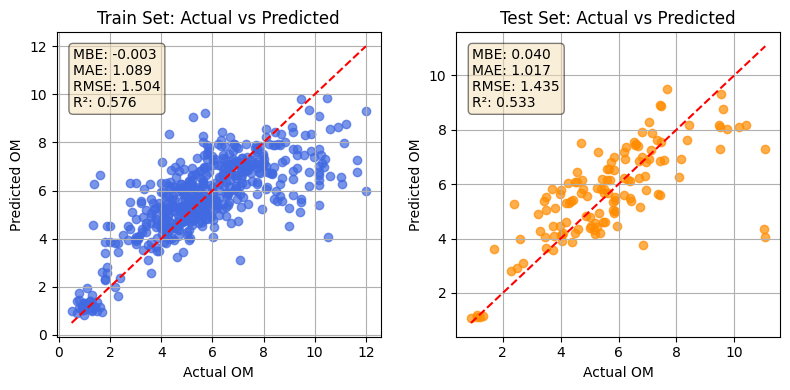

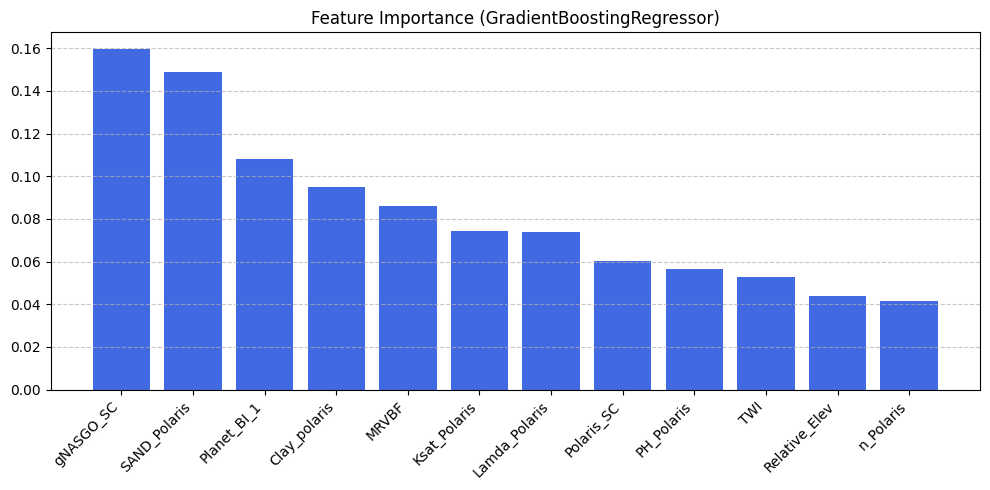

In [56]:
import matplotlib.pyplot as plt

# === Scatter Plot: Train and Test with Metrics ===
plt.figure(figsize=(8, 4))

# Train scatter
plt.subplot(1, 2, 1)
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)], [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.title("Train Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Train metrics box
train_textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
train_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, train_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=train_props)

# Test scatter
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, color="darkorange", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.title("Test Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Test metrics box
test_textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
test_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, test_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=test_props)

plt.tight_layout()
plt.show()

# === Feature Importance Plot from GBR ===
best_gbr = stacking_model.named_estimators_['gbr'].best_estimator_
feature_importance = best_gbr.feature_importances_

importance_df = pd.DataFrame({
    'Feature': selected_feature_names,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 5))
plt.bar(importance_df['Feature'], importance_df['Importance'], color='royalblue')
plt.title("Feature Importance (GradientBoostingRegressor)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Text(0.05, 0.95, 'MBE: -0.003\nMAE: 1.089\nRMSE: 1.504\nR²: 0.576')

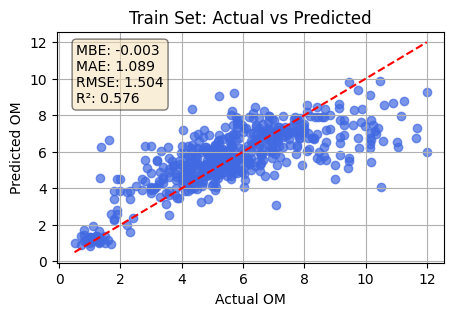

In [57]:
import matplotlib.pyplot as plt

# === Scatter Plot: Train and Test with Metrics ===
plt.figure(figsize=(11, 3))

# Train scatter
plt.subplot(1, 2, 1)
plt.scatter(train_actual, train_predicted, color="royalblue", alpha=0.7)
plt.plot([min(train_actual), max(train_actual)], [min(train_actual), max(train_actual)], color="red", linestyle="--")
plt.title("Train Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Train metrics box
train_textstr = '\n'.join((
    f'MBE: {train_mbe:.3f}',
    f'MAE: {train_mae:.3f}',
    f'RMSE: {train_rmse:.3f}',
    f'R²: {train_r2:.3f}'
))
train_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, train_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=train_props)

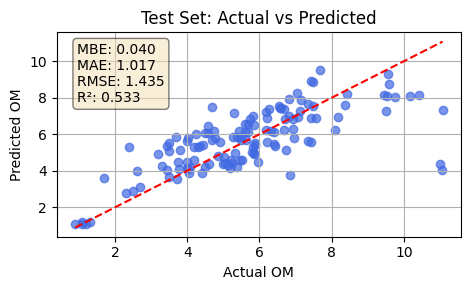

In [58]:
# Test scatter
# === Scatter Plot: Train and Test with Metrics ===
plt.figure(figsize=(9, 3))

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, color="royalblue", alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.title("Test Set: Actual vs Predicted")
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.grid(True)

# Test metrics box
test_textstr = '\n'.join((
    f'MBE: {test_mbe:.3f}',
    f'MAE: {test_mae:.3f}',
    f'RMSE: {test_rmse:.3f}',
    f'R²: {test_r2:.3f}'
))
test_props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.95, test_textstr, transform=plt.gca().transAxes, verticalalignment='top', bbox=test_props)

plt.tight_layout()
plt.show()

ALL

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2293
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 10
[LightGBM] [Info] Start training from score 6.434454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2294
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.457980
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2293
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 10
[LightGBM] [Info] Start training from score 6.434454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1829
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 10
[LightGBM] [Info] Start training from score 5.935428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2289
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 10
[LightGBM] [Info] Start training from score 6.378661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1832
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 10
[LightGBM] [Info] Start training from score 5.839053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1834
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 6.327945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1833
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 6.618400
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2289
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 10
[LightGBM] [Info] Start training from score 6.309418
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1834
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 10
[LightGBM] [Info] Start training from score 5.792623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1838
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 6.568655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2292
[LightGBM] [Info] Number of data points in the train set: 687, number of used features: 10
[LightGBM] [Info] Start training from score 6.389214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1835
[LightGBM] [Info] Number of data points in the train set: 549, number of used features: 10
[LightGBM] [Info] Start training from score 5.863643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2294
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.413488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1836
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 5.911055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1841
[LightGBM] [Info] Number of data points in the train set: 551, number of used features: 10
[LightGBM] [Info] Start training from score 6.621198
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2294
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.457980
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1835
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 5.957236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2293
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.406759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1833
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 5.873364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2292
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.461366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1833
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 5.940000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1838
[LightGBM] [Info] Number of data points in the train set: 551, number of used features: 10
[LightGBM] [Info] Start training from score 6.696334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2296
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.397951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1836
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 5.879200
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2294
[LightGBM] [Info] Number of data points in the train set: 688, number of used features: 10
[LightGBM] [Info] Start training from score 6.392180
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1834
[LightGBM] [Info] Number of data points in the train set: 550, number of used features: 10
[LightGBM] [Info] Start training from score 5.888782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1839
[LightGBM] [Info] Number of data points in the train set: 551, number of used features: 10
[LightGBM] [Info] Start training from score 6.586661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


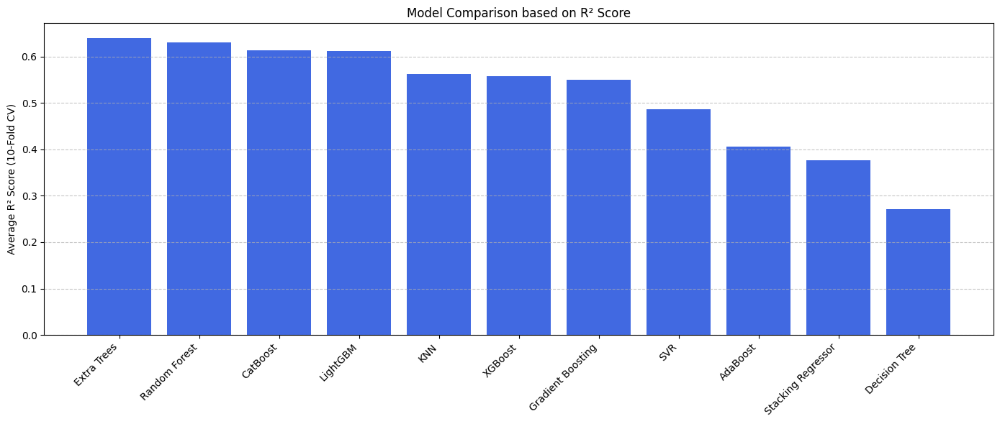

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import (
    RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor, StackingRegressor
)
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.feature_selection import RFE

# Data preparation
X = df_m.drop(columns=['OM','SAMPLEDATE','Elevation','lati','long','rootznaws', 'Sensor_OM','aws_0_20s',
                       'Standardized_Height','Normalized_Height'])
y = df_m['OM']
X = X.dropna()
y = y[X.index]
X = X[y.notna()]
y = y.dropna()

# Feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Feature selection using RFE
rfe_model = RandomForestRegressor(random_state=42)
num_features_to_select = int(0.30 * X.shape[1])
rfe = RFE(estimator=rfe_model, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)
selected_features = X.columns[rfe.support_]
X_selected = X_scaled[:, rfe.support_]

# Define models
models = {
    'Random Forest': RandomForestRegressor(random_state=42),
    'Extra Trees': ExtraTreesRegressor(random_state=42),
    'CatBoost': CatBoostRegressor(verbose=0, random_state=42),
    'LightGBM': LGBMRegressor(random_state=42),
    'XGBoost': XGBRegressor(verbosity=0, random_state=42),
    'AdaBoost': AdaBoostRegressor(random_state=42),
    'KNN': KNeighborsRegressor(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),

    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'SVR': SVR()
}

# Prepare to store R2 scores
model_scores = {}

# Evaluate each model
kf = KFold(n_splits=10, shuffle=True, random_state=42)

for name, model in models.items():
    r2_scores = []
    for train_idx, test_idx in kf.split(X_selected):
        X_train, X_test = X_selected[train_idx], X_selected[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2_scores.append(r2_score(y_test, y_pred))
    model_scores[name] = np.mean(r2_scores)

# Build stacking regressor
base_estimators = [(name.lower().replace(" ", "_"), m) for name, m in models.items()]
stacking_model = StackingRegressor(
    estimators=base_estimators,
    final_estimator=LinearRegression(),
    cv=5,
    passthrough=True
)

# Evaluate stacking model
r2_scores_stack = []
for train_idx, test_idx in kf.split(X_selected):
    X_train, X_test = X_selected[train_idx], X_selected[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    stacking_model.fit(X_train, y_train)
    y_pred = stacking_model.predict(X_test)
    r2_scores_stack.append(r2_score(y_test, y_pred))

model_scores['Stacking Regressor'] = np.mean(r2_scores_stack)

# Plot comparison
plt.figure(figsize=(14, 6))
sorted_scores = dict(sorted(model_scores.items(), key=lambda item: item[1], reverse=True))
plt.bar(sorted_scores.keys(), sorted_scores.values(), color='royalblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel("Average R² Score (10-Fold CV)")
plt.title("Model Comparison based on R² Score")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


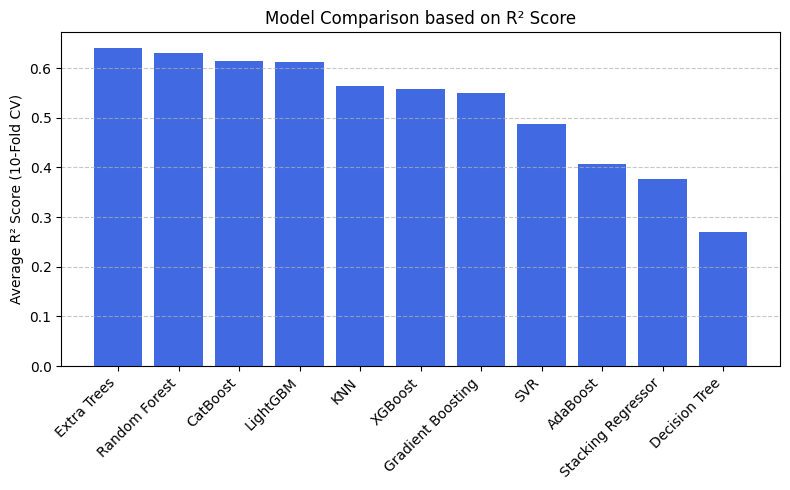

In [ ]:
# Plot comparison
plt.figure(figsize=(8, 5))
sorted_scores = dict(sorted(model_scores.items(), key=lambda item: item[1], reverse=True))
plt.bar(sorted_scores.keys(), sorted_scores.values(), color='royalblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel("Average R² Score (10-Fold CV)")
plt.title("Model Comparison based on R² Score")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

WiTH RFE STACKING REGRESSOR

DEEP NEURAL NETWORK

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM',  'SAMPLEDATE','Elevation','lati','long','Sensor_OM', ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X


# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define function to build the DNN model
def build_dnn(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Build and train the DNN model
    dnn = build_dnn(X_train.shape[1])
    dnn.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    # Predict on test set
    y_pred = dnn.predict(X_test).flatten()

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Deep Neural Network (DNN)")
print(f"Setup: {'Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)'}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual OM from the last fold
df_dnn = pd.DataFrame({
    'Actual OM': y_test.values,
    'Predicted OM': y_pred
})

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long','Sensor_OM'])
y = df_m['OM']

# Drop rows with NaNs
df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long','Sensor_OM'])
y = df_cleaned['OM']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define the DNN model builder
def build_dnn(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Set up 10-fold CV
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

# For tracking the last fold’s prediction
last_y_test = None
last_y_pred = None

# Run 10-fold cross-validation
for fold, (train_idx, test_idx) in enumerate(kf.split(X_scaled), 1):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model = build_dnn(X_train.shape[1])
    model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    y_pred = model.predict(X_test).flatten()

    # Metrics
    mbe = np.mean(y_pred - y_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

    # Store last fold predictions
    last_y_test = y_test
    last_y_pred = y_pred

# Average CV metrics
print(f"\n📊 DNN – 10-Fold Cross-Validation Results:")
print(f"Architecture: Dense(64, ReLU) → Dense(32, ReLU) → Dense(1)")
print(f"Average MBE:  {np.mean(mbe_list):.4f}")
print(f"Average MAE:  {np.mean(mae_list):.4f}")
print(f"Average RMSE: {np.mean(rmse_list):.4f}")
print(f"Average R²:   {np.mean(r2_list):.4f}")

# Optional: create a DataFrame for the last fold
df_dnn_cv = pd.DataFrame({
    'Actual OM': last_y_test.values,
    'Predicted OM': last_y_pred
})


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

📊 DNN – 10-Fold Cross-Validation Results:
Architecture: Dense(64, ReLU) → Dense(32, ReLU) → Dense(1)
Average MBE:  -0.3767
Average MAE:  1.9945
Average RMSE: 2.9150
Average R²:   0.0415


DNN total_With scatter Plot

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

📊 DNN – 10-Fold Cross-Validation on Full Dataset:
Architecture: Dense(64, ReLU) → Dense(32, ReLU) → Dense(1)
Average MBE:  -0.3536
Average MAE:  2.0678
Average RMSE: 3.0667
Average R²:   -0.0555


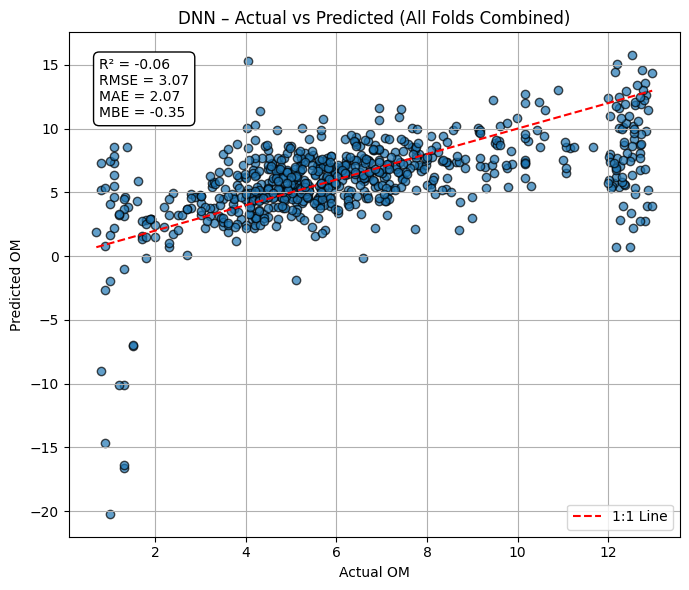

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers

# Load data
X = df_m.drop(columns=['OM', 'SAMPLEDATE', 'Elevation', 'lati', 'long', 'Sensor_OM'])
y = df_m['OM']

# Drop rows with NaNs
df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE', 'Elevation', 'lati', 'long', 'Sensor_OM'])
y = df_cleaned['OM']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# DNN builder function
def build_dnn(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# ---------- 10-Fold Cross-Validation ----------
kf = KFold(n_splits=10, shuffle=True, random_state=42)

mbe_list, mae_list, rmse_list, r2_list = [], [], [], []
all_y_true, all_y_pred = [], []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_scaled), 1):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    dnn = build_dnn(X_train.shape[1])
    dnn.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    y_val_pred = dnn.predict(X_val).flatten()

    # Store all predictions
    all_y_true.extend(y_val)
    all_y_pred.extend(y_val_pred)

    # Metrics for this fold
    mbe = np.mean(y_val_pred - y_val)
    mae = mean_absolute_error(y_val, y_val_pred)
    rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    r2 = r2_score(y_val, y_val_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# ---------- Average Metrics ----------
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

print(f"\n📊 DNN – 10-Fold Cross-Validation on Full Dataset:")
print(f"Architecture: Dense(64, ReLU) → Dense(32, ReLU) → Dense(1)")
print(f"Average MBE:  {avg_mbe:.4f}")
print(f"Average MAE:  {avg_mae:.4f}")
print(f"Average RMSE: {avg_rmse:.4f}")
print(f"Average R²:   {avg_r2:.4f}")

# ---------- Scatter Plot: Actual vs Predicted (All Folds) ----------
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)

plt.figure(figsize=(7, 6))
plt.scatter(all_y_true, all_y_pred, alpha=0.7, edgecolors='k')
plt.plot([all_y_true.min(), all_y_true.max()], [all_y_true.min(), all_y_true.max()],
         'r--', label='1:1 Line')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("DNN – Actual vs Predicted (All Folds Combined)")

plt.text(0.05, 0.95,
         f"R² = {avg_r2:.2f}\nRMSE = {avg_rmse:.2f}\nMAE = {avg_mae:.2f}\nMBE = {avg_mbe:.2f}",
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4'))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


withcv_test

WITH RFE DEEP NEURAL NETWORK

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.ensemble import RandomForestRegressor  # For feature selection

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM',  'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'rootznaws' ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X


# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Feature selection using RFE with RandomForestRegressor
feature_selector = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)

# Set the number of features to select (90% of total features)
num_features_to_select = int(0.7 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=feature_selector, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Define function to build the DNN model
def build_dnn(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Build and train the DNN model
    dnn = build_dnn(X_train.shape[1])
    dnn.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    # Predict on test set
    y_pred = dnn.predict(X_test).flatten()

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Deep Neural Network (DNN)")
print(f"Setup: {'Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)'}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_dnn_rfe = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

Selected Top 90% Features (26 out of 38):
['Relative_Elev', 'Aspect', 'Senti_BI_1', 'Senti_BI_2', 'Plant_BI_1', 'Plant_BI_2', 'Gnasco_SC', 'MRVBF', 'TWI', 'Clay_polaris', 'SAND_Polaris', 'SILT_Polaris', 'PH_Polaris', 'ncci3all', 'aws_5_20s', 'aws_0_20s', 'Alpha_Polaris', 'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris', 'Theta_r_Polaris', 'MRRTF', 'Valley_Depth', 'Standardized_Height', 'Normalized_Height']


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Model: Deep Neural Network (DNN)
Setup: Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)
Average Metrics Across 10-Fold CV (with 90% selected features):
MBE=-0.2181, MAE=1.9810, RMSE=2.9251, R²=0.0662


In [ ]:
r2_scores_vs_features = []

for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    rfe = RFE(estimator=RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42),
              n_features_to_select=num_feats)
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        dnn = build_dnn(X_train.shape[1])
        dnn.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

        y_pred = dnn.predict(X_test).flatten()
        r2_temp.append(r2_score(y_test, y_pred))

    avg_r2 = np.mean(r2_temp)
    r2_scores_vs_features.append((pct, avg_r2))
    print(f"{pct}% Features -> Avg R²: {avg_r2:.4f}")

# Plot
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='tomato')
plt.title("DNN: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


NameError: name 'X_scaled' is not defined

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
10% Features -> Avg R²: 0.3411


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
20% Features -> Avg R²: 0.2741


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
30% Features -> Avg R²: 0.3140


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
40% Features -> Avg R²: 0.0546


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
50% Features -> Avg R²: 0.0426


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
60% Features -> Avg R²: -0.0550


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
70% Features -> Avg R²: 0.1127


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
80% Features -> Avg R²: -0.0729


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
90% Features -> Avg R²: -0.1425


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
100% Features -> Avg R²: -0.0802


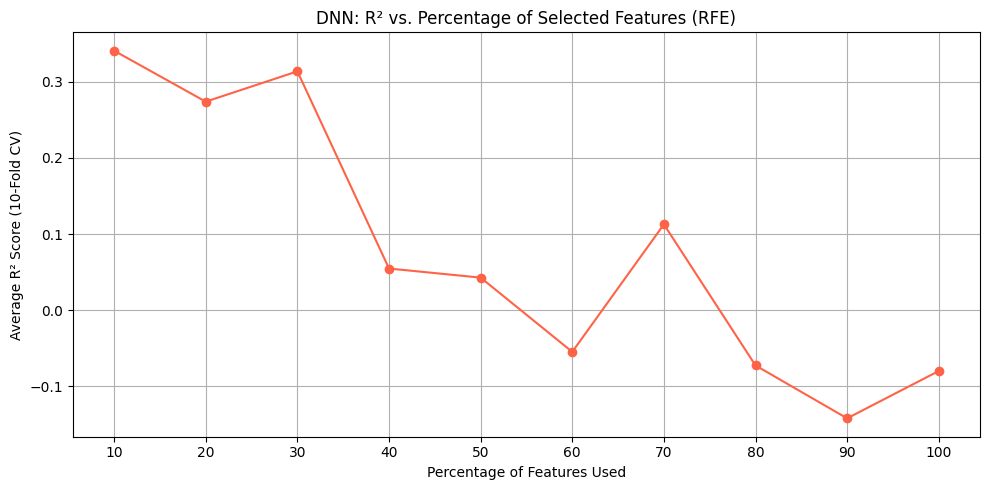

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.ensemble import RandomForestRegressor # Need this for RFE estimator

# Define independent (X) and dependent (y) variables - assuming df_m is already loaded
# If df_m is not loaded in a previous cell, you'll need to load it here.
# Example: df_m = pd.read_csv('your_data.csv')

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM',  'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'rootznaws' ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
# A safer way is to drop NaNs after creating X and y
df_combined = pd.concat([X, y], axis=1).dropna()
X = df_combined.drop(columns=['OM'])
y = df_combined['OM']


# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define function to build the DNN model (needed here)
def build_dnn(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Initialize K-Fold cross-validation (needed here)
kf = KFold(n_splits=10, shuffle=True, random_state=42)


r2_scores_vs_features = []

for pct in range(10, 101, 10):
    num_feats = int((pct / 100) * X.shape[1])

    # Check if num_feats is valid (at least 1)
    if num_feats < 1:
        num_feats = 1
    # Ensure num_feats does not exceed the number of available features
    if num_feats > X_scaled.shape[1]:
         num_feats = X_scaled.shape[1]


    rfe = RFE(estimator=RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42),
              n_features_to_select=num_feats)

    # Fit RFE on the scaled data X_scaled
    rfe.fit(X_scaled, y)
    X_rfe = X_scaled[:, rfe.support_]

    r2_temp = []

    for train_idx, test_idx in kf.split(X_rfe):
        X_train, X_test = X_rfe[train_idx], X_rfe[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Build and train DNN within the CV loop
        dnn = build_dnn(X_train.shape[1])
        # Use verbose=0 to reduce output during the loop
        dnn.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)


        y_pred = dnn.predict(X_test).flatten()
        r2_temp.append(r2_score(y_test, y_pred))

    avg_r2 = np.mean(r2_temp)
    r2_scores_vs_features.append((pct, avg_r2))
    print(f"{pct}% Features -> Avg R²: {avg_r2:.4f}")

# Plot
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])
plt.figure(figsize=(10, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', linestyle='-', color='tomato')
plt.title("DNN: R² vs. Percentage of Selected Features (RFE)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (10-Fold CV)")
plt.grid(True)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()

<ipython-input-13-9b25a40f3c43>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=df, x='Model', y='R2 Score', palette='coolwarm')


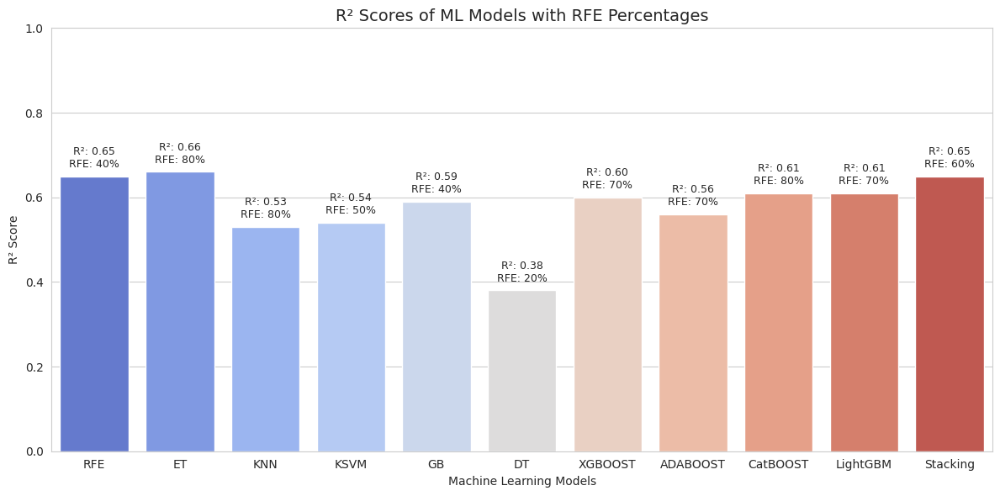

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Data
data = {
    'Model': [
        'RFE', 'ET', 'KNN', 'KSVM', 'GB', 'DT',
        'XGBOOST', 'ADABOOST', 'CatBOOST', 'LightGBM', 'Stacking'
    ],
    'R2 Score': [0.65, 0.66, 0.53, 0.54, 0.59, 0.38, 0.60, 0.56, 0.61, 0.61, 0.65],
    'RFE %': [40, 80, 80, 50, 40, 20, 70, 70, 80, 70, 60]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")
barplot = sns.barplot(data=df, x='Model', y='R2 Score', palette='coolwarm')

# Annotate R² and RFE % on bars
for i in range(len(df)):
    r2 = df['R2 Score'][i]
    rfe = df['RFE %'][i]
    plt.text(i, r2 + 0.015, f'R²: {r2:.2f}\nRFE: {rfe}%', ha='center', va='bottom', fontsize=9)

# Styling
plt.title('R² Scores of ML Models with RFE Percentages', fontsize=14)
plt.ylim(0, 1)
plt.xlabel('Machine Learning Models')
plt.ylabel('R² Score')
plt.tight_layout()
plt.show()


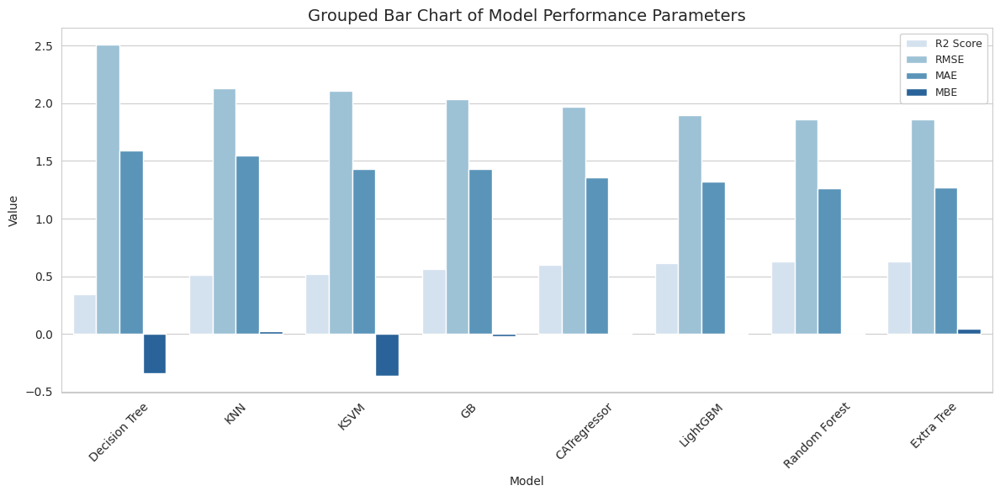

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Updated data with Extra Tree included
data = {
    'Model': [
        'Decision Tree', 'KNN', 'KSVM', 'GB', 'CATregressor',
        'LightGBM', 'Random Forest', 'Extra Tree'
    ],
    'R2 Score': [0.34, 0.51, 0.52, 0.56, 0.60, 0.61, 0.63, 0.631],
    'RMSE': [2.51, 2.13, 2.11, 2.033, 1.97, 1.9, 1.86, 1.86],
    'MAE': [1.59, 1.55, 1.43, 1.43, 1.36, 1.32, 1.26, 1.27],
    'MBE': [-0.34, 0.023, -0.365, -0.018, -0.01, -0.004, -0.007, 0.048]
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt the data for seaborn compatibility (long format)
df_melted = df.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Plot setup
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Grouped bar chart
sns.barplot(
    data=df_melted,
    x='Model',
    y='Value',
    hue='Metric',
    palette='Blues',
    hue_order=['R2 Score', 'RMSE', 'MAE', 'MBE']
)

# Legend adjustments
plt.legend(title='', loc='upper right', fontsize=9, frameon=True, framealpha=0.9, borderpad=0.5)

# Labels and formatting
plt.title('Grouped Bar Chart of Model Performance Parameters', fontsize=14)
plt.xlabel('Model')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


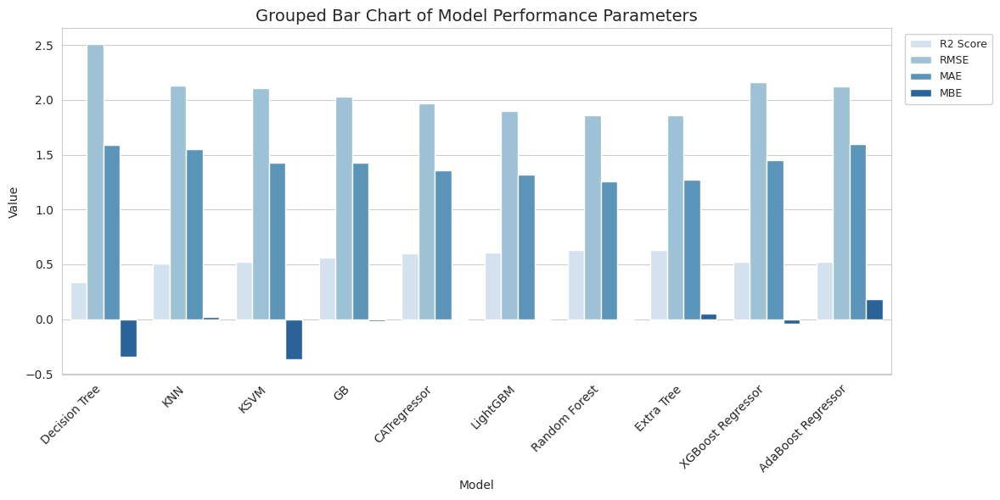

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Updated data including XGBoost and AdaBoost
data = {
    'Model': [
        'Decision Tree', 'KNN', 'KSVM', 'GB', 'CATregressor',
        'LightGBM', 'Random Forest', 'Extra Tree',
        'XGBoost Regressor', 'AdaBoost Regressor'
    ],
    'R2 Score': [0.34, 0.51, 0.52, 0.56, 0.60, 0.61, 0.63, 0.631, 0.52, 0.52],
    'RMSE': [2.51, 2.13, 2.11, 2.033, 1.97, 1.9, 1.86, 1.86, 2.16, 2.12],
    'MAE': [1.59, 1.55, 1.43, 1.43, 1.36, 1.32, 1.26, 1.27, 1.45, 1.6],
    'MBE': [-0.34, 0.023, -0.365, -0.018, -0.01, -0.004, -0.007, 0.048, -0.04, 0.181]
}

# Create DataFrame
df = pd.DataFrame(data)

# Melt to long format
df_melted = df.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Plot
plt.figure(figsize=(14, 6))
sns.set_style("whitegrid")

# Barplot
bar_plot = sns.barplot(
    data=df_melted,
    x='Model',
    y='Value',
    hue='Metric',
    palette='Blues',
    hue_order=['R2 Score', 'RMSE', 'MAE', 'MBE']
)

# Place legend outside the plot area
plt.legend(
    title='',
    bbox_to_anchor=(1.01, 1),  # Right outside the plot
    loc='upper left',
    fontsize=9,
    frameon=True,
    framealpha=0.9,
    borderpad=0.5
)

# Labels
plt.title('Grouped Bar Chart of Model Performance Parameters', fontsize=14)
plt.xlabel('Model')
plt.ylabel('Value')
plt.xticks(rotation=45, ha='right')
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Leave space for legend on the right

plt.show()


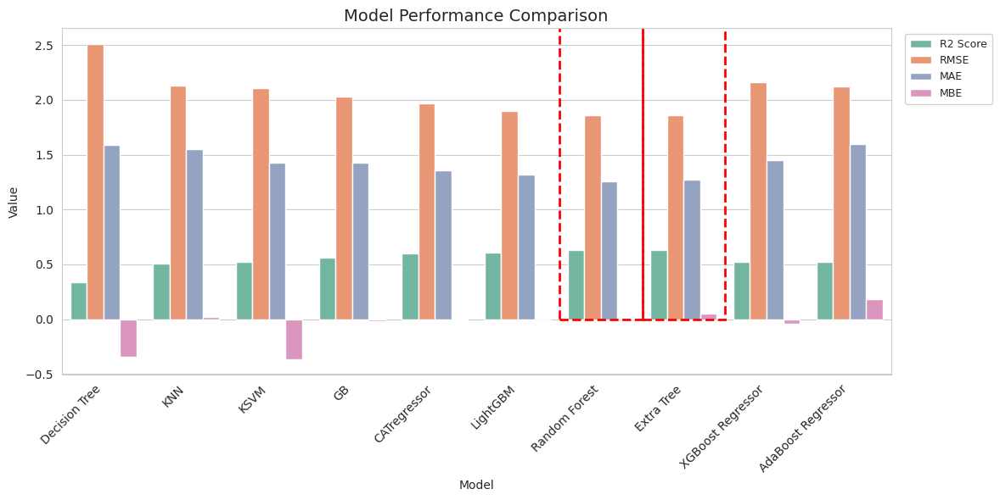

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Updated data
data = {
    'Model': [
        'Decision Tree', 'KNN', 'KSVM', 'GB', 'CATregressor',
        'LightGBM', 'Random Forest', 'Extra Tree',
        'XGBoost Regressor', 'AdaBoost Regressor'
    ],
    'R2 Score': [0.34, 0.51, 0.52, 0.56, 0.60, 0.61, 0.63, 0.631, 0.52, 0.52],
    'RMSE': [2.51, 2.13, 2.11, 2.033, 1.97, 1.9, 1.86, 1.86, 2.16, 2.12],
    'MAE': [1.59, 1.55, 1.43, 1.43, 1.36, 1.32, 1.26, 1.27, 1.45, 1.6],
    'MBE': [-0.34, 0.023, -0.365, -0.018, -0.01, -0.004, -0.007, 0.048, -0.04, 0.181]
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt the data for Seaborn
df_melted = df.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Plot
plt.figure(figsize=(14, 6))
sns.set_style("whitegrid")

# Barplot with Set2 color palette
bar_plot = sns.barplot(
    data=df_melted,
    x='Model',
    y='Value',
    hue='Metric',
    palette='Set2',
    hue_order=['R2 Score', 'RMSE', 'MAE', 'MBE']
)

# Add red box around the two best models
best_models = ['Random Forest', 'Extra Tree']
x_labels = [tick.get_text() for tick in bar_plot.get_xticklabels()]
for idx, label in enumerate(x_labels):
    if label in best_models:
        plt.gca().add_patch(
            plt.Rectangle(
                (idx - 0.5, 0),  # x, y
                1,               # width
                df_melted['Value'].max() + 0.3,  # height
                fill=False,
                edgecolor='red',
                linewidth=2,
                linestyle='--'
            )
        )

# Place legend outside the chart
plt.legend(
    title='',
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    fontsize=9,
    frameon=True,
    framealpha=0.9,
    borderpad=0.5
)

# Label formatting
plt.title('Model Performance Comparison', fontsize=14)
plt.xlabel('Model')
plt.ylabel('Value')
plt.xticks(rotation=45, ha='right')
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Reserve space for legend

plt.show()


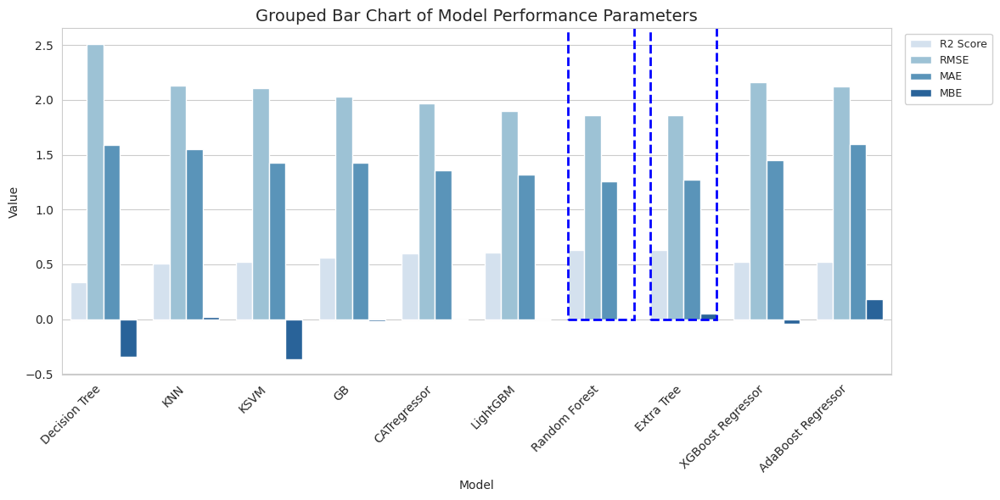

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd

# Model performance data
data = {
    'Model': [
        'Decision Tree', 'KNN', 'KSVM', 'GB', 'CATregressor',
        'LightGBM', 'Random Forest', 'Extra Tree',
        'XGBoost Regressor', 'AdaBoost Regressor'
    ],
    'R2 Score': [0.34, 0.51, 0.52, 0.56, 0.60, 0.61, 0.63, 0.631, 0.52, 0.52],
    'RMSE': [2.51, 2.13, 2.11, 2.033, 1.97, 1.9, 1.86, 1.86, 2.16, 2.12],
    'MAE': [1.59, 1.55, 1.43, 1.43, 1.36, 1.32, 1.26, 1.27, 1.45, 1.6],
    'MBE': [-0.34, 0.023, -0.365, -0.018, -0.01, -0.004, -0.007, 0.048, -0.04, 0.181]
}

# Create DataFrame
df = pd.DataFrame(data)

# Identify best two models based on R²
top_models = df.sort_values(by='R2 Score', ascending=False).head(2)['Model'].tolist()

# Melt the data for seaborn compatibility
df_melted = df.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Set up the plot
plt.figure(figsize=(14, 6))
sns.set_style("whitegrid")
ax = sns.barplot(
    data=df_melted,
    x='Model',
    y='Value',
    hue='Metric',
    palette='Blues',
    hue_order=['R2 Score', 'RMSE', 'MAE', 'MBE']
)

# Move legend
plt.legend(
    title='',
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    fontsize=9,
    frameon=True,
    framealpha=0.9,
    borderpad=0.5
)

# Draw blue box around top models
for label in top_models:
    idx = df['Model'].tolist().index(label)
    rect = patches.Rectangle(
        (idx - 0.4, 0), 0.8, df_melted['Value'].max() + 0.3,
        linewidth=2, edgecolor='blue', facecolor='none', linestyle='--'
    )
    ax.add_patch(rect)

# Labels and layout
plt.title('Grouped Bar Chart of Model Performance Parameters', fontsize=14)
plt.xlabel('Model')
plt.ylabel('Value')
plt.xticks(rotation=45, ha='right')
plt.tight_layout(rect=[0, 0, 0.85, 1])

plt.show()



✅ Selected Top 90% Features (24 out of 30):
['Relative_Elev', 'Slope', 'Aspect', 'Profile_curva', 'Senti_BI_1', 'Senti_BI_2', 'Plant_BI_1', 'Plant_BI_2', 'Polaris_SC', 'Gnasco_SC', 'MRVBF', 'TWI', 'Clay_polaris', 'SAND_Polaris', 'SILT_Polaris', 'rootznaws', 'pctearthmc', 'ncci3all', 'aws_0_20s', 'Alpha_Polaris', 'HB_Polaris', 'Ksat_Polaris', 'Lamda_Polaris', 'n_Polaris']


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

📊 DNN – 10-Fold Cross-Validation (Train Set):
MBE:  0.0115
MAE:  1.6621
RMSE: 2.3247
R²:   0.3667


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

🧪 DNN – Final Evaluation on Unseen Test Set:
MBE:  0.0339
MAE:  1.8587
RMSE: 2.6161
R²:   0.3338


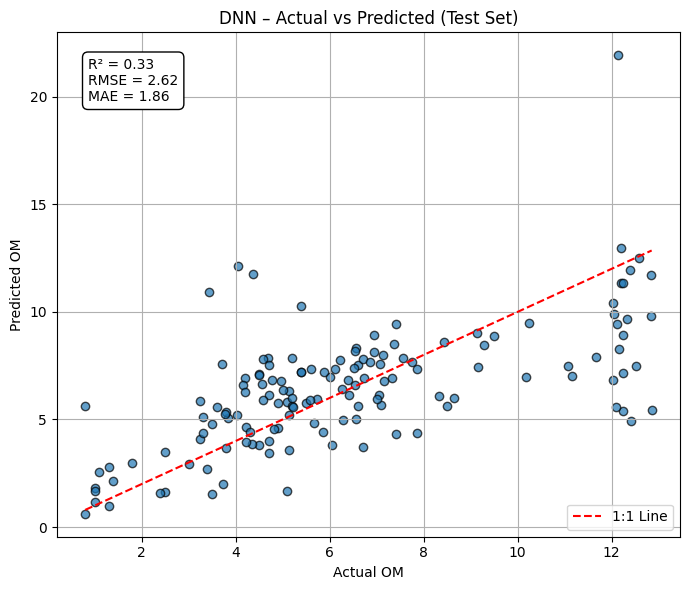

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.ensemble import RandomForestRegressor  # For feature selection

# Load and clean data
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])
y = df_m['OM']

df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])
y = df_cleaned['OM']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train/Test Split (80/20)
X_train_full, X_test_full, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# RFE Feature Selection on training set only
feature_selector = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
num_features_to_select = int(0.8 * X.shape[1])
rfe = RFE(estimator=feature_selector, n_features_to_select=num_features_to_select)
rfe.fit(X_train_full, y_train)

# Selected features
selected_features = X.columns[rfe.support_]
print(f"\n✅ Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Apply feature selection
X_train = X_train_full[:, rfe.support_]
X_test = X_test_full[:, rfe.support_]

# Define DNN architecture
def build_dnn(input_shape):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# ----------- 10-Fold CV on Training Set -----------
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_idx, val_idx in kf.split(X_train):
    X_cv_train, X_cv_val = X_train[train_idx], X_train[val_idx]
    y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    dnn = build_dnn(X_cv_train.shape[1])
    dnn.fit(X_cv_train, y_cv_train, epochs=100, batch_size=16, verbose=0, validation_split=0.1)

    y_cv_pred = dnn.predict(X_cv_val).flatten()

    mbe = np.mean(y_cv_pred - y_cv_val)
    mae = mean_absolute_error(y_cv_val, y_cv_pred)
    rmse = np.sqrt(mean_squared_error(y_cv_val, y_cv_pred))
    r2 = r2_score(y_cv_val, y_cv_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

print(f"\n📊 DNN – 10-Fold Cross-Validation (Train Set):")
print(f"MBE:  {np.mean(mbe_list):.4f}")
print(f"MAE:  {np.mean(mae_list):.4f}")
print(f"RMSE: {np.mean(rmse_list):.4f}")
print(f"R²:   {np.mean(r2_list):.4f}")

# ----------- Final Training on Full Training Set and Test Evaluation -----------
final_dnn = build_dnn(X_train.shape[1])
final_dnn.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.1)

y_test_pred = final_dnn.predict(X_test).flatten()

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print(f"\n🧪 DNN – Final Evaluation on Unseen Test Set:")
print(f"MBE:  {test_mbe:.4f}")
print(f"MAE:  {test_mae:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"R²:   {test_r2:.4f}")

# ---------- Store predictions from test set ----------
df_dnn_rfe = pd.DataFrame({
    'Actual OM': y_test.values,
    'Predicted OM': y_test_pred
})

# ---------- Plot Actual vs Predicted ----------
plt.figure(figsize=(7, 6))
plt.scatter(y_test, y_test_pred, alpha=0.7, edgecolors='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='1:1 Line')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("DNN – Actual vs Predicted (Test Set)")

plt.text(0.05, 0.95,
         f"R² = {test_r2:.2f}\nRMSE = {test_rmse:.2f}\nMAE = {test_mae:.2f}",
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4'))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
ANN

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM',  'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X


# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define function to build the ANN model
def build_ann(input_shape):
    model = keras.Sequential([
        layers.Dense(128, activation='relu', input_shape=(input_shape,)),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Build and train the ANN model
    ann = build_ann(X_train.shape[1])
    ann.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    # Predict on test set
    y_pred = ann.predict(X_test).flatten()

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Artificial Neural Network (ANN)")
print(f"Setup: {'Dense(128, ReLU) -> Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)'}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_ann = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_pred
})

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Model: Artificial Neural Network (ANN)
Setup: Dense(128, ReLU) -> Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)
Average Metrics Across 10-Fold CV:
MBE=-0.2306, MAE=1.8945, RMSE=2.7133, R²=0.1608


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step 


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Model: Artificial Neural Network (ANN)
Setup: Dense(128, ReLU) -> Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)
Average Metrics Across 10-Fold CV:
MBE=-0.2887, MAE=1.8775, RMSE=2.7135, R²=0.1614


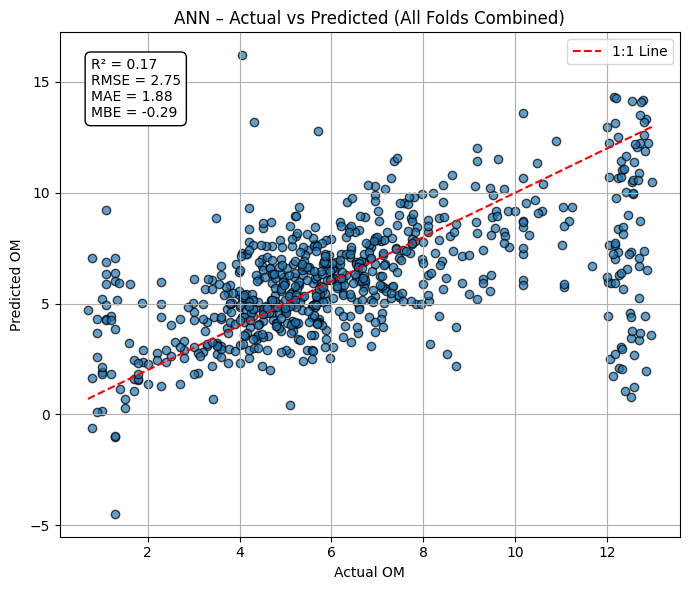

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM',  'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define function to build the ANN model
def build_ann(input_shape):
    model = keras.Sequential([
        layers.Dense(128, activation='relu', input_shape=(input_shape,)),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Lists to store all actual and predicted values across folds
all_y_true = []
all_y_pred = []

# Perform cross-validation
for train_index, test_index in kf.split(X_scaled):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Build and train the ANN model
    ann = build_ann(X_train.shape[1])
    ann.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    # Predict on test set
    y_pred = ann.predict(X_test).flatten()

    # Store actuals and predictions
    all_y_true.extend(y_test.values)
    all_y_pred.extend(y_pred)

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Artificial Neural Network (ANN)")
print(f"Setup: {'Dense(128, ReLU) -> Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)'}")
print(f"Average Metrics Across 10-Fold CV:")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame with all predictions and actuals
df_ann = pd.DataFrame({
    'Actual OM': all_y_true,
    'Predicted OM': all_y_pred
})

# Compute overall metrics for plotting
overall_mbe = np.mean(np.array(all_y_pred) - np.array(all_y_true))
overall_mae = mean_absolute_error(all_y_true, all_y_pred)
overall_rmse = np.sqrt(mean_squared_error(all_y_true, all_y_pred))
overall_r2 = r2_score(all_y_true, all_y_pred)

# --- Plot Actual vs Predicted for All Folds ---
plt.figure(figsize=(7, 6))
plt.scatter(all_y_true, all_y_pred, alpha=0.7, edgecolors='k')
plt.plot([min(all_y_true), max(all_y_true)], [min(all_y_true), max(all_y_true)], 'r--', label='1:1 Line')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("ANN – Actual vs Predicted (All Folds Combined)")

plt.text(0.05, 0.95,
         f"R² = {overall_r2:.2f}\nRMSE = {overall_rmse:.2f}\nMAE = {overall_mae:.2f}\nMBE = {overall_mbe:.2f}",
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4'))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


cv_test_ANN

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step

📊 ANN – 10-Fold CV (Train Set):
MBE:  -0.0073
MAE:  1.7235
RMSE: 2.3852
R²:   0.3332


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

🧪 ANN – Final Evaluation on Unseen Test Set:
MBE:  -0.1718
MAE:  1.9428
RMSE: 2.9107
R²:   0.1753


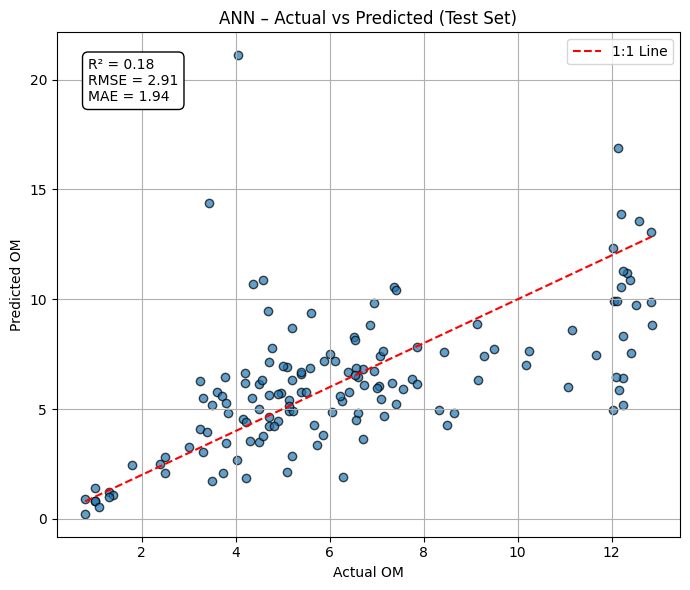

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])
y = df_m['OM']

# Drop rows with NaN values in X or y
df_cleaned = df_m.dropna(subset=['OM'] + X.columns.tolist())
X = df_cleaned.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM'])
y = df_cleaned['OM']

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split into Train and Test sets
X_train_full, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Function to build the ANN model
def build_ann(input_shape):
    model = keras.Sequential([
        layers.Dense(128, activation='relu', input_shape=(input_shape,)),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# --- 10-Fold Cross-Validation on Training Set ---
kf = KFold(n_splits=10, shuffle=True, random_state=42)
mbe_list, mae_list, rmse_list, r2_list = [], [], [], []

for train_index, val_index in kf.split(X_train_full):
    X_cv_train, X_cv_val = X_train_full[train_index], X_train_full[val_index]
    y_cv_train, y_cv_val = y_train.iloc[train_index], y_train.iloc[val_index]

    ann = build_ann(X_cv_train.shape[1])
    ann.fit(X_cv_train, y_cv_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    y_cv_pred = ann.predict(X_cv_val).flatten()

    mbe = np.mean(y_cv_pred - y_cv_val)
    mae = mean_absolute_error(y_cv_val, y_cv_pred)
    rmse = np.sqrt(mean_squared_error(y_cv_val, y_cv_pred))
    r2 = r2_score(y_cv_val, y_cv_pred)

    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Print average CV metrics
print(f"\n📊 ANN – 10-Fold CV (Train Set):")
print(f"MBE:  {np.mean(mbe_list):.4f}")
print(f"MAE:  {np.mean(mae_list):.4f}")
print(f"RMSE: {np.mean(rmse_list):.4f}")
print(f"R²:   {np.mean(r2_list):.4f}")

# --- Final Training on Full Training Set + Test Evaluation ---
final_ann = build_ann(X_train_full.shape[1])
final_ann.fit(X_train_full, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

y_test_pred = final_ann.predict(X_test).flatten()

test_mbe = np.mean(y_test_pred - y_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print(f"\n🧪 ANN – Final Evaluation on Unseen Test Set:")
print(f"MBE:  {test_mbe:.4f}")
print(f"MAE:  {test_mae:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"R²:   {test_r2:.4f}")

# --- Create DataFrame with Final Test Predictions ---
df_ann = pd.DataFrame({
    'Actual Yield': y_test.values,
    'Predicted Yield': y_test_pred
})

# --- Optional: Plot Actual vs Predicted for Test Set ---
plt.figure(figsize=(7, 6))
plt.scatter(y_test, y_test_pred, alpha=0.7, edgecolors='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='1:1 Line')
plt.xlabel("Actual OM")
plt.ylabel("Predicted OM")
plt.title("ANN – Actual vs Predicted (Test Set)")

plt.text(0.05, 0.95,
         f"R² = {test_r2:.2f}\nRMSE = {test_rmse:.2f}\nMAE = {test_mae:.2f}",
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4'))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


WITH RFE ANN

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.ensemble import RandomForestRegressor  # For feature selection

# Define independent (X) and dependent (y) variables
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'aws_0_20s','rootznaws',
                       'Standardized_Height','Normalized_Height' ])  # Features
y = df_m['OM']  # Target variable

# Remove rows with NaN values in X and y
X = X.dropna()
y = y[X.index]  # Align y with the dropped rows in X


# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Feature selection using RFE with RandomForestRegressor
feature_selector = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)

# Set the number of features to select (90% of total features)
num_features_to_select = int(0.3 * X.shape[1])

# Perform Recursive Feature Elimination (RFE) with a fixed number of features
rfe = RFE(estimator=feature_selector, n_features_to_select=num_features_to_select)
rfe.fit(X_scaled, y)

# Get selected features
selected_features = X.columns[rfe.support_]
print(f"Selected Top 90% Features ({len(selected_features)} out of {X.shape[1]}):")
print(selected_features.tolist())

# Reduce X_scaled to selected features
X_selected = X_scaled[:, rfe.support_]

# Define function to build the ANN model
def build_ann(input_shape):
    model = keras.Sequential([
        layers.Dense(128, activation='relu', input_shape=(input_shape,)),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Initialize K-Fold cross-validation (10 folds)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lists to store evaluation metrics
mbe_list = []
mae_list = []
rmse_list = []
r2_list = []

# Perform cross-validation using selected features
for train_index, test_index in kf.split(X_selected):
    X_train, X_test = X_selected[train_index], X_selected[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Build and train the ANN model
    ann = build_ann(X_train.shape[1])
    ann.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, validation_split=0.2)

    # Predict on test set
    y_pred = ann.predict(X_test).flatten()

    # Compute metrics
    mbe = np.mean(y_pred - y_test)  # Mean Bias Error
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Store metrics
    mbe_list.append(mbe)
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

# Compute average metrics across all folds
avg_mbe = np.mean(mbe_list)
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

# Print results
print(f"Model: Artificial Neural Network (ANN)")
print(f"Setup: {'Dense(128, ReLU) -> Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)'}")
print(f"Average Metrics Across 10-Fold CV (with 90% selected features):")
print(f"MBE={avg_mbe:.4f}, MAE={avg_mae:.4f}, RMSE={avg_rmse:.4f}, R²={avg_r2:.4f}")

# Create a DataFrame containing both the predicted and actual yields from the last fold
df_ann_rfe = pd.DataFrame({
    'Actual ': y_test.values,
    'Predicted ': y_pred
})

Selected Top 90% Features (11 out of 39):
['Relative_Elev', 'Senti_BI_1', 'Planet_BI_1', 'Gnasco_SC', 'MRVBF', 'rootznaws', 'aws_5_20s', 'HB_Polaris', 'Lambda_Polaris', 'n_Polaris', 'Standardized_Height']


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Model: Artificial Neural Network (ANN)
Setup: Dense(128, ReLU) -> Dense(64, ReLU) -> Dense(32, ReLU) -> Dense(1)
Average Metrics Across 10-Fold CV (with 90% selected features):
MBE=-0.0354, MAE=1.6054, RMSE=2.4017, R²=0.3460


R2 VS feature importance ANN RFE

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
10% features → R² = 0.3205


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
20% features → R² = 0.4874


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
30% features → R² = 0.4817


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
40% features → R² = 0.4445


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
50% features → R² = 0.3916


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
60% features → R² = 0.4194


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
70% features → R² = 0.3922


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
80% features → R² = 0.2910


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
90% features → R² = 0.3058


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
100% features → R² = 0.3605


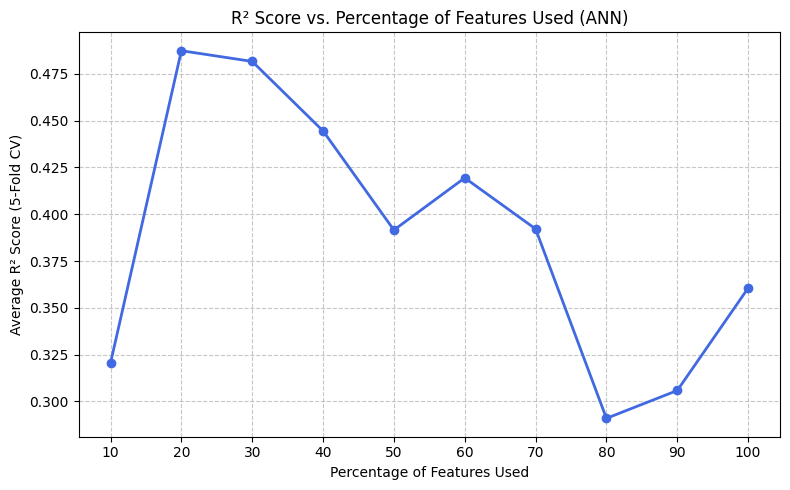

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from tensorflow import keras
from tensorflow.keras import layers

# Prepare data
X = df_m.drop(columns=['OM', 'SAMPLEDATE','Elevation','lati','long', 'Sensor_OM', 'aws_0_20s',
                       'Standardized_Height','Normalized_Height','rootznaws'])
y = df_m['OM']
X = X.dropna()
y = y[X.index]

# Normalize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Feature selector
feature_selector = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
feature_selector.fit(X_scaled, y)

# Rank features by importance
feature_importance = feature_selector.feature_importances_
feature_ranking = np.argsort(feature_importance)[::-1]
sorted_features = X.columns[feature_ranking]

# Function to build ANN model
def build_ann(input_shape):
    model = keras.Sequential([
        layers.Dense(128, activation='relu', input_shape=(input_shape,)),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# Initialize result storage
percentages = list(range(10, 110, 10))  # 10% to 100%
r2_scores_vs_features = []

# K-Fold setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Loop over feature percentages
for percent in percentages:
    num_features = int(len(sorted_features) * percent / 100)
    selected = sorted_features[:num_features]
    X_selected = X[selected].values
    X_selected = scaler.fit_transform(X_selected)

    fold_r2 = []

    for train_idx, test_idx in kf.split(X_selected):
        X_train, X_test = X_selected[train_idx], X_selected[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        ann = build_ann(X_train.shape[1])
        ann.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0)

        y_pred = ann.predict(X_test).flatten()
        r2 = r2_score(y_test, y_pred)
        fold_r2.append(r2)

    r2_scores_vs_features.append([percent, np.mean(fold_r2)])
    print(f"{percent}% features → R² = {np.mean(fold_r2):.4f}")

# Convert to DataFrame
r2_df = pd.DataFrame(r2_scores_vs_features, columns=["% Features", "R² Score"])

# Plot R² vs. % Features
plt.figure(figsize=(8, 5))
plt.plot(r2_df["% Features"], r2_df["R² Score"], marker='o', color='royalblue', linewidth=2)
plt.title("R² Score vs. Percentage of Features Used (ANN)")
plt.xlabel("Percentage of Features Used")
plt.ylabel("Average R² Score (5-Fold CV)")
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(range(10, 110, 10))
plt.tight_layout()
plt.show()


PLOTTING

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

# Define a function to create scatter plots for each model with best-fit line, 1:1 line, and ±20% shaded area
def plot_scatter(df_dict):
    num_models = len(df_dict)

    # Determine number of rows and columns for subplots dynamically
    rows = (num_models // 2) + (num_models % 2)  # 2 plots per row
    cols = 2 if num_models > 1 else 1  # Use 1 column if only 1 model

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten() if num_models > 1 else [axes]  # Handle single plot


    # Iterate through each model and plot
    for i, (name, df) in enumerate(df_dict.items()):
        # Access the correct column names for actual and predicted values
        actual_col = 'Actual Yield'  # Use 'Actual Yield' if available, otherwise fallback to 'Actual OM'
        predicted_col = 'Predicted Yield'  # Use 'Predicted Yield' if available, otherwise fallback to 'Predicted OM'

        if 'Actual OM' in df.columns:
            actual_col = 'Actual OM'
        if 'Predicted OM' in df.columns:
            predicted_col = 'Predicted OM'

    # Iterate through each model and plot
    for i, (name, df) in enumerate(df_dict.items()):

        # Scatter plot of actual vs predicted yields
        axes[i].scatter(df[actual_col], df[predicted_col], color='blue', alpha=0.5, label='Data Points')

        # Best-fit regression line
        X_actual = df[actual_col].values.reshape(-1, 1)
        y_predicted = df[predicted_col].values
        reg = LinearRegression().fit(X_actual, y_predicted)
        best_fit_y = reg.predict(X_actual)
        axes[i].plot(df[actual_col], best_fit_y, color='blue', lw=2, linestyle='-', label='Best Fit Line')

        # Plot the 1:1 line (perfect prediction line)
        min_val, max_val = min(df[actual_col]), max(df[actual_col])
        axes[i].plot([min_val, max_val], [min_val, max_val], color='red', lw=2, linestyle='--', label='1:1 Line')

        # Add shaded ±20% error margin area
        axes[i].fill_between([min_val, max_val],
                             [min_val * 1.15, max_val * 1.15],
                             [min_val * 0.85, max_val * 0.85],
                             color='green', alpha=0.2, label='±15% Error Margin')

        # Calculate R² value
        r2 = r2_score(df[actual_col], df[predicted_col])

        # Set title with R² value
        axes[i].set_title(f'{name} Model')

        # Display R² score in the top right corner with custom text style
        axes[i].text(0.80, 0.10, f'R² = {r2:.2f}', transform=axes[i].transAxes,
                     ha='right', va='top', fontsize=12, color='red', weight='bold')

        # Labels, grid, and legend
        axes[i].set_xlabel('Actual ORGANIC MATTER (%)')
        axes[i].set_ylabel('Predicted ORGANIC MATTER (%)')
        axes[i].grid(True)
        axes[i].legend()

    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()

# Create a dictionary to store DataFrames for each model
df_dict = {
    'KNN': df_knn,
    'Random Forest': df_rf,
    'Gradient Boosting': df_gb,
    'Decision Tree': df_dt,
    'XGBoost': df_xgb,
    'LightGBM': df_lgb,
    'Stacking Regressor': df_sr,
    'DNN': df_dnn,
    'ANN': df_ann,
    'KSVM': df_ksvm  # Added Kernelized Support Vector Machines (KSVM)
}

# Now call the plot function to generate the scatter plots for all models
plot_scatter(df_dict)

NameError: name 'df_knn' is not defined